In [1]:
import numpy as np
from numba import njit
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.dates as mdates
from matplotlib.colors import LogNorm, Normalize
import pandas as pd
import pickle
from datetime import datetime,timedelta, date
import strax
import straxen
import cutax
from tqdm.notebook import tqdm, trange
strax.utils.tqdm = tqdm
from multihist import Hist1d, Histdd

import copy
from matplotlib import cm
from scipy import stats
import feldman_cousins as fc
from scipy.stats import poisson
from scipy.optimize import minimize, rosen, rosen_der
import h5py

import GOFevaluation as ge
import scipy.stats as sps
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

In [2]:
import os
style = os.path.join(os.environ['HOME'], 'nton/mplconfigs/stylelib/xenonnt.mplstyle')   
plt.style.use(style)

In [3]:
%matplotlib inline

In [4]:
mpl.rcParams['figure.dpi'] = 130
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.size'] = 9

In [37]:
%run -i 'YBe_tool.py'
%run -i 'stuff_to_load.py'
mode='3-fold'
# mode='2-fold-only'

<Figure size 1300x780 with 0 Axes>

In [6]:
Y88_hl=106.6
kbq_initial=698
kbq_sim=389
day_lapse=-np.log(kbq_sim/kbq_initial)/np.log(2)*Y88_hl
#2022-6-1 initial date
source_date=datetime(2022,6,1)+timedelta(days=day_lapse)
dt=(datetime(2022,10,5)-source_date)/timedelta(days=1)

In [6]:
# for i in data_cuts:
#     print(i)

In [8]:
# ddt=75#(datetime(2022,12,5)-datetime(2022,10,5))
# np.exp(-ddt/(Y88_hl/np.log(2)))

In [7]:
hour=183.78

# gamma_ineff=0.9 #NR inefficincy due to gamma coincident
# start_to_mid=0.9809

gamma_ratio=0.93356 #gamma ratio between YBe and Y88 run
# one_week_decay=np.exp(-7/(Y88_hl/np.log(2))) #fitted source decay rate

# sim_ratio=1/(start_to_mid*one_week_decay**2) #old scaling
sim_ratio=1/(np.exp(-dt/(Y88_hl/np.log(2)))) #new scaling

s_hour=15393*sim_ratio #hours of simulation, in the same rate as YBe run
b_hour=142.21*gamma_ratio #hours of background run, in the rate, in the same rate as YBe run
y_hour=365*24
bkg_s=hour/b_hour #pre-scaling for Y88 
sim_s=hour/s_hour #pre-scaling for YBe simulation

In [8]:
# data_cuts=pd.read_hdf("good_data.hdf5")
bkg=pd.read_hdf("/dali/lgrandi/ghusheng/YBe_data/YBe_superrun/YBe_V1/Y88_event_info_143runs_142.21hrs_all_cuts_with_run_ids_v1.hdf5")
data=pd.read_hdf("/dali/lgrandi/ghusheng/YBe_data/YBe_superrun/YBe_V1/YBe_event_info_239runs_183.78hrs_all_cuts_with_run_ids_v1.hdf5")


# bkg=pd.read_hdf("/dali/lgrandi/ghusheng/YBe_data/YBe_superrun/Y88_event_info_143runs_142.21hrs_all_cuts_with_run_ids.hdf5")
# data=pd.read_hdf("/dali/lgrandi/ghusheng/YBe_data/YBe_superrun/YBe_event_info_239runs_183.78hrs_all_cuts_with_run_ids.hdf5")
# # sim=pd.read_hdf("good_sim.hdf5") #3-fold
# sim_raw=pd.read_csv("/dali/lgrandi/pkavrigin/2022-10-19_YBeNeutron/event_info.csv") #raw sim
sim_raw=pd.read_csv("/dali/lgrandi/xenonnt/simulations/ybe_neutron/ybe_neu_event_info.csv")

In [9]:
def df_2fold(df):
    return df[(df['cut_s1_tightcoin_3fold']==False)&(df.s1_n_hits==2)]
def df_cut_SA(data_cuts_2only):
    return data_cuts_2only[(data_cuts_2only.cut_position_shadow)&(data_cuts_2only.cut_time_shadow)&(data_cuts_2only.cut_ambience)]

In [10]:
#quality cuts 2fold only
if mode=='2-fold-only':
    ac_h5 = '/dali/lgrandi/xudc/ac_ybe_1109.h5'
    y_hour=365*24
    with h5py.File(ac_h5, 'r', libver='latest', swmr=True) as ipt:
        normalization = ipt['fold2_df'].attrs['normalization']

    ac_sim_2only = pd.read_hdf(ac_h5, key='fold2_df')#, columns=['cs1', 'cs2', 'cut_fiducial_volume', 'cut_near_wires'])
    data_cuts_2only = data.query(' and '.join(targets_2fold[1:]))
    bkg_cuts_2only = bkg.query(' and '.join(targets_2fold[1:]))
    sim_2only = sim_raw.query(' and '.join(targets_2fold[1:]))
    ac_sim_cuts_2only = ac_sim_2only[ac_sim_2only.cut_fiducial_volume]
    s1_bins=np.linspace(1.5,20.5,20)
    data_cuts_2only=df_2fold(data_cuts_2only)
    bkg_cuts_2only=df_2fold(bkg_cuts_2only)
    sim_2only=df_2fold(sim_2only)
    
    # ac_sim_2only=
    # del bkg
    # del data
    # del sim_raw

The history saving thread hit an unexpected error (OperationalError('unable to open database file')).History will not be written to the database.


In [127]:
data_2f_clean=wire_cut(df_cut_SA(data_cuts_2only))
# sim_2f_clean=df_cut_SA(sim_2only)
bkg_2f_clean=wire_cut(df_cut_SA(bkg_cuts_2only))
sim_2f_clean=wire_cut(sim_2only[sim_2only.s1_n_hits==2])

In [59]:
data_2f_clean.s1_n_hits.unique()

array([2], dtype=int16)

In [50]:
mode='3-fold'

In [67]:
#quality cuts 3fold
if mode=='3-fold':
    ac_h5 = '/dali/lgrandi/xudc/ac_ybe_1109.h5'

    with h5py.File(ac_h5, 'r', libver='latest', swmr=True) as ipt:
        normalization = ipt['fold3_df'].attrs['normalization']

    ac_sim = pd.read_hdf(ac_h5, key='fold3_df', columns=['cs1', 'cs2', 'cut_fiducial_volume', 'cut_near_wires','x','y','r','z'])
    data_cuts = data.query(' and '.join(targets_3fold[1:]))
    bkg_cuts = bkg.query(' and '.join(targets_3fold[1:]))
    sim = sim_raw.query(' and '.join(targets_3fold[1:]))
    ac_sim_cuts = ac_sim[ac_sim.cut_fiducial_volume]
    s1_bins=np.linspace(2.5,20.5,19)
    # del bkg
    # del data
    # del sim_raw

In [68]:
#get ac temp with wire FV cuts
ac_sample_to_fit=ac_sim[(ac_sim.cut_fiducial_volume==True)&(ac_sim.cut_near_wires==False)]

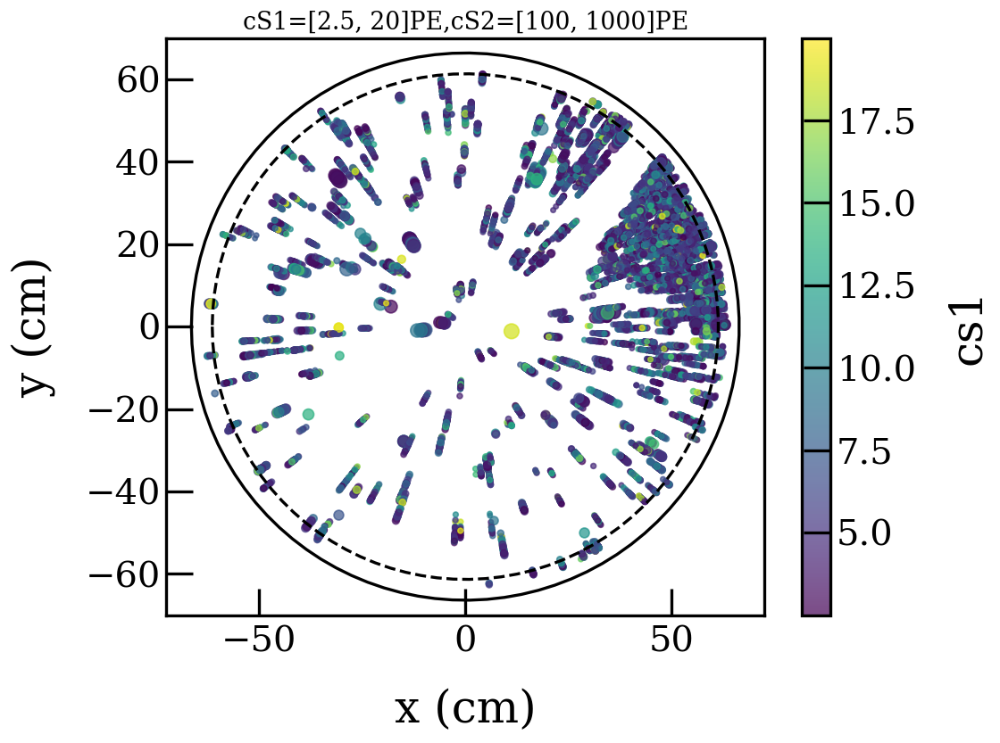

In [73]:
#check xy
cs1_range=[2.5,20]
cs2_range=[100,1000]
plot_xy(cut_cs1cs2(ac_sample_to_fit[:20000],cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

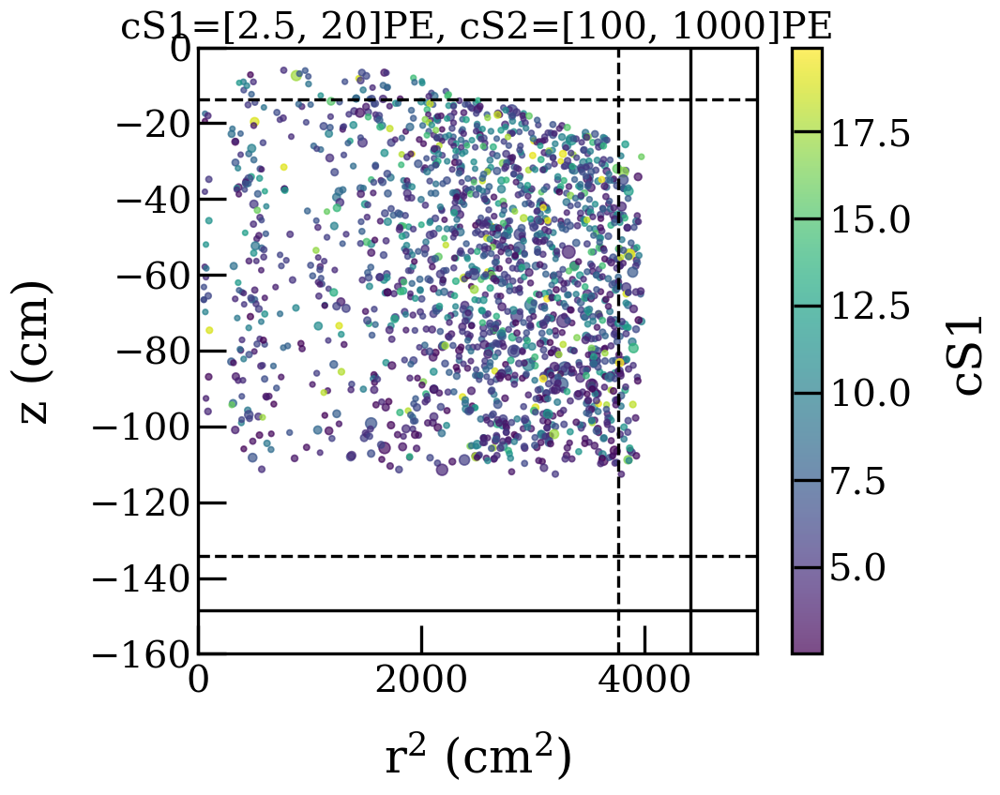

In [75]:
#check xy
cs1_range=[2.5,20]
cs2_range=[100,1000]
plot_rz(cut_cs1cs2(ac_sample_to_fit[:2000],cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

/opt/XENONnT/anaconda/envs/XENONnT_2022.09.1/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


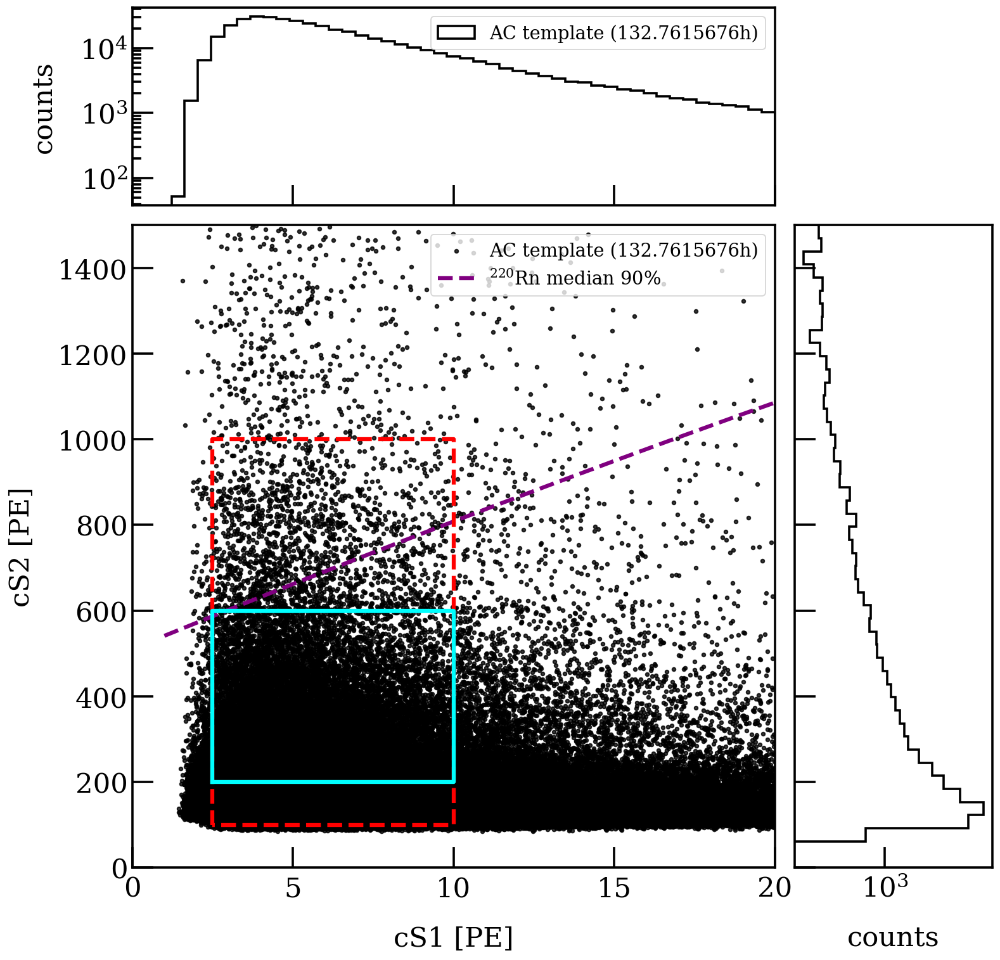

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [26]:

plot_cs1cs2_simple(ac_sample_to_fit,df_sim=None,data_label=f'AC template ({b_hour}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

In [18]:
#real ACs
bkg_clean=wire_cut(df_cut_SA(bkg_cuts))

In [44]:
AC_hour=1/normalization*365*24

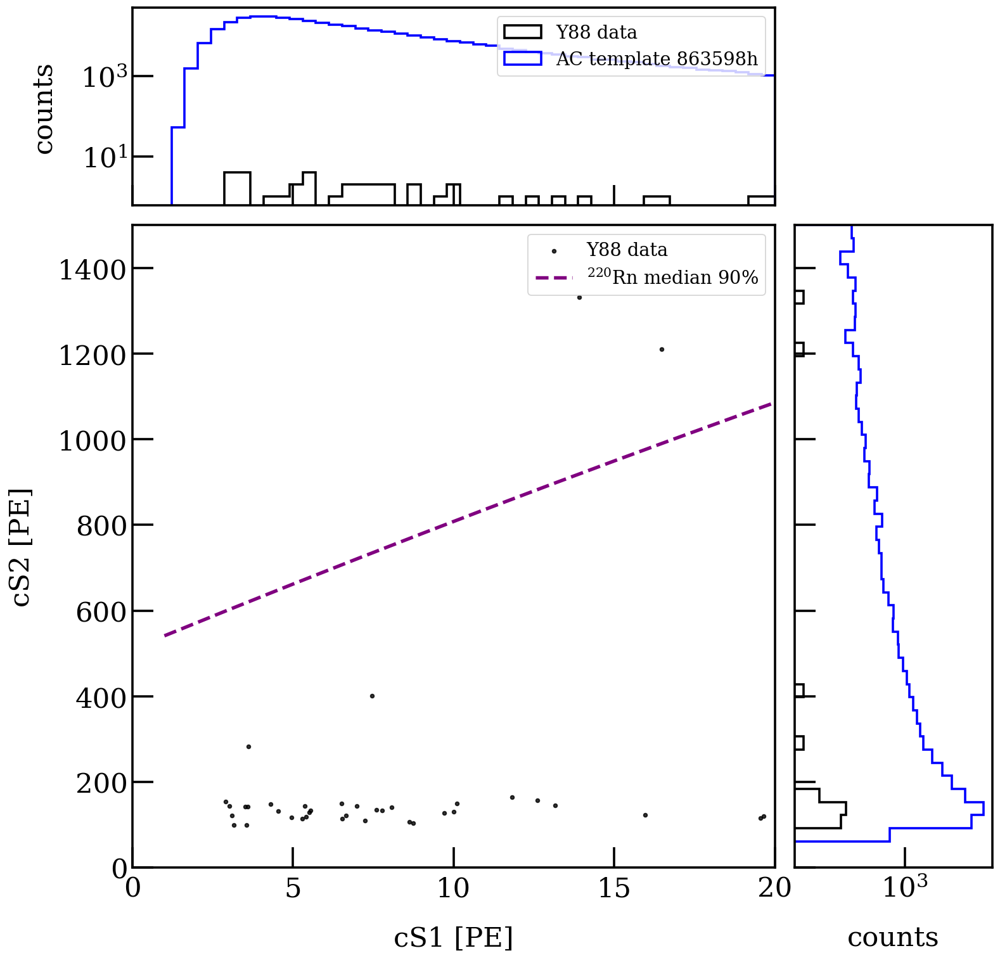

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [45]:

plot_cs1cs2(bkg_clean,df_sim=ac_sample_to_fit,data_label=f'Y88 data',sim_label=f'AC template {AC_hour:.0f}h')#,plot_sim='contour')

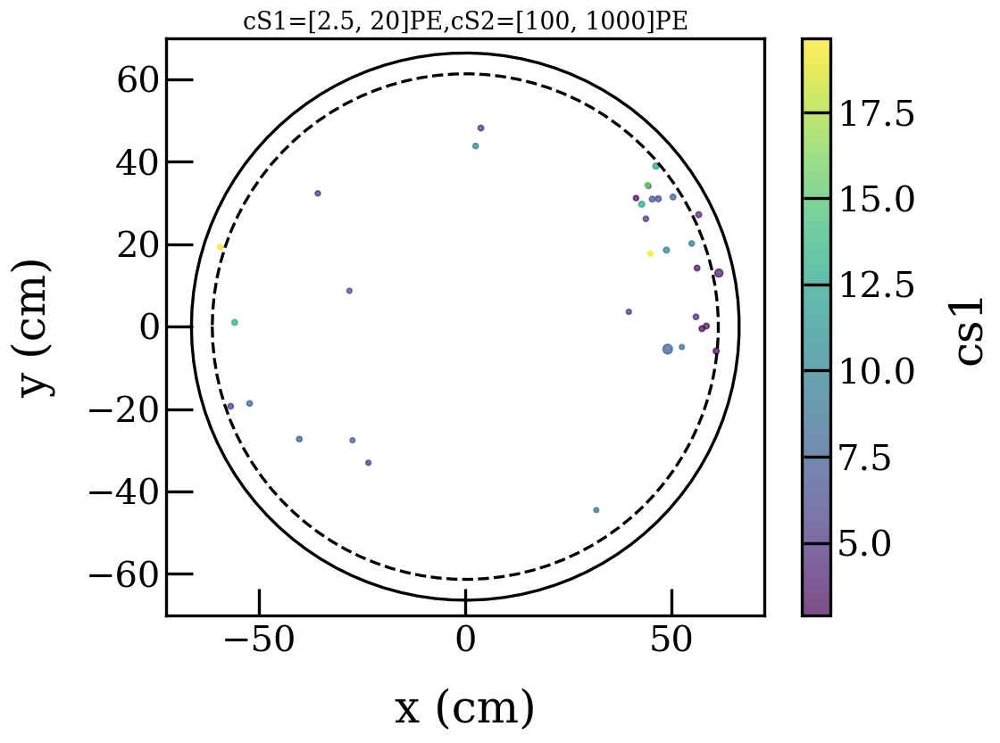

In [64]:
#check xy
cs1_range=[2.5,20]
cs2_range=[100,1000]
plot_xy(cut_cs1cs2(bkg_clean,cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

In [49]:
len(cut_cs1cs2(bkg_clean,cs1=cs1_range,cs2=cs2_range))/len(ac_sample_to_fit)

0.014023564671395958

In [50]:
normalization

0.010143604147628311

In [54]:
len(ac_sample_to_fit)*bkg_sim_s

97.13502117292784

29 3344.6324112228376


/opt/XENONnT/anaconda/envs/XENONnT_2022.09.1/lib/python3.8/site-packages/sklearn/preprocessing/_discretization.py:209: FutureWarning: In version 1.3 onwards, subsample=2e5 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(
/home/scli/GOFevaluation/GOFevaluation/evaluator_base.py:189: UserWarning: p-value is 0.0. (Observed GoF: 7.31e+01, maximum of simulated GoFs: 7.08e+01). For a more precise result, increase n_mc!
  pvalue, _ = self._get_pvalue(n_mc=n_mc)


GOF = 73.13
p-value = 0.0000



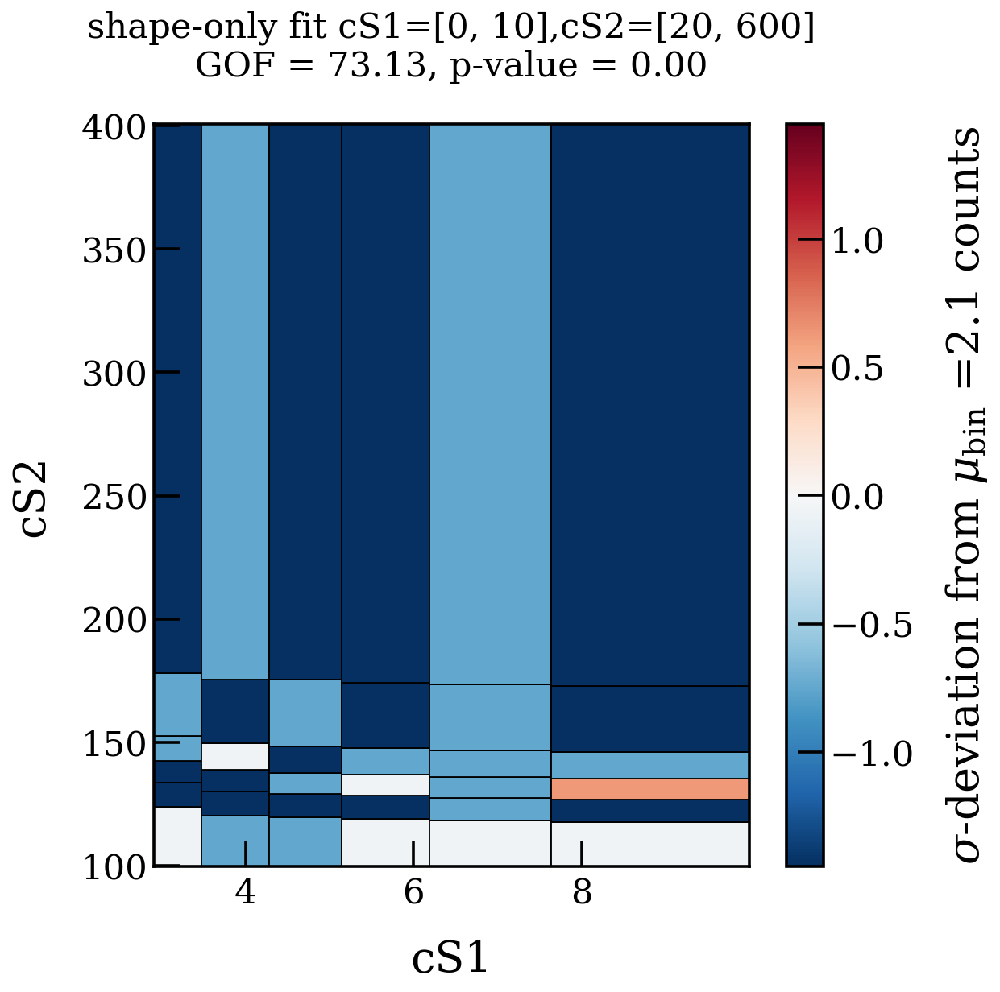

In [59]:
#GOF for AC template
# cs1_range=[2.5,10]
cs1_range=[0,10]
cs2_range=[20,600]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(bkg_clean,ac_sample_to_fit,cs1_range,cs2_range,label='shape-only fit ',sim_scale=bkg_sim_s)


36 4053.7877321817214


/opt/XENONnT/anaconda/envs/XENONnT_2022.09.1/lib/python3.8/site-packages/sklearn/preprocessing/_discretization.py:209: FutureWarning: In version 1.3 onwards, subsample=2e5 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(
/home/scli/GOFevaluation/GOFevaluation/evaluator_base.py:189: UserWarning: p-value is 0.0. (Observed GoF: 8.84e+01, maximum of simulated GoFs: 8.17e+01). For a more precise result, increase n_mc!
  pvalue, _ = self._get_pvalue(n_mc=n_mc)


GOF = 88.40
p-value = 0.0000



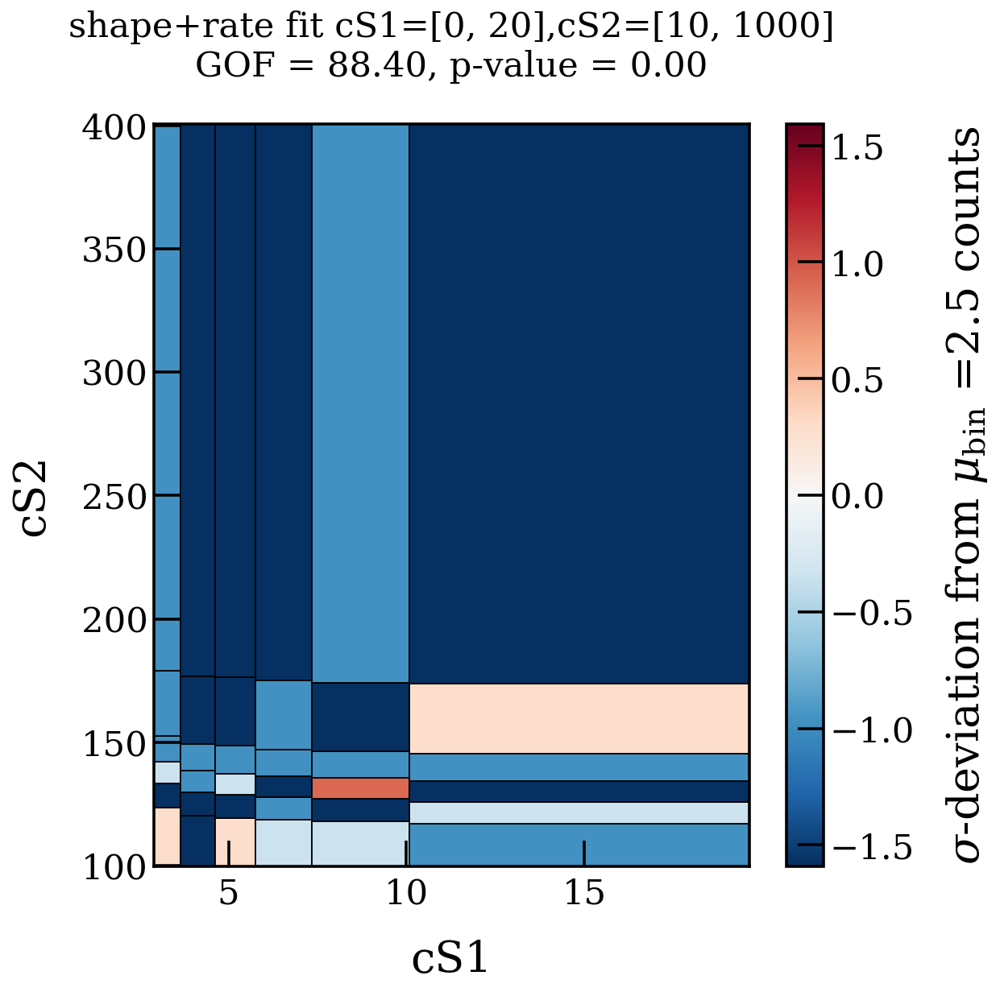

In [63]:
#GOF for AC template
# cs1_range=[2.5,10]
cs1_range=[0,20]
cs2_range=[10,1000]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(bkg_clean,ac_sample_to_fit,cs1_range,cs2_range,label='shape+rate fit ',sim_scale=bkg_sim_s)


29 3344.6324112228376


/opt/XENONnT/anaconda/envs/XENONnT_2022.09.1/lib/python3.8/site-packages/sklearn/preprocessing/_discretization.py:209: FutureWarning: In version 1.3 onwards, subsample=2e5 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


GOF = 35.77
p-value = 0.7490



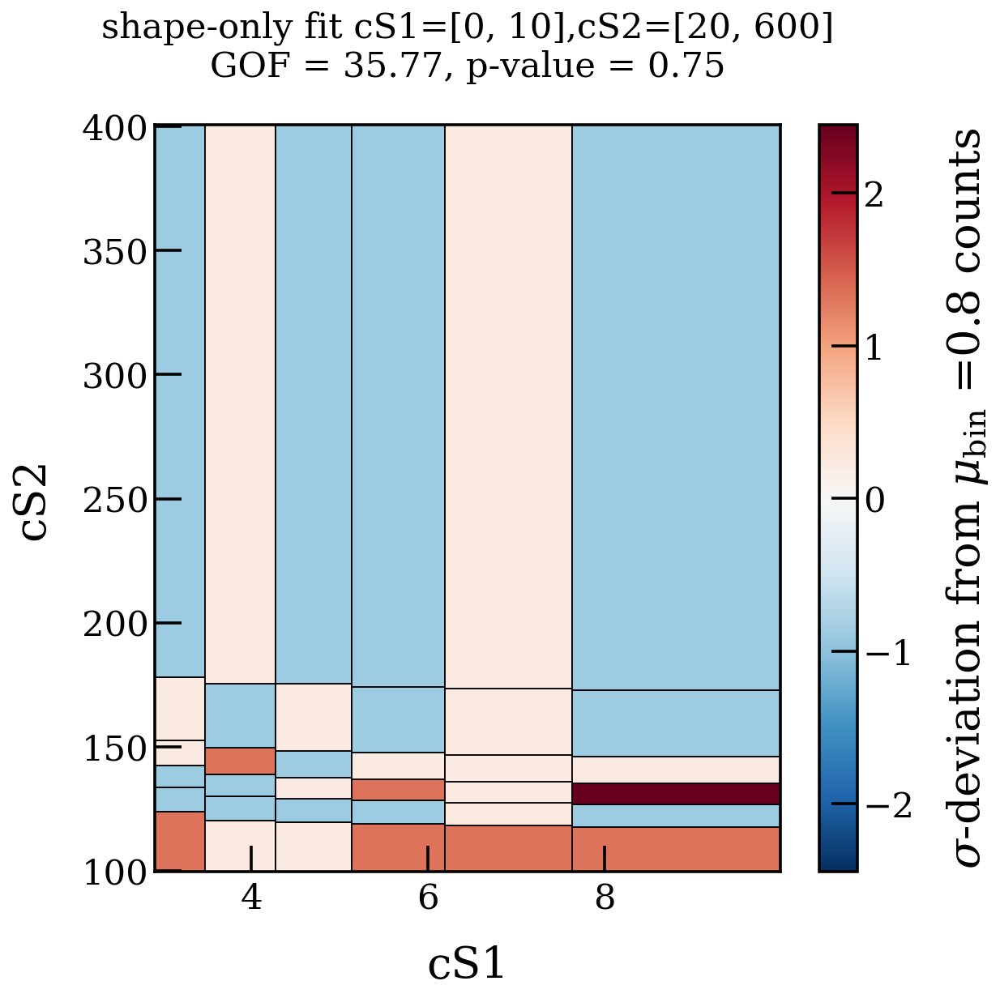

In [61]:
#GOF for AC template
# cs1_range=[2.5,10]
cs1_range=[0,10]
cs2_range=[20,600]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(bkg_clean,ac_sample_to_fit,cs1_range,cs2_range,label='shape-only fit ')


36 4053.7499639437133


/opt/XENONnT/anaconda/envs/XENONnT_2022.09.1/lib/python3.8/site-packages/sklearn/preprocessing/_discretization.py:209: FutureWarning: In version 1.3 onwards, subsample=2e5 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


GOF = 44.73
p-value = 0.32



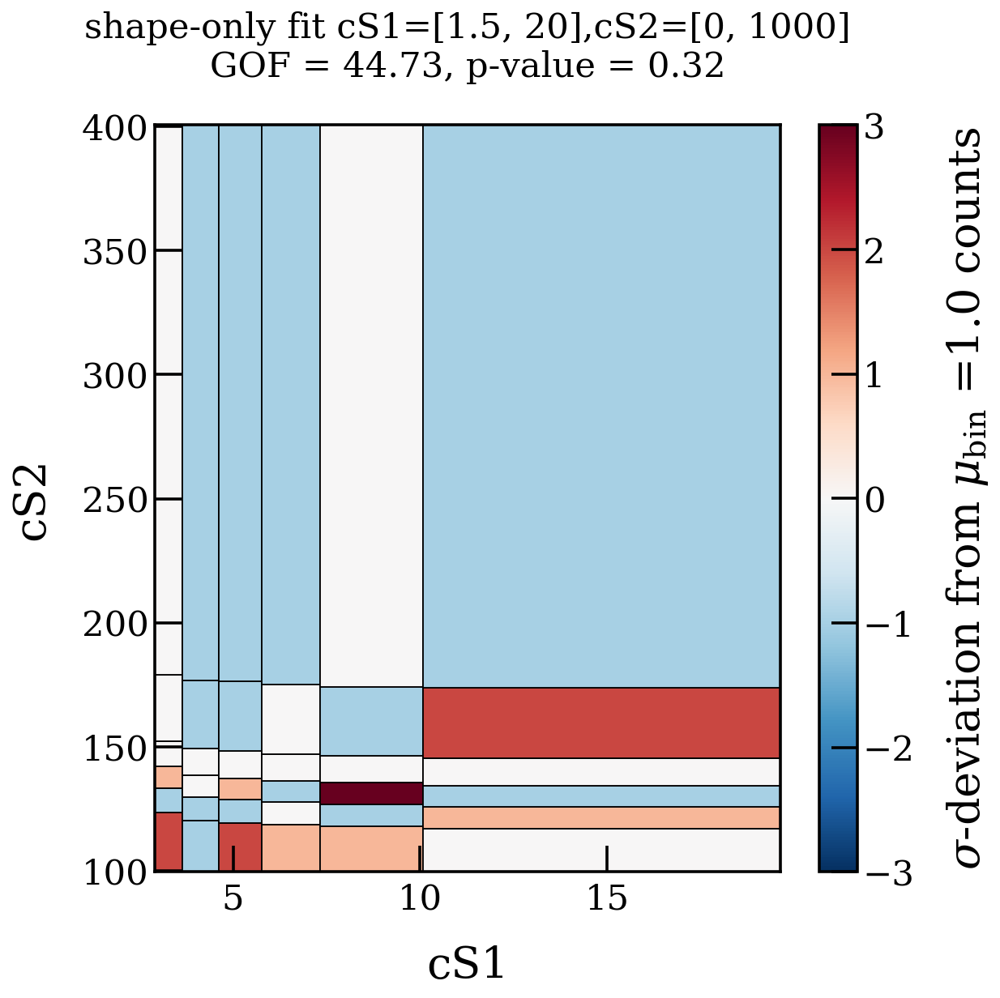

In [35]:
#GOF for AC template
# cs1_range=[2.5,10]
cs1_range=[1.5,20]
cs2_range=[0,1000]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(bkg_clean,ac_sample_to_fit,cs1_range,cs2_range,label='shape-only fit ')


In [ ]:
# cs1_range=[2.5,10]
cs1_range=[1.5,10]
cs2_range=[250,600]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(d_in,s_in,cs1_range,cs2_range,label='wire cut + expected rate \n',sim_scale=sim_s)

In [12]:
ls /dali/lgrandi/scli/YBe_data/sim_3fold_clean_cuts.hdf5

/dali/lgrandi/scli/YBe_data/sim_3fold_clean_cuts.hdf5


In [33]:
data_cuts.to_hdf('/dali/lgrandi/scli/YBe_data/YBe_data_3fold_clean_cuts.hdf5','data')
bkg_cuts.to_hdf('/dali/lgrandi/scli/YBe_data/Y88_data_3fold_clean_cuts.hdf5','data')

In [47]:
#quality cuts 2fold
if mode=='2-fold':
    ac_h5 = '/dali/lgrandi/xudc/ac_ybe_1109.h5'
    y_hour=365*24
    with h5py.File(ac_h5, 'r', libver='latest', swmr=True) as ipt:
        normalization = ipt['fold2_df'].attrs['normalization']

    ac_sim = pd.read_hdf(ac_h5, key='fold2_df', columns=['cs1', 'cs2', 'cut_fiducial_volume', 'cut_near_wires'])
    data_cuts = data.query(' and '.join(targets_2fold[1:]))
    bkg_cuts = bkg.query(' and '.join(targets_2fold[1:]))
    sim = sim_raw.query(' and '.join(targets_2fold[1:]))
    ac_sim_cuts = ac_sim[ac_sim.cut_fiducial_volume]
    s1_bins=np.linspace(1.5,20.5,20)
    del bkg
    del data
    del sim_raw

In [134]:
 normalization

0.09086264074139766

In [52]:
ac_fix=len(ac_sim_cuts)/len(bkg_cuts)
# bkg_sim_s=sim_s/ac_fix
bkg_sim_s=hour/y_hour* normalization
bkg_sim_s

0.00021280725687798302

In [12]:
import GOFevaluation as ge
data_sample=cut_cs1cs2(data_cuts,cs1=[2.5,20],cs2=[200,600])
reference_sample=cut_cs1cs2(sim,cs1=[2.5,20],cs2=[200,600])

data_sample=np.array(data_sample[['cs1','cs2']])
reference_sample=np.array(reference_sample[['cs1','cs2']])
ref_model_0=reference_sample

In [13]:
# # # Bin Data & Reference
# bin_edges = [np.linspace(0, 10, 5), np.linspace(100, 1000, 11)]

# x, y = np.meshgrid((bin_edges[0][:-1] + bin_edges[0][1:]) / 2,
#                    (bin_edges[1][:-1] + bin_edges[1][1:]) / 2)
# bin_centers = np.stack((x, y), axis=2)

# binned_data, _ = np.histogramdd(data_sample, bins=bin_edges)

# pdf_0, _ = np.histogramdd(reference_sample, bins=bin_edges)

# pdf_0 /= np.sum(pdf_0)
# expectations_0 = pdf_0 * n_expectations

# # pdf_1 = ref_model_1.pdf(bin_centers).T
# # pdf_1 /= np.sum(pdf_1)
# # expectations_1 = pdf_1 * n_expectations


In [1]:
# for i, pdf in enumerate([pdf_0]):
#     gof_object = ge.BinnedPoissonChi2GOF(data_sample=data_sample,
#                                          pdf=pdf,
#                                          bin_edges=bin_edges,
#                                          nevents_expected=n_expectations,plot=True)
#     gof_object.get_pvalue()
#     print(f'\033[1mReference {i}\033[0m')
#     print(f'GOF = {gof_object.gof:.2f}')
#     print(f'p-value = {gof_object.pvalue:.2f}\n')

In [ ]:
    # data_cut_s2=cut_cs1cs2(wire_cut(data_cuts),cs1=[2.5,20],cs2=[cut,upper])
    # bkg_cut_s2=cut_cs1cs2(wire_cut(bkg_cuts),cs1=[2.5,20],cs2=[cut,upper])
    # sim_cut_s2=cut_cs1cs2(wire_cut(sim),cs1=[2.5,20],cs2=[cut,upper])

373 234.7295992202733


/home/scli/GOFevaluation/GOFevaluation/evaluator_base.py:189: UserWarning: p-value is 0.0. (Observed GoF: 2.85e+02, maximum of simulated GoFs: 7.17e+01). For a more precise result, increase n_mc!
  pvalue, _ = self._get_pvalue(n_mc=n_mc)


GOF = 285.07
p-value = 0.00



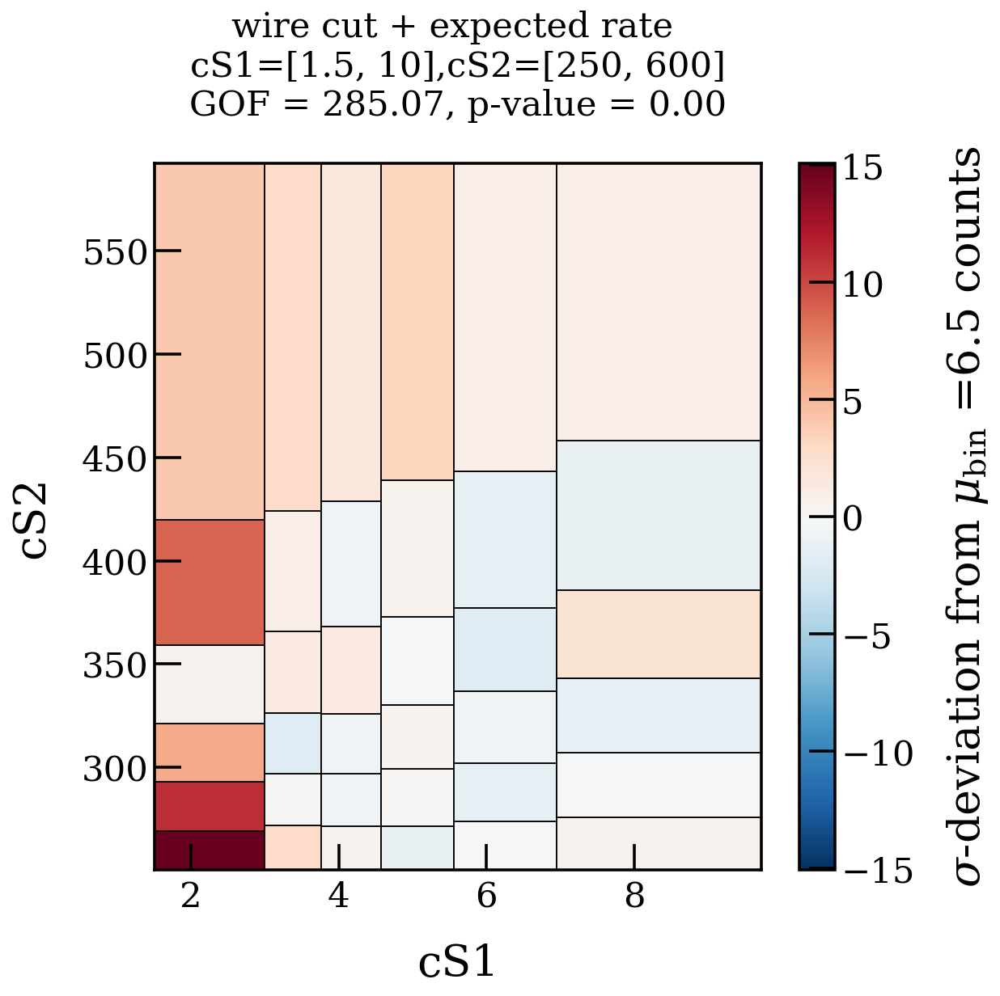

In [81]:
# cs1_range=[2.5,10]
cs1_range=[1.5,10]
cs2_range=[250,600]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(d_in,s_in,cs1_range,cs2_range,label='wire cut + expected rate \n',sim_scale=sim_s)

199 175.23518229803105
GOF = 37.49
p-value = 0.46



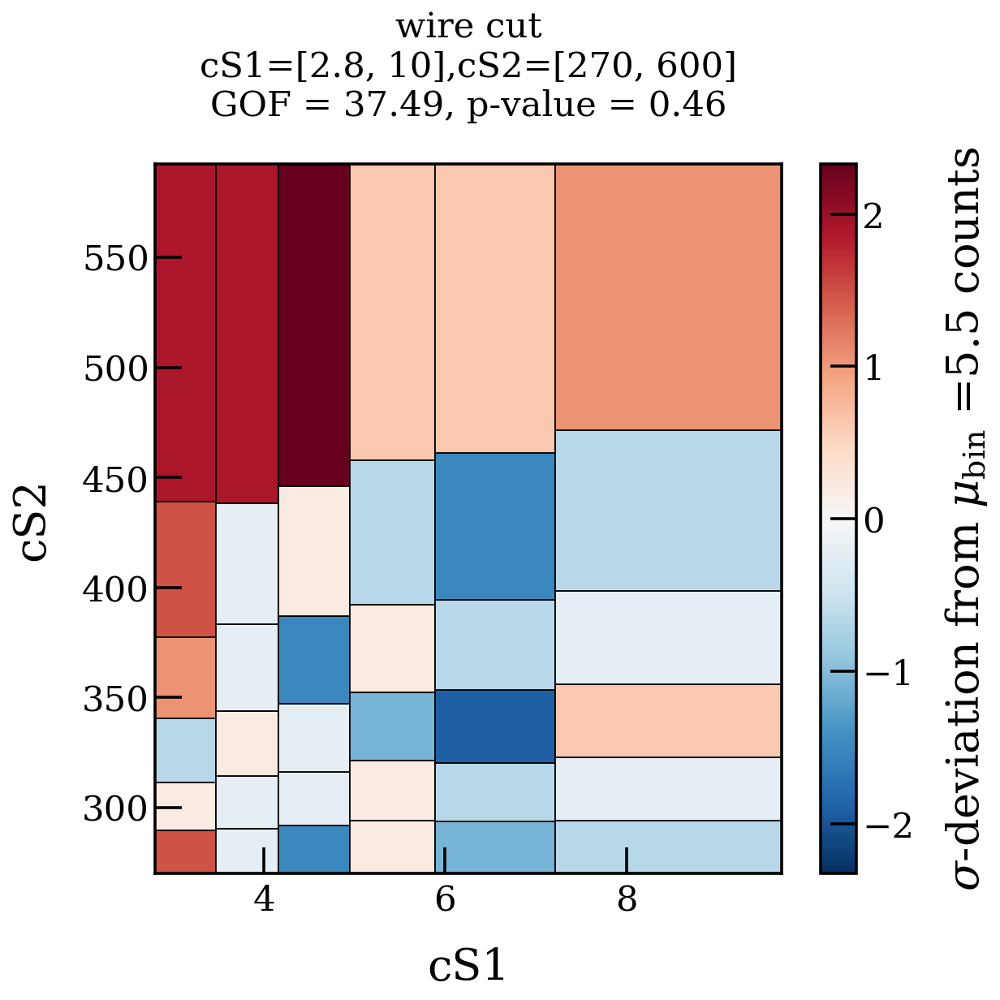

In [99]:
# cs1_range=[2.5,10]
cs1_range=[2.8,10]
cs2_range=[270,600]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(d_in,s_in,cs1_range,cs2_range,label='wire cut\n')

6532 610.6368721147834


/tmp/jobs/23632566/ipykernel_205/1752445411.py:22: UserWarning: Number of reference samples (64672) should be much larger than number of data samples (6532) to ensure negligible statistical fluctuations for the equiprobable binning.
  gof_object = ge.BinnedPoissonChi2GOF.bin_equiprobable(data_sample=data_sample,
/home/scli/GOFevaluation/GOFevaluation/evaluator_base.py:189: UserWarning: p-value is 0.0. (Observed GoF: 3.49e+04, maximum of simulated GoFs: 7.45e+01). For a more precise result, increase n_mc!
  pvalue, _ = self._get_pvalue(n_mc=n_mc)


GOF = 34867.89
p-value = 0.00



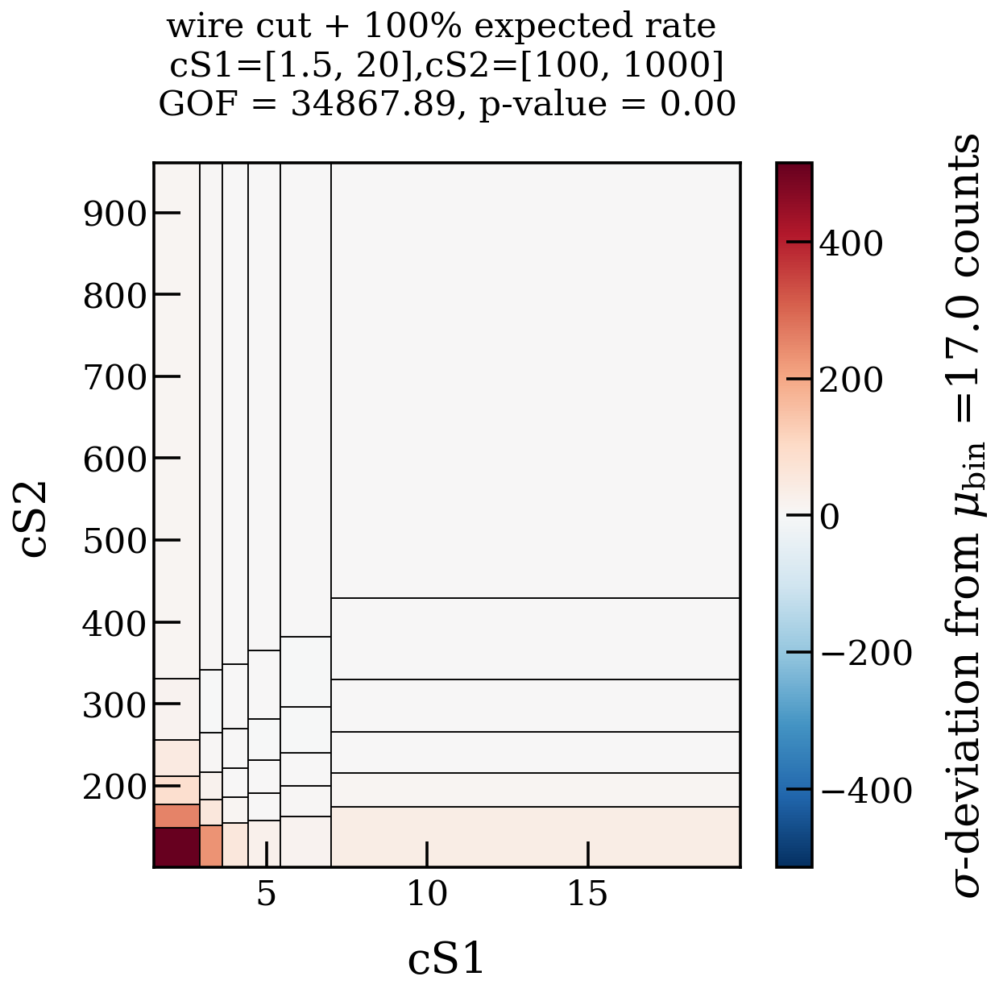

In [45]:
cs1_range=[1.5,20]
# cs1_range=[2.5,20]
cs2_range=[100,1000]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(d_in,s_in,cs1_range,cs2_range,label='wire cut + 100% expected rate \n',sim_scale=sim_s)

119 66.61372978676702


/home/scli/GOFevaluation/GOFevaluation/evaluator_base.py:189: UserWarning: p-value is 0.0. (Observed GoF: 7.15e+01, maximum of simulated GoFs: 6.47e+01). For a more precise result, increase n_mc!
  pvalue, _ = self._get_pvalue(n_mc=n_mc)


GOF = 71.47
p-value = 0.00



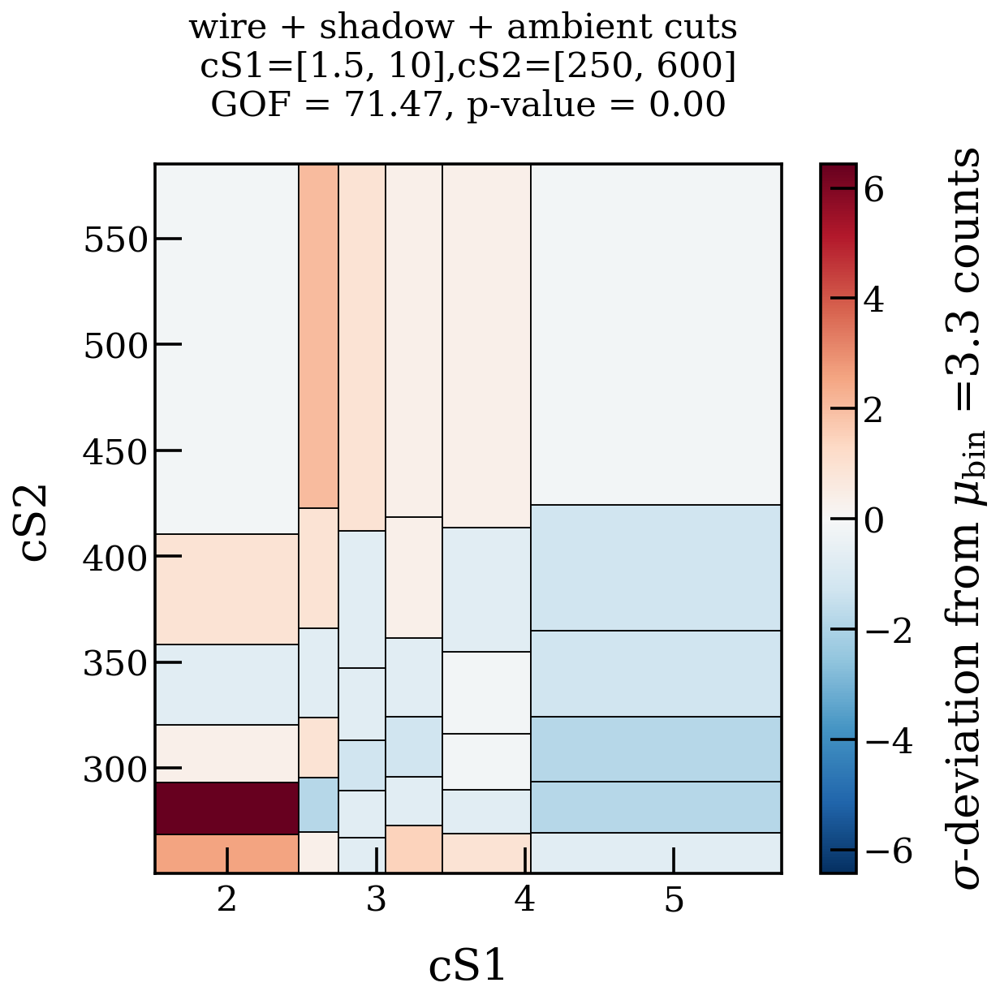

In [66]:
#s2 only 

# cs1_range=[2.5,10]
cs1_range=[1.5,10]
cs2_range=[250,600]
d_in=cut_cs1cs2(data_2f_clean,cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim_2only),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(d_in,s_in,cs1_range,cs2_range,label='wire + shadow + ambient cuts \n',sim_scale=None)

58 33.80257301723968
GOF = 39.77
p-value = 0.59



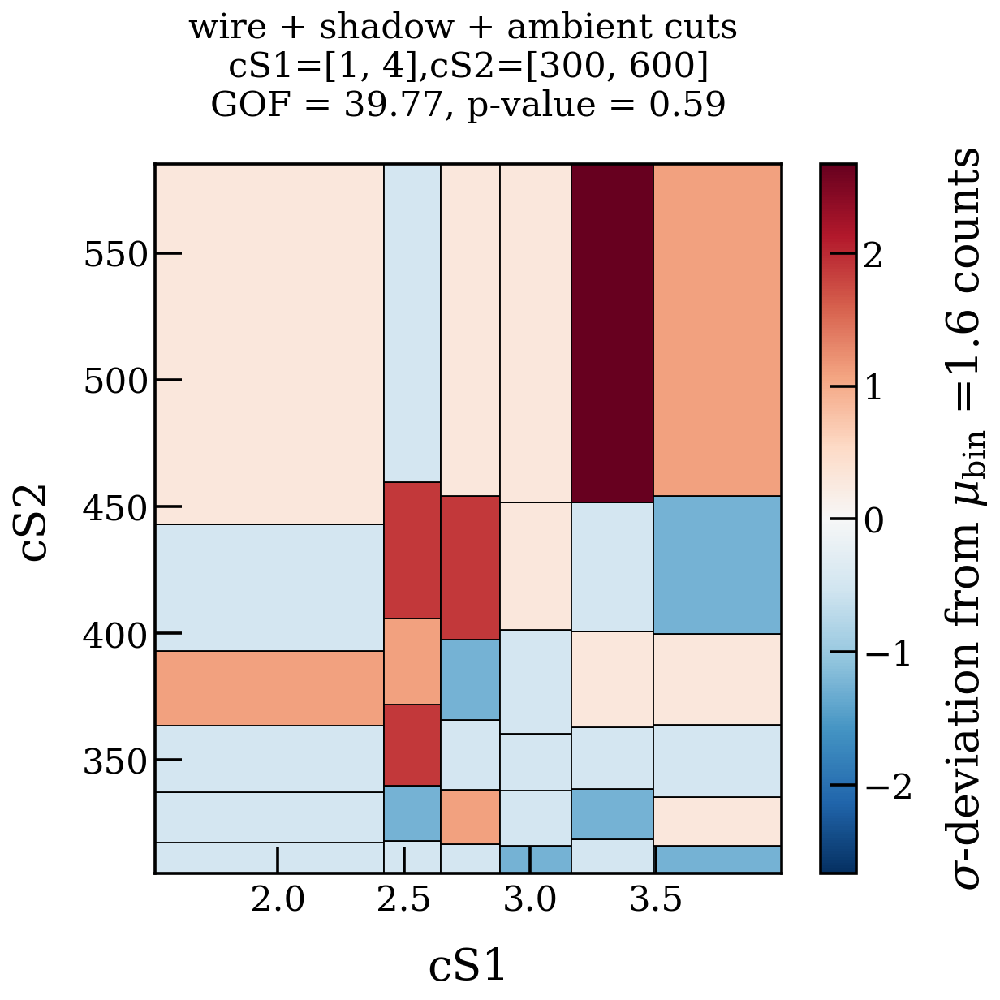

In [78]:
#s2 only 

# cs1_range=[2.5,10]
cs1_range=[1,4]
cs2_range=[300,600]
d_in=cut_cs1cs2(data_2f_clean,cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(sim_2f_clean,cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(d_in,s_in,cs1_range,cs2_range,label='wire + shadow + ambient cuts \n',sim_scale=None)

In [58]:

def GOF_equal_prob(data,sim,cs1_range,cs2_range,label='',sim_scale=None):

    data_sample=cut_cs1cs2(data,cs1=cs1_range,cs2=cs2_range)
    reference_sample=cut_cs1cs2(sim,cs1=cs1_range,cs2=cs2_range)

    data_sample=np.array(data_sample[['cs1','cs2']])
    reference_sample=np.array(reference_sample[['cs1','cs2']])
    ref_model_0=reference_sample

    fig, axes = plt.subplots(1, 1, figsize=(10, 10))
    if(sim_scale==None):
        n_expectations=len(data_sample)
    else:
        n_expectations=len(reference_sample)*sim_scale
    print(len(data_sample),len(reference_sample)*sim_s )
    # define eqpb parameters
    order = [0, 1]  # [0, 1] means that first dimension 0 is binned, then dimension 1
    n_partitions = [6, 6]  # 5 partitions in dim. 0 and 6 partitions in dim. 1

    # perform GOF tests
    for i, reference_sample in enumerate([reference_sample]):
        gof_object = ge.BinnedPoissonChi2GOF.bin_equiprobable(data_sample=data_sample,
                                                              reference_sample=reference_sample,
                                                              nevents_expected=n_expectations,
                                                              n_partitions=n_partitions,
                                                              order=order,
                                                              plot=True,
                                                              ax=axes
                                                             )

        gof_object.get_pvalue()
        print(f'GOF = {gof_object.gof:.2f}')
        print(f'p-value = {gof_object.pvalue:.4f}\n')

    axes.set_title(label+f'cS1={cs1_range},cS2={cs2_range}'+'\n'+f'GOF = {gof_object.gof:.2f}, '+f'p-value = {gof_object.pvalue:.2f}\n')

    axes.set_xlabel('cS1')
    axes.set_ylabel('cS2')
    plt.tight_layout()
    plt.show()

In [54]:
data_cuts_2only.s1_n_hits.unique()

array([2], dtype=int16)

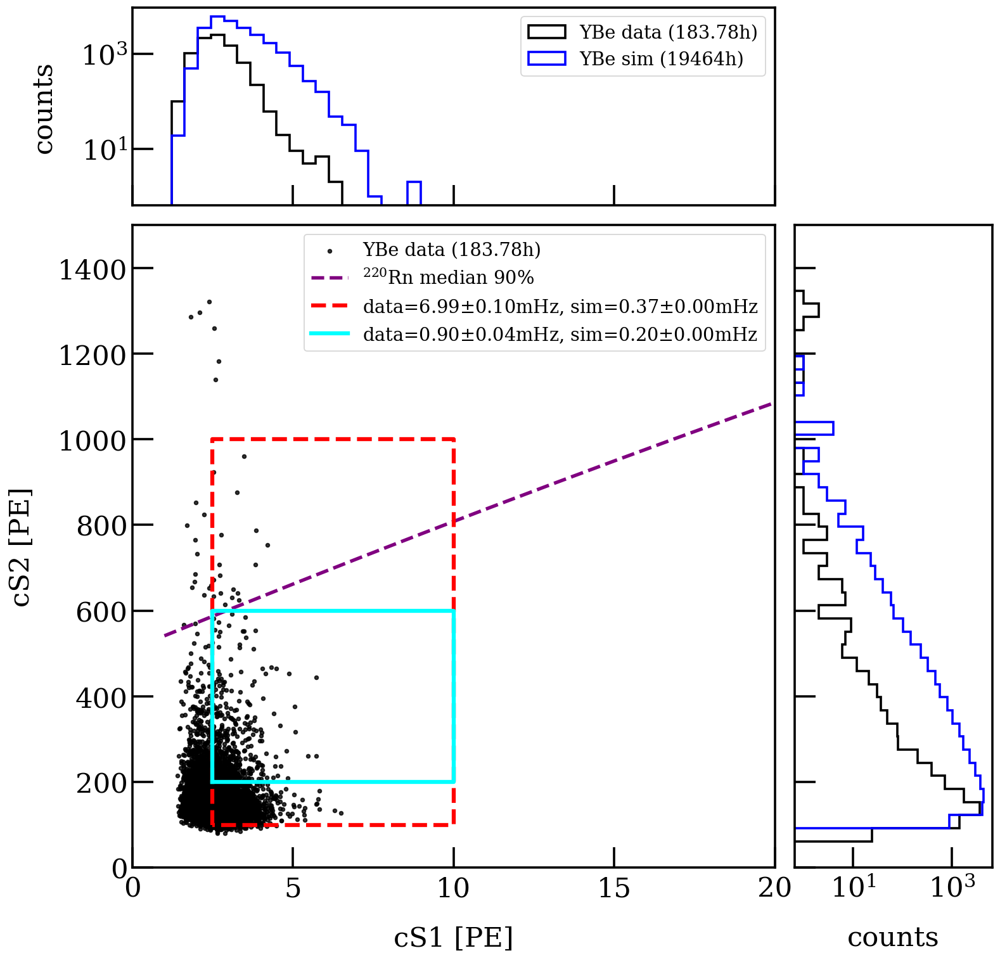

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [52]:

plot_cs1cs2(data_cuts_2only,df_sim=sim_2only,data_label=f'YBe data ({hour}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

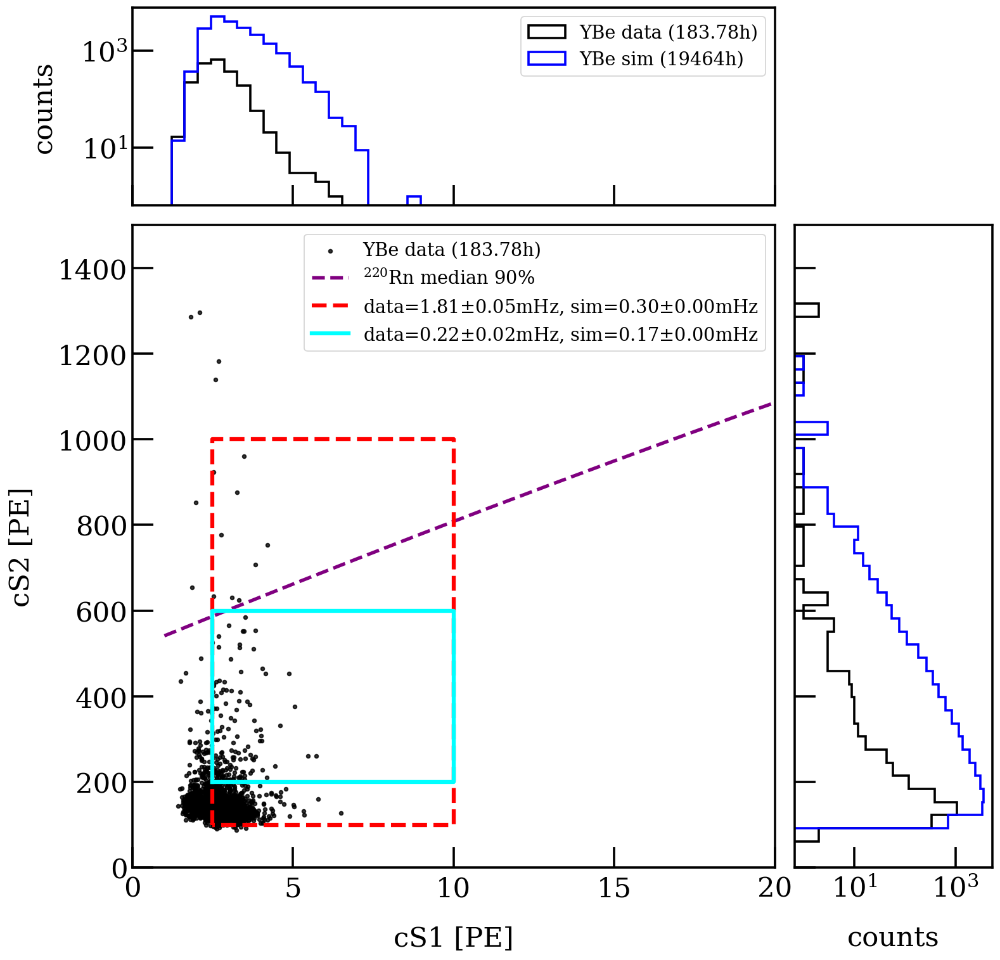

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [79]:

plot_cs1cs2(data_2f_clean,df_sim=sim_2f_clean,data_label=f'YBe data ({hour}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

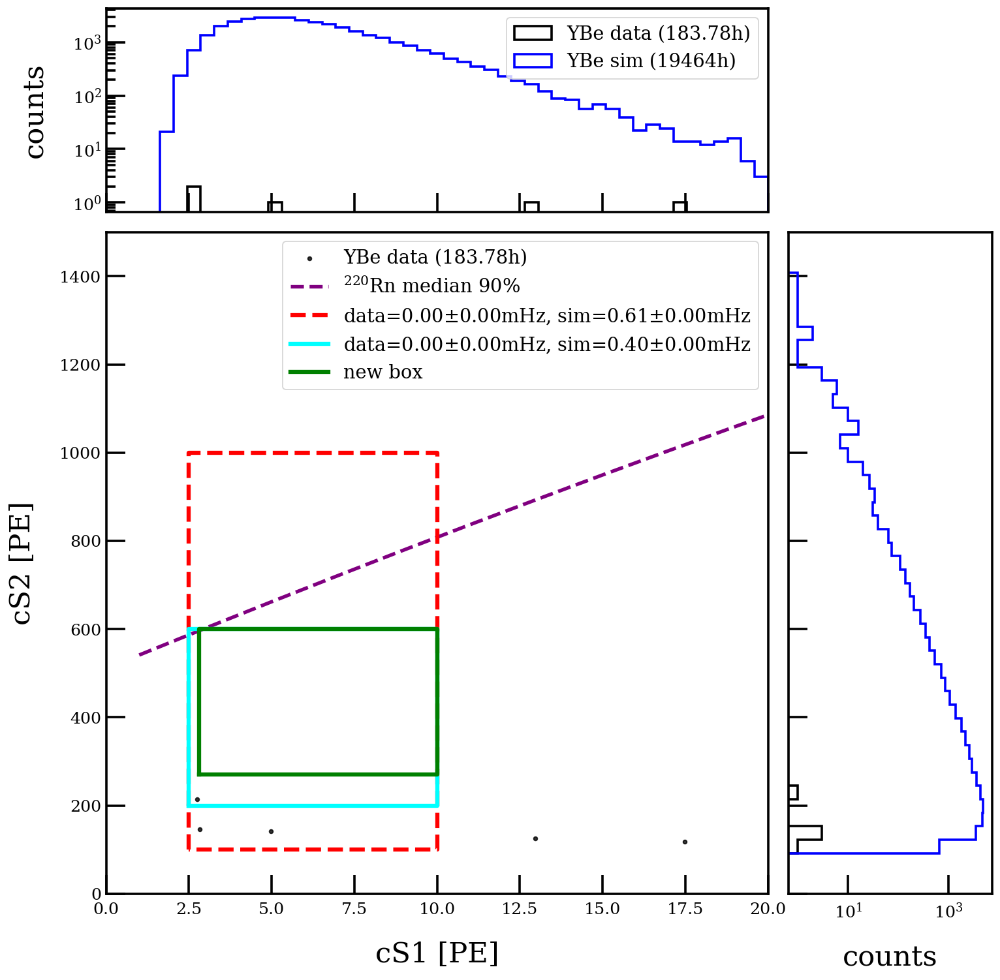

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [49]:

plot_cs1cs2(data_cuts[data_cuts['cut_time_shadow']==False],df_sim=sim,data_label=f'YBe data ({hour}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

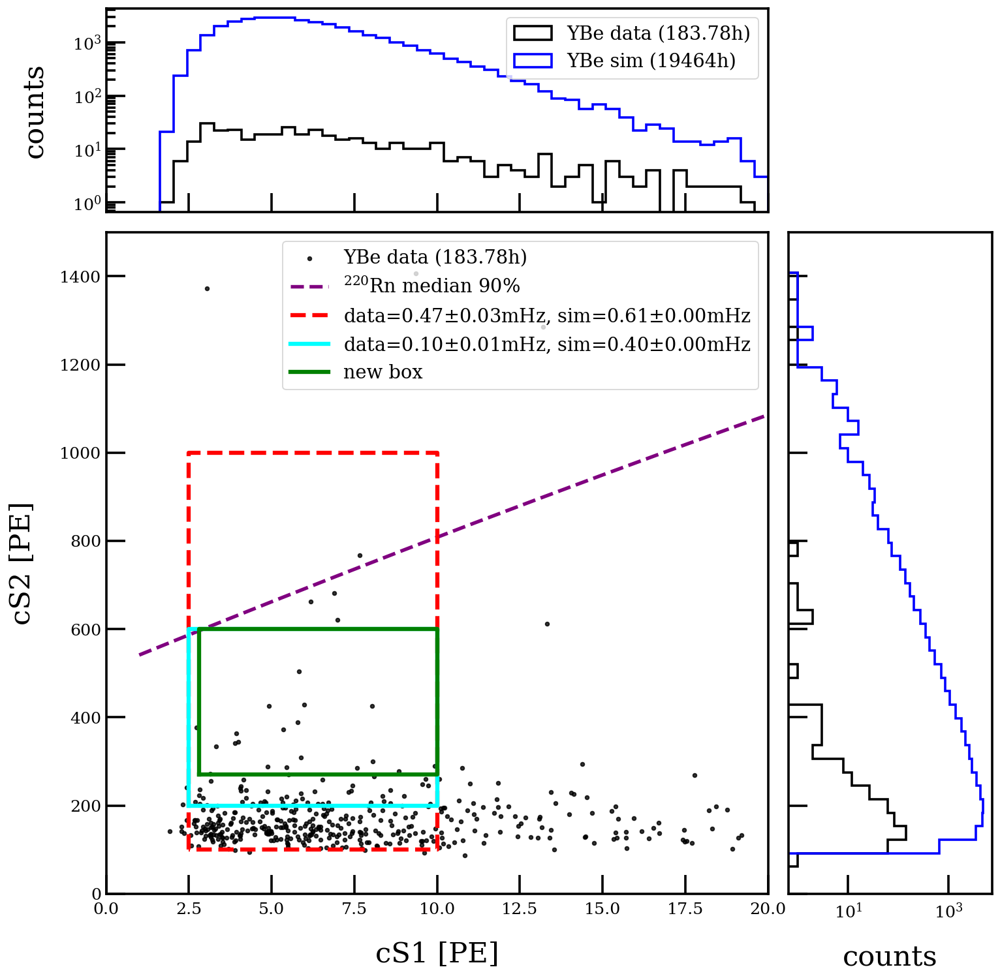

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [50]:
%matplotlib inline
plot_cs1cs2(data_cuts[data_cuts['cut_ambience']==False],df_sim=sim,data_label=f'YBe data ({hour}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

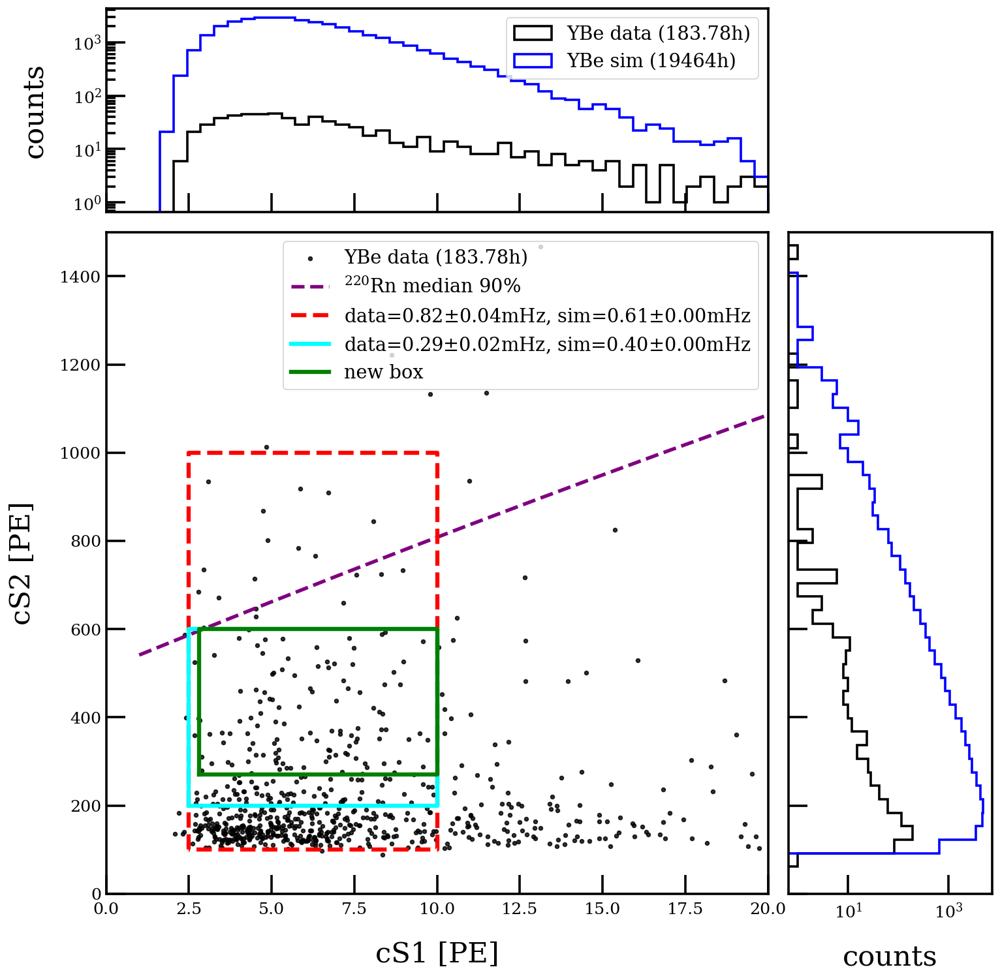

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [52]:
%matplotlib inline
plot_cs1cs2(data_cuts[data_cuts['cut_ambience']==True],df_sim=sim,data_label=f'YBe data ({hour}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

In [28]:
plot_cs1cs2(data_cuts,df_sim=sim,data_label=f'YBe data ({hour}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

NameError: name 'data_cuts' is not defined

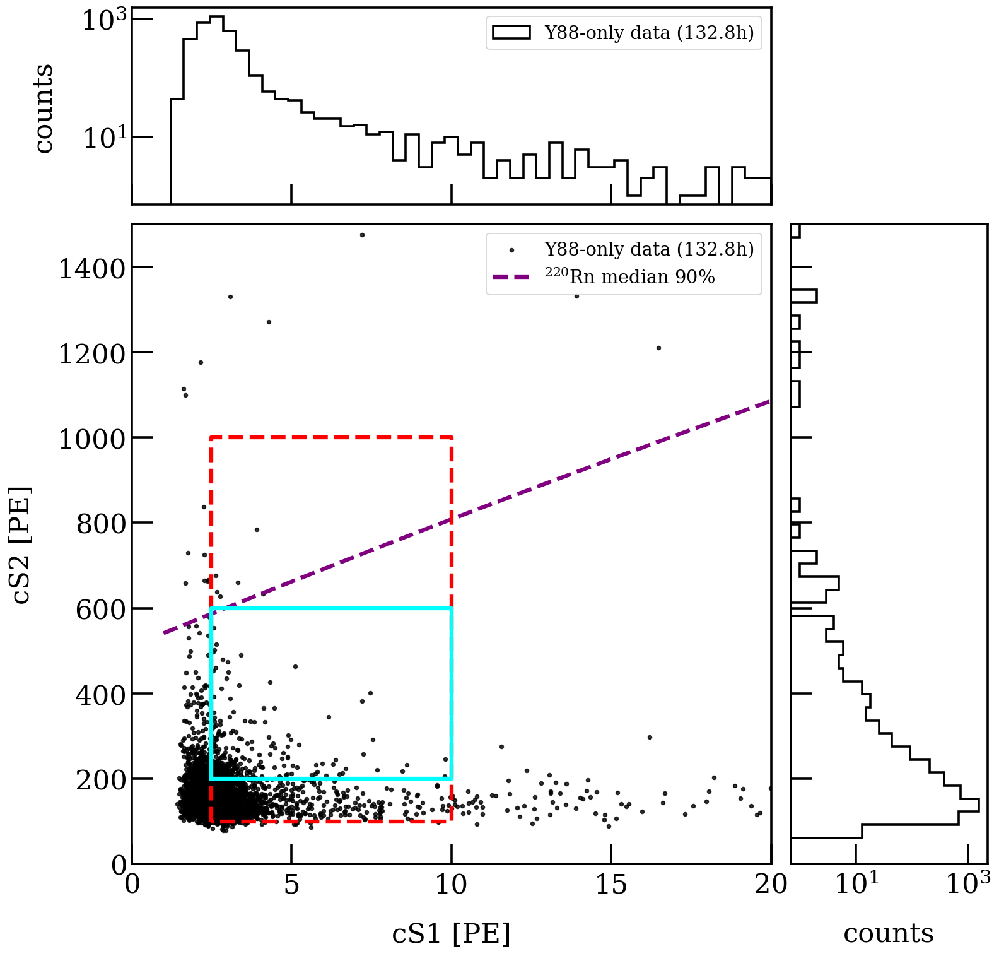

In [72]:
%matplotlib inline
plot_cs1cs2_simple(bkg_cuts,data_label=f'Y88-only data ({b_hour:.1f}h)',sim_label=f'YBe sim ({s_hour:.0f}h)')#,plot_sim='contour')

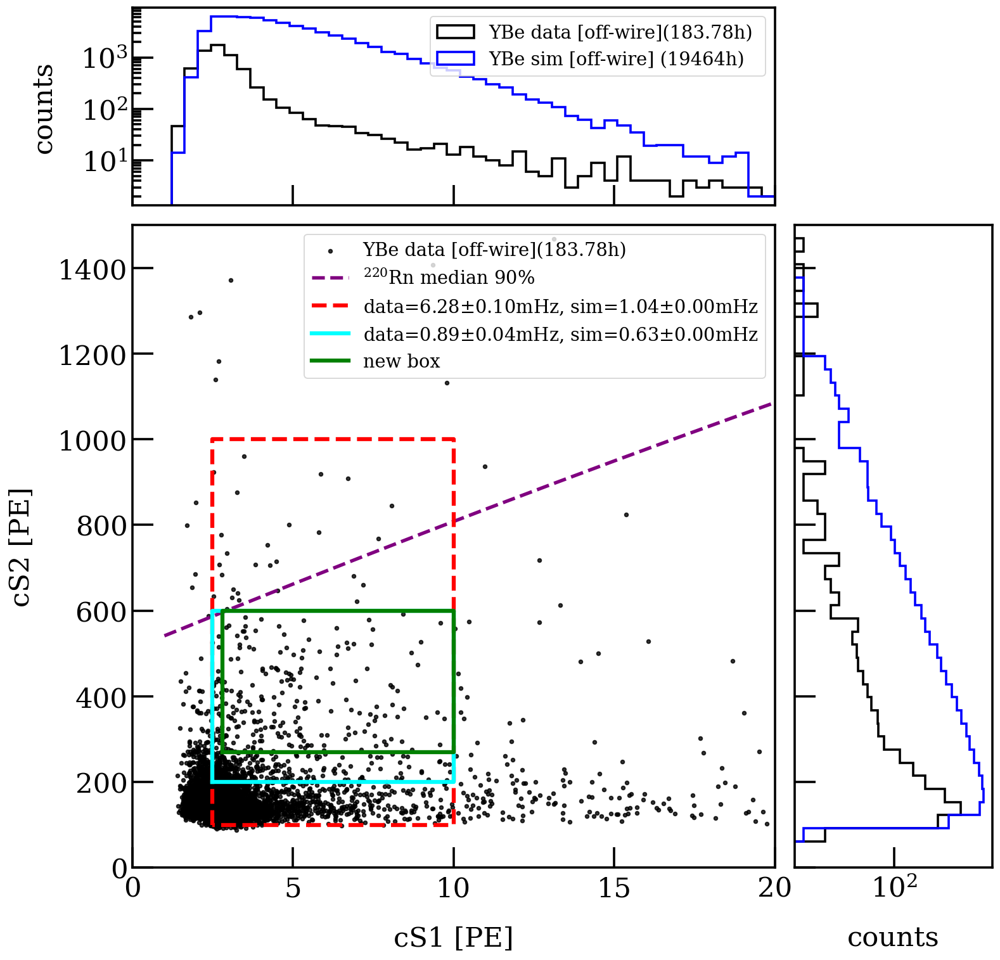

(<Axes:xlabel='cS1 [PE]', ylabel='cS2 [PE]'>,
 <Axes:ylabel='counts'>,
 <Axes:xlabel='counts'>)

In [111]:
%matplotlib inline
plot_cs1cs2(wire_cut(data_cuts),df_sim=wire_cut(sim),data_label=f'YBe data [off-wire]({hour}h) ',sim_label=f'YBe sim [off-wire] ({s_hour:.0f}h)')#,plot_sim='contour')

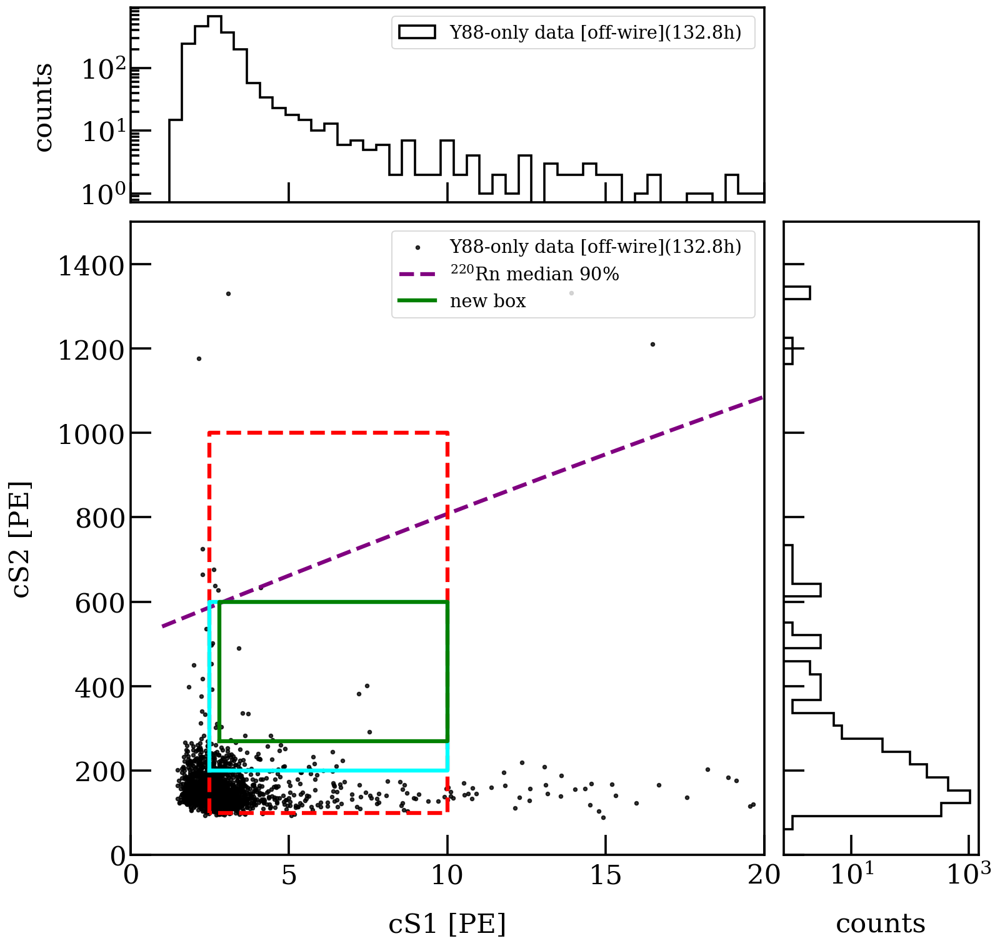

In [112]:
%matplotlib inline
axx,_,_=plot_cs1cs2_simple(wire_cut(bkg_cuts),df_sim=None,data_label=f'Y88-only data [off-wire]({b_hour:.1f}h) ',sim_label=f'YBe sim [off-wire] ({s_hour:.0f}h)')#,plot_sim='contour')


In [97]:
np.linspace(2.5,20.5,37)

array([ 2.5,  3. ,  3.5,  4. ,  4.5,  5. ,  5.5,  6. ,  6.5,  7. ,  7.5,
        8. ,  8.5,  9. ,  9.5, 10. , 10.5, 11. , 11.5, 12. , 12.5, 13. ,
       13.5, 14. , 14.5, 15. , 15.5, 16. , 16.5, 17. , 17.5, 18. , 18.5,
       19. , 19.5, 20. , 20.5])

In [133]:
bkg_sim_s

0.00018142359415638588

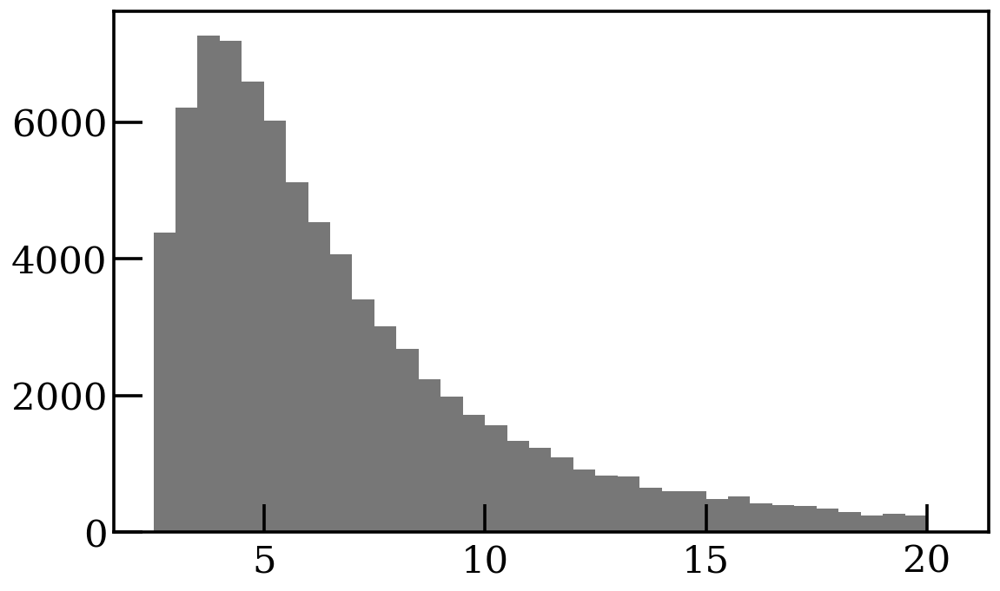

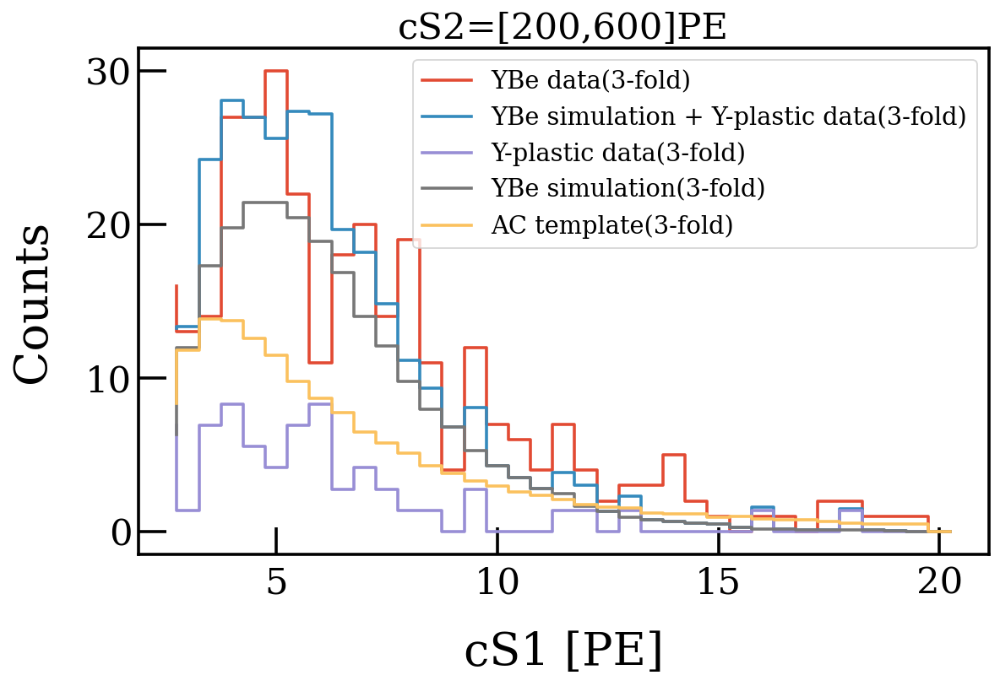

In [140]:
%matplotlib inline

bins=np.linspace(2.5,20.5,37)
bin_center=(bins[1:]+bins[:-1])/2
for cut in [200]: #np.arange(50,350,50):
    upper=600
    data_cut_s2=cut_cs1cs2(data_cuts,cs1=[1.5,20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(bkg_cuts,cs1=[1.5,20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(sim,cs1=[2.5,20],cs2=[cut,upper])
    ac_cut_s2=cut_cs1cs2(ac_sim_cuts,cs1=[2.5,20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    h_ac=plt.hist(ac_cut_s2.cs1,bins=bins)[0]
    # err=np.array(poi_err(h_data))

    
    plt.figure(figsize=(10,6))
    mode_name= '(3-fold)'
    plt.step(bin_center,h_data,label='YBe data'+mode_name)
    plt.step(bin_center,h_bkg*bkg_s+h_sim*sim_s,label='YBe simulation + Y-plastic data'+mode_name)
    plt.step(bin_center,h_bkg*bkg_s,label='Y-plastic data'+mode_name)
    plt.step(bin_center,h_sim*sim_s,label='YBe simulation'+mode_name)
    plt.step(bin_center,h_ac*bkg_sim_s,label='AC template'+mode_name)
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    
    # plt.yscale('log')
    plt.title(f'cS2=[{cut},{upper}]PE')
    plt.legend(loc='best',fontsize=16)


    plt.show()

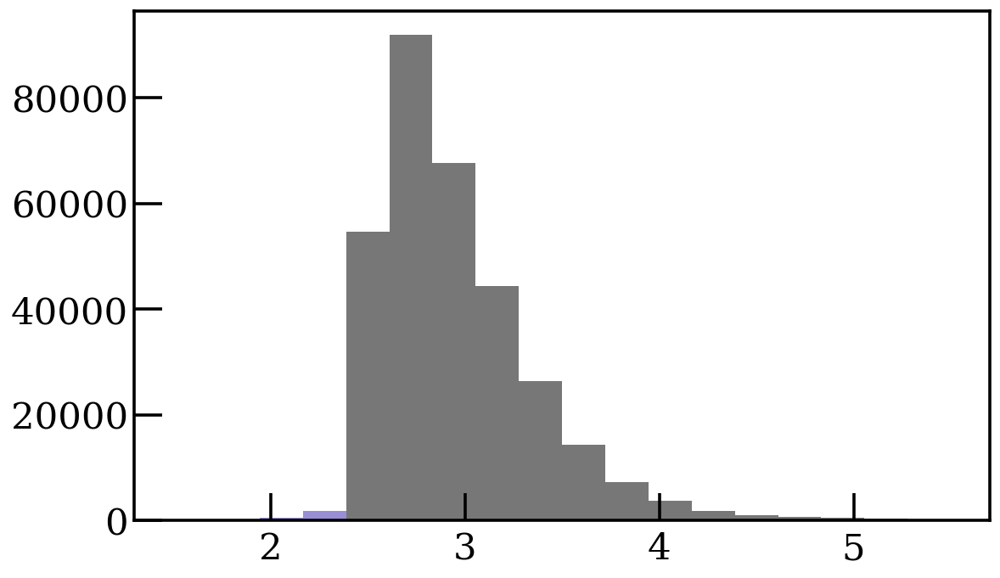

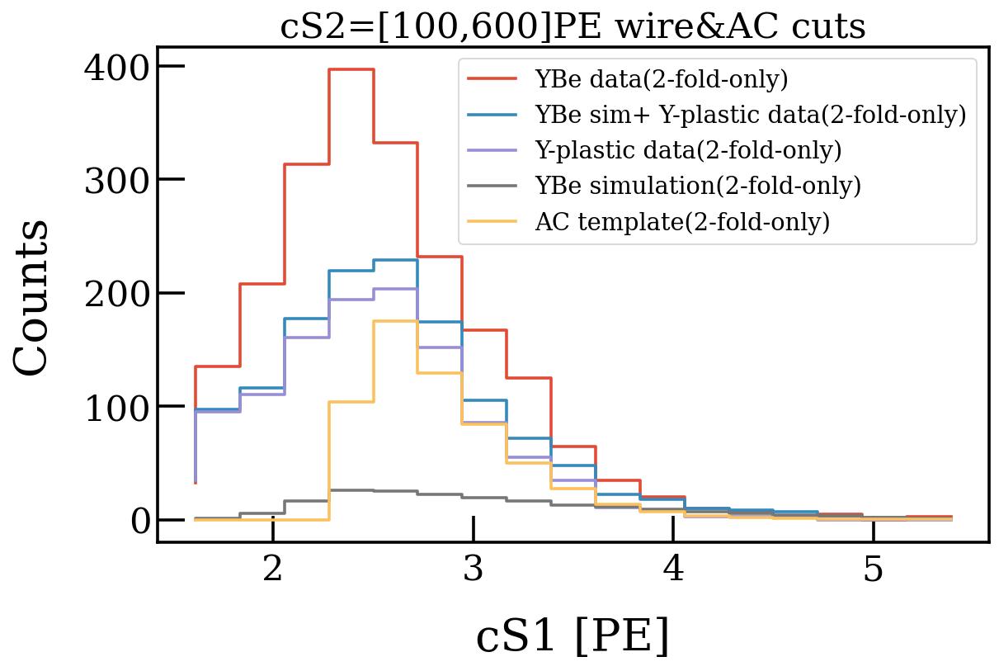

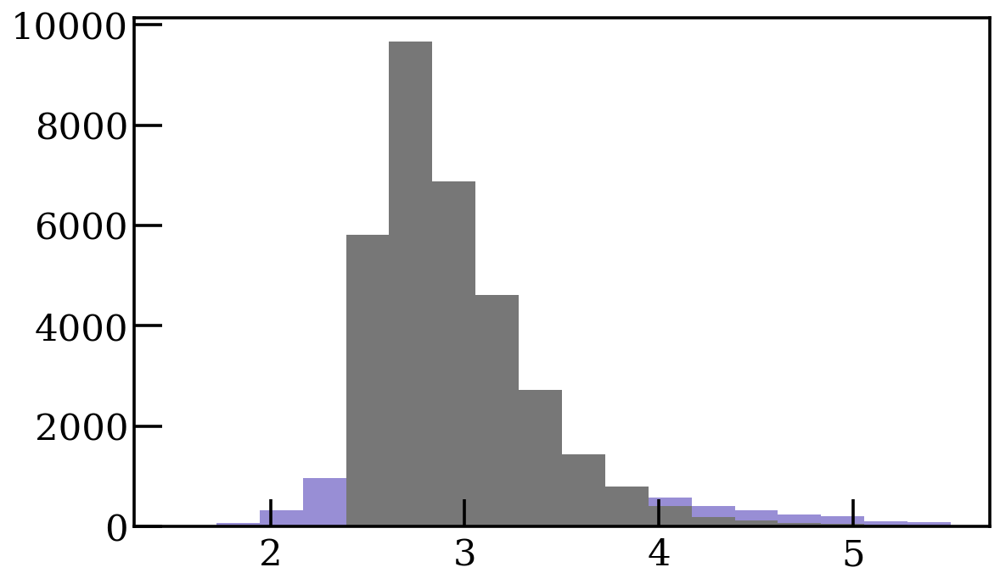

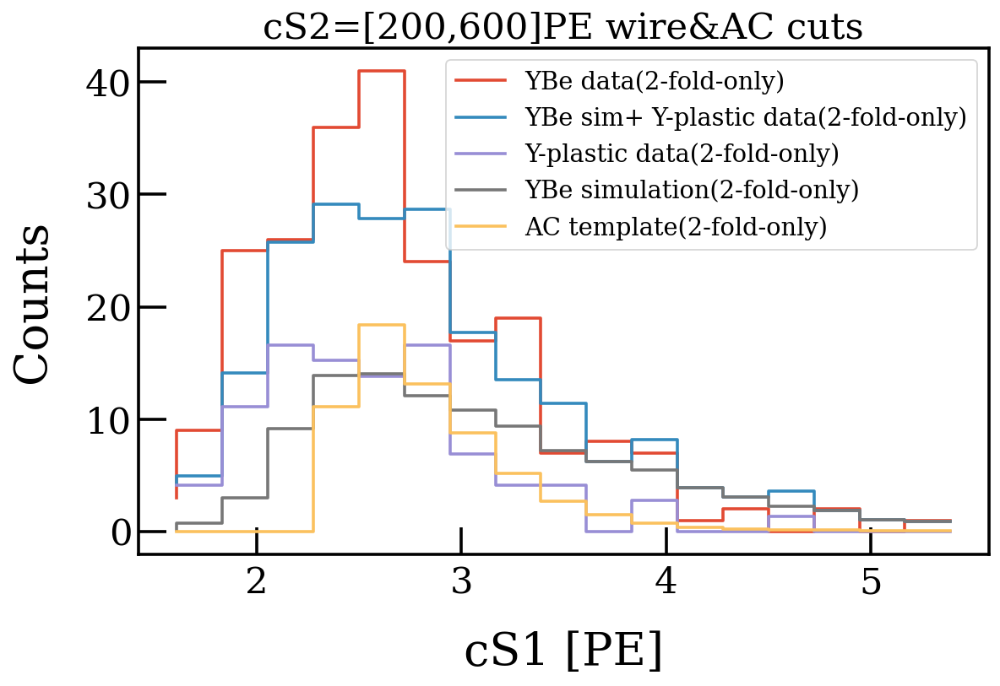

In [141]:
%matplotlib inline

bins=np.linspace(1.5,5.5,19)
bin_center=(bins[1:]+bins[:-1])/2
for cut in [100,200]: #np.arange(50,350,50):
    upper=600
    data_cut_s2=cut_cs1cs2(data_2f_clean,cs1=[1.5,20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(bkg_2f_clean,cs1=[1.5,20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(sim_2f_clean,cs1=[1.5,20],cs2=[cut,upper])
    ac_cut_s2=cut_cs1cs2(ac_sim_cuts_2only[ac_sim_cuts_2only.s1_n_hits==2],cs1=[2.5,20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    h_ac=plt.hist(ac_cut_s2.cs1,bins=bins)[0]
    # err=np.array(poi_err(h_data))

    
    plt.figure(figsize=(10,6))
    mode_name= '(2-fold-only)'
    plt.step(bin_center,h_data,label='YBe data'+mode_name)
    plt.step(bin_center,h_bkg*bkg_s+h_sim*sim_s,label='YBe sim+ Y-plastic data'+mode_name)
    plt.step(bin_center,h_bkg*bkg_s,label='Y-plastic data'+mode_name)
    plt.step(bin_center,h_sim*sim_s,label='YBe simulation'+mode_name)
    plt.step(bin_center,h_ac*bkg_sim_s,label='AC template'+mode_name)
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    
    # plt.yscale('log')
    plt.title(f'cS2=[{cut},{upper}]PE'+' wire&AC cuts')
    plt.legend(loc='best',fontsize=16)


    plt.show()

# position dependence

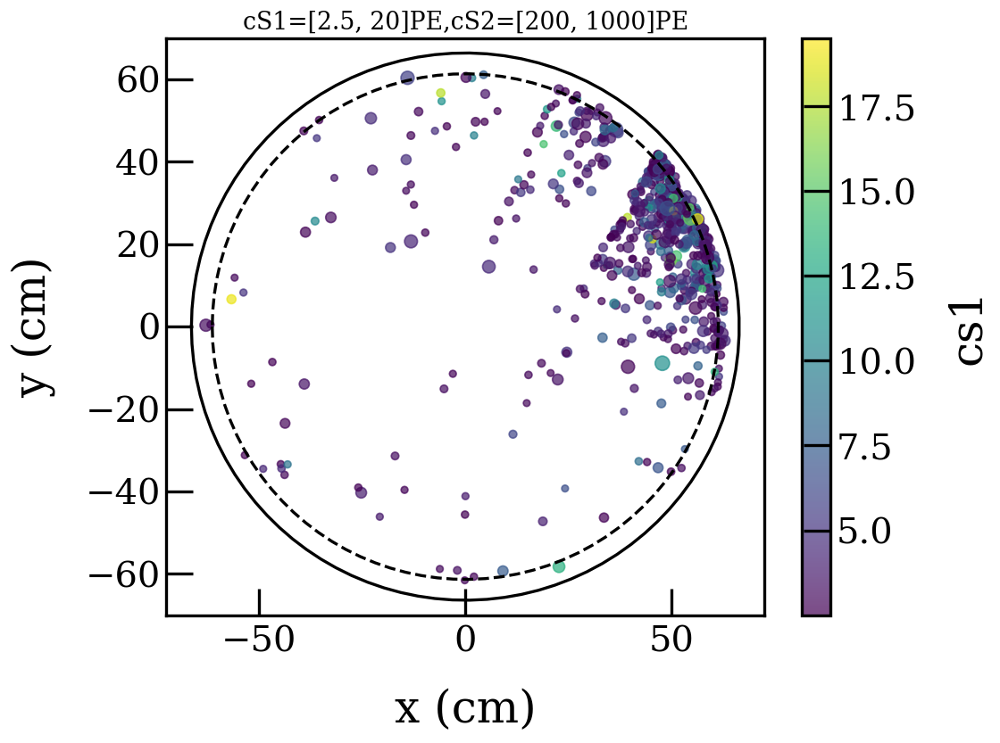

In [47]:
#with wire cut data
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_xy(cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

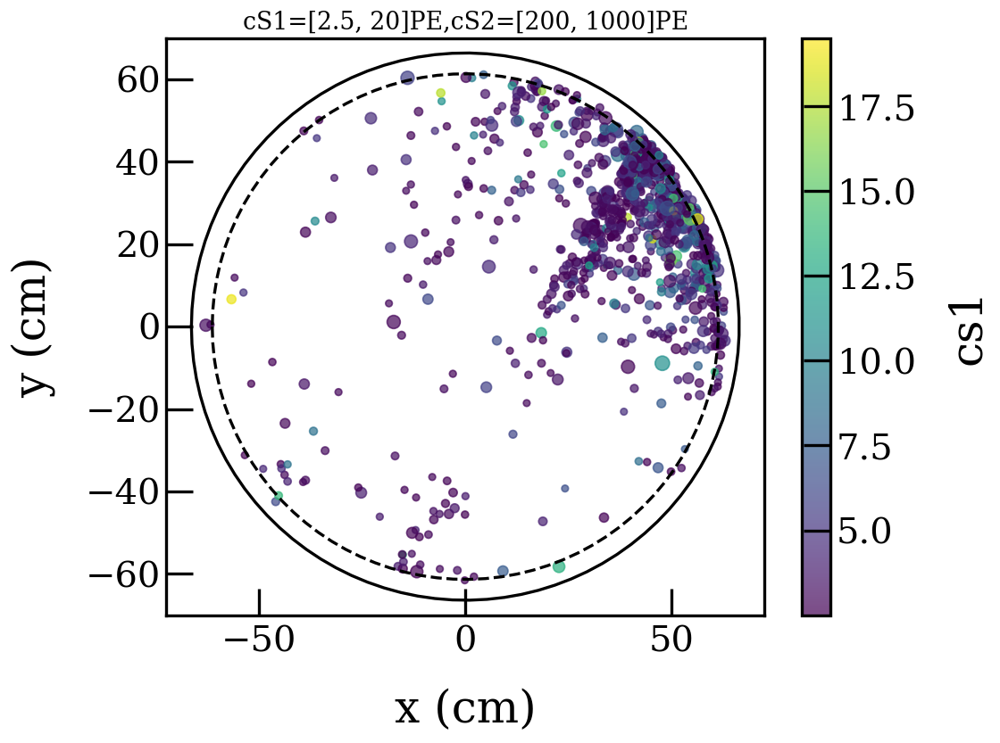

In [48]:
#without wire cut data
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_xy(cut_cs1cs2(data_cuts,cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

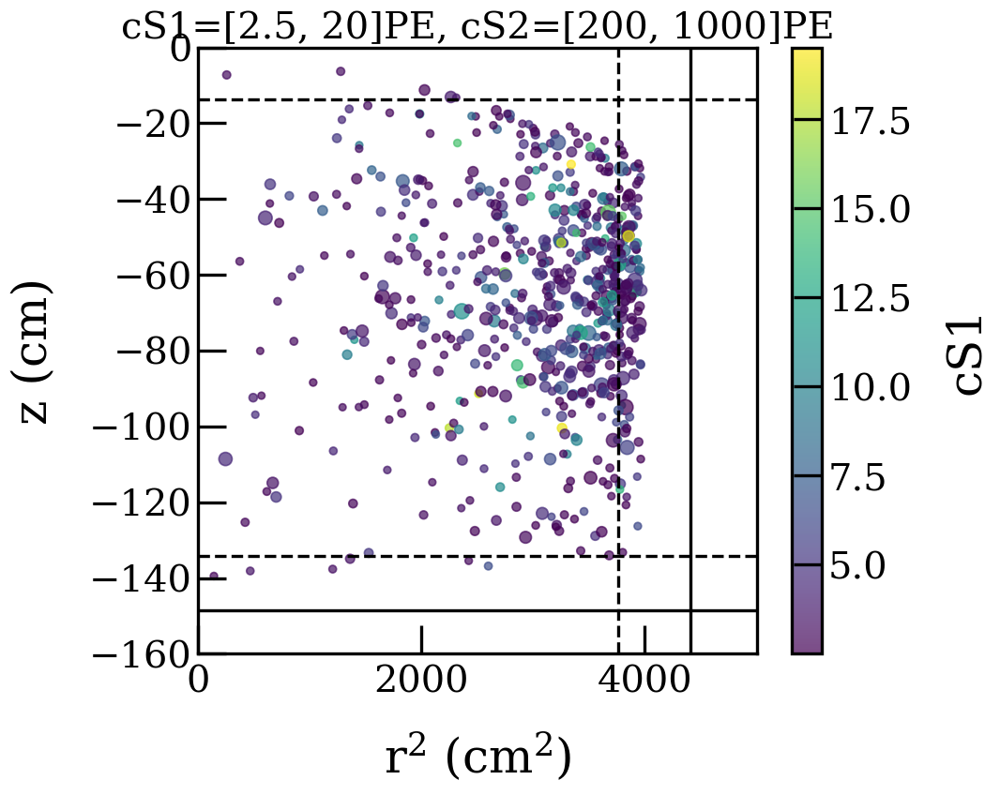

In [49]:
#with wire cut data
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_rz(cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

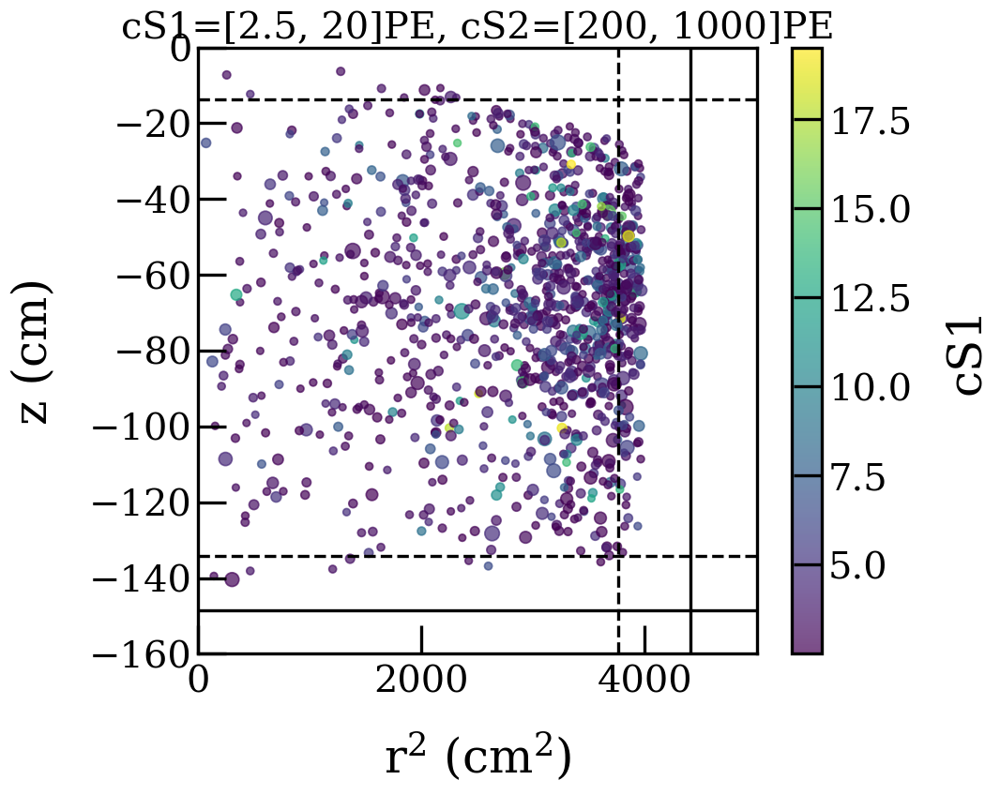

In [50]:
#without wire cut data
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_rz(cut_cs1cs2(data_cuts,cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

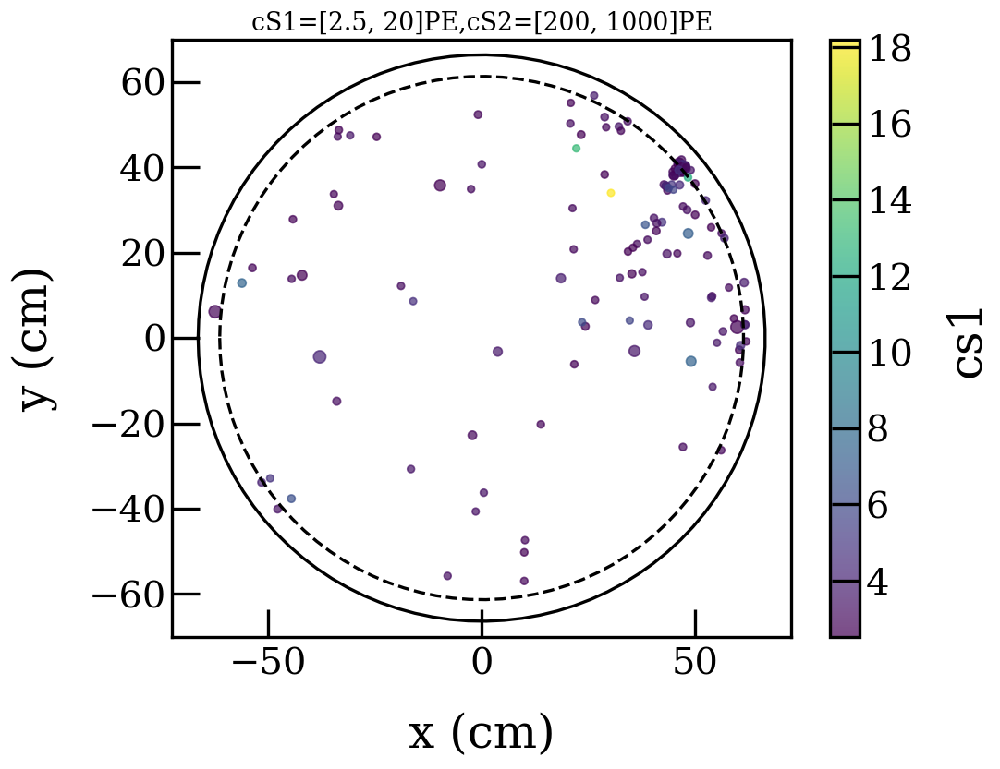

In [51]:
#with wire cut
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_xy(cut_cs1cs2(wire_cut(bkg_cuts),cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

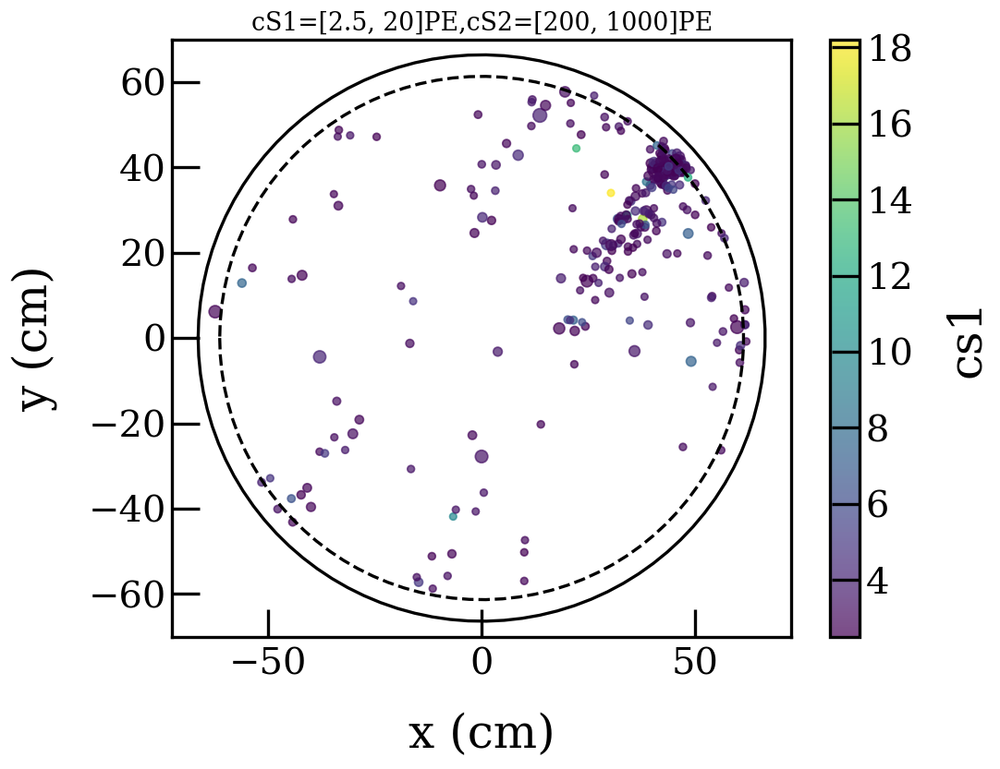

In [52]:
#without wire cut bkg
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_xy(cut_cs1cs2(bkg_cuts,cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

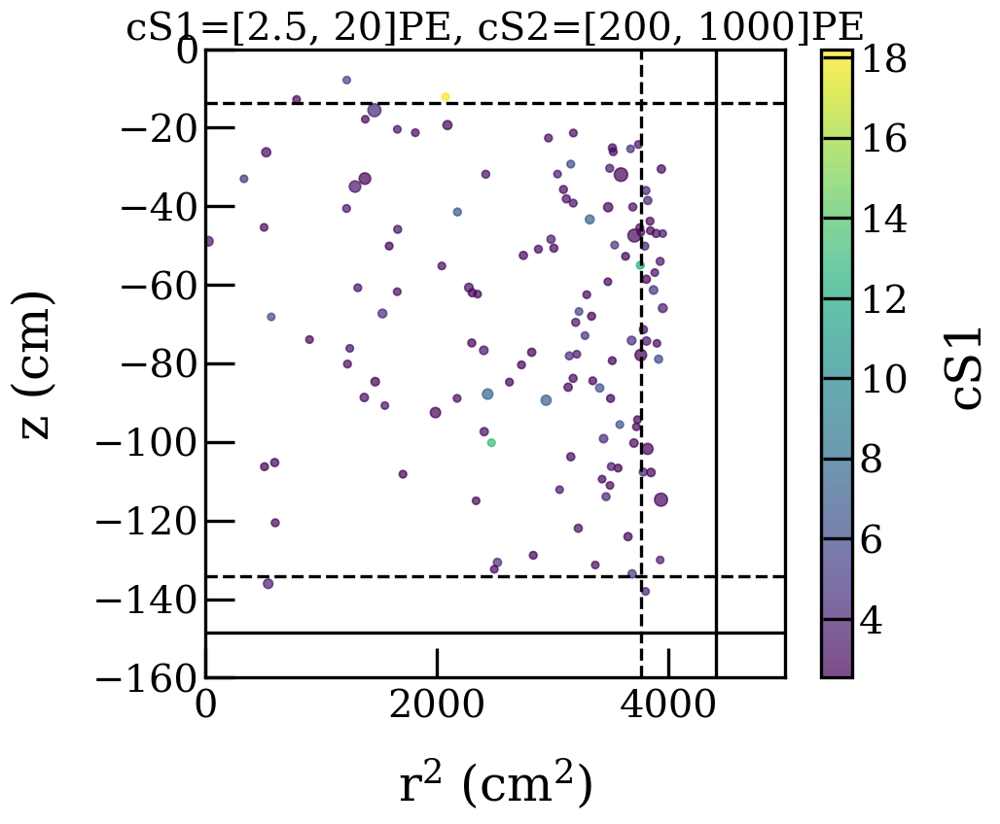

In [53]:
#with wire cut bkg
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_rz(cut_cs1cs2(wire_cut(bkg_cuts),cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

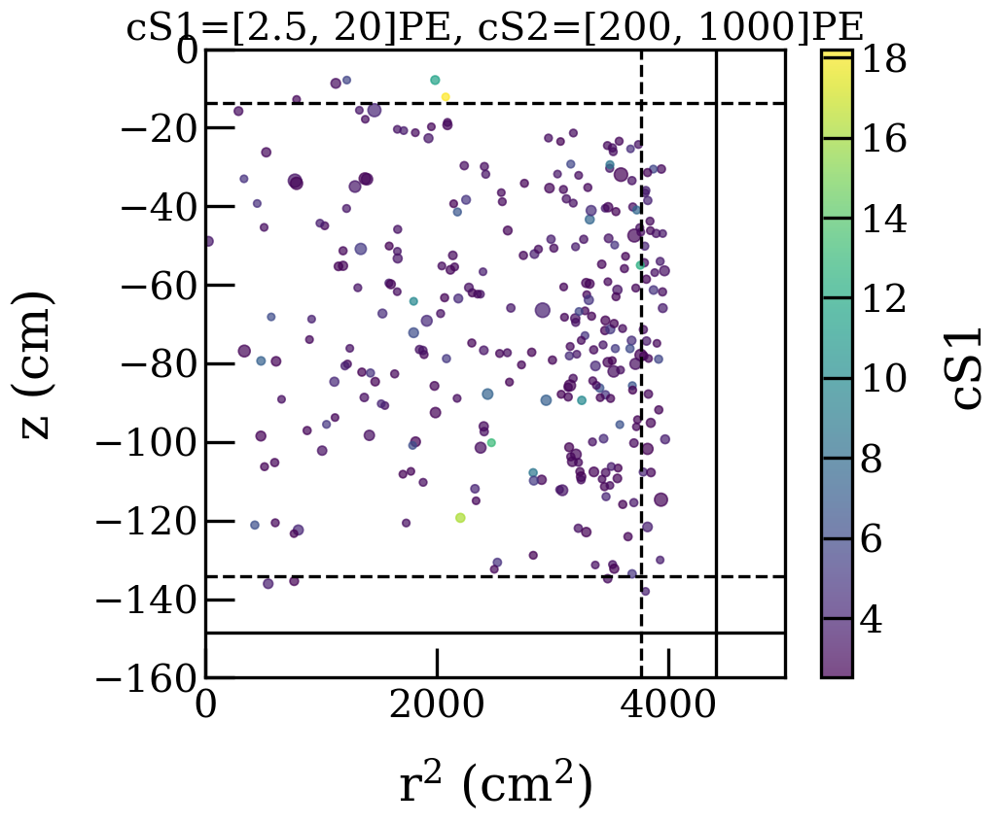

In [54]:
#without wire cut bkg
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_rz(cut_cs1cs2(bkg_cuts,cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

In [97]:
poi_err([0,28,32,100])

[[0, 4.80808080808081, 5.656854249492381, 10.0],
 [1.0101010101010102, 4.80808080808081, 5.656854249492381, 10.0]]

In [81]:

def poi_err(data):

    # lb=[x-cal_FC_signal_exp(0,x)[0] for x in data]
    # hb=[cal_FC_signal_exp(0,x)[1]-x for x in data]
    lb,hb=[],[]
    for x in data:
        if x<30:
            lb.append(x-cal_FC_signal_exp(0,x)[0])
            hb.append(cal_FC_signal_exp(0,x)[1]-x)
        else:
            lb.append(np.sqrt(x))
            hb.append(np.sqrt(x))
    return [lb,hb]

In [82]:

def cal_FC_signal_exp(background_exp , observed_count, alpha=0.64):
    x_bins = np.arange(0, 1000) 
    mu_bins = np.linspace(0, max(20,observed_count*2), 100, endpoint=True)
    matrix = [stats.poisson(mu + background_exp).pmf(x_bins) for mu in mu_bins]
    acceptance_intervals = fc.fc_construct_acceptance_intervals_pdfs(matrix, alpha)
    LowerLimitNum, UpperLimitNum, _ = fc.fc_get_limits(mu_bins, x_bins, acceptance_intervals)
    upper = fc.fc_find_limit(observed_count, UpperLimitNum, mu_bins)
    lower = fc.fc_find_limit(observed_count, LowerLimitNum, mu_bins)
    if lower==None:
        lower=0
    return lower, upper

In [116]:
# %matplotlib inline
# # bkg_s=hour/b_hour
# # sim_s=hour/s_hour
# bins=np.linspace(2.5,20,20)
# bin_center=(bins[1:]+bins[:-1])/2
# for cut in [50,200]:#np.arange(50,300,50):
#     data_cut_s2=cut_cs1cs2(data_cuts,cs1=[2.5,20],cs2=[cut,1500])
#     bkg_cut_s2=cut_cs1cs2(bkg_cuts,cs1=[2.5,20],cs2=[cut,1500])
#     sim_cut_s2=cut_cs1cs2(sim,cs1=[2.5,20],cs2=[cut,1500])
#     h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
#     h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
#     h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    
    
#     plt.figure(figsize=(10,6))
#     plt.errorbar(bin_center,h_data,yerr=poi_err(h_data),label=f'YBe ({hour}h)',fmt='^')
#     h_sum=h_bkg*bkg_s+h_sim*sim_s
#     err_sum=np.array(poi_err(h_bkg))*bkg_s+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*sim_s
#     plt.errorbar(bin_center,h_sum,yerr=err_sum,label='$^{88}$Y+sim',fmt='.')
#     plt.xlabel('cS1 [PE]')
#     plt.ylabel('Counts')
    
#     # plt.yscale('log')
#     plt.title(f'1500PE>cS2>{cut}PE')
#     plt.legend(loc='lower left',fontsize=18)
#     plt.savefig(f"plots/cs1_cs2>{cut}_err.png")
    
#     plt.figure(figsize=(10,6))
#     plt.step(bin_center,h_data,label='YBe')
#     plt.step(bin_center,h_bkg*bkg_s+h_sim*sim_s,label='$^{88}$Y+sim')
#     plt.step(bin_center,h_bkg*bkg_s,label='$^{88}$Y')
#     plt.step(bin_center,h_sim*sim_s,label='sim')
#     plt.xlabel('cS1 [PE]')
#     plt.ylabel('Counts')
    
#     plt.yscale('log')
#     plt.title(f'1500PE>cS2>{cut}PE')
#     plt.legend(loc='lower left',fontsize=18)
#     plt.savefig(f"plots/cs1_cs2>{cut}.png")

#     plt.show()

In [83]:
def calculate_gof(par, binned_data, bkg, sim):
    """Get binned poisson chi2 GoF from binned data & reference
    """
    binned_reference = par[0]*bkg+par[1]*sim
    ret = sps.poisson(binned_data).logpmf(binned_data)
    ret -= sps.poisson(binned_reference).logpmf(binned_data)
    return 2 * np.sum(ret)

In [84]:
def chi2(par,data,bkg,sim, err):
    err_sim=0.3
    err_bkg=0.5
    est = par[0]*bkg+par[1]*sim
    chi2=np.sum((data-est)**2/err[1]**2)
    chi2+=par[0]**2/(err_bkg*bkg_s)**2
    chi2+=par[1]**2/(err_sim*sim_s)**2
    return chi2

self-note: the plot I showed in : https://xenonnt.slack.com/archives/C040ZRQ3P8V/p1668018174697439
has applied bdt_ac_cut, which is not tuned, and not included in the AC template. 

/tmp/jobs/23632566/ipykernel_205/2438747360.py:18: OptimizeWarning: Unknown solver options: xtol
  res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23632566/ipykernel_205/2438747360.py:27: OptimizeWarning: Unknown solver options: xtol
  res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23632566/ipykernel_205/2438747360.py:32: RuntimeWarning: invalid value encountered in sqrt
  print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')


a,b [1.38428616 0.0573015 ]
chi2/ndf=426.15/17=25.067509895894247
signal significance=nan sigma


/tmp/jobs/23632566/ipykernel_205/2438747360.py:47: RuntimeWarning: invalid value encountered in sqrt
  plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-1)}={res.fun/(len(h_data)-1):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \


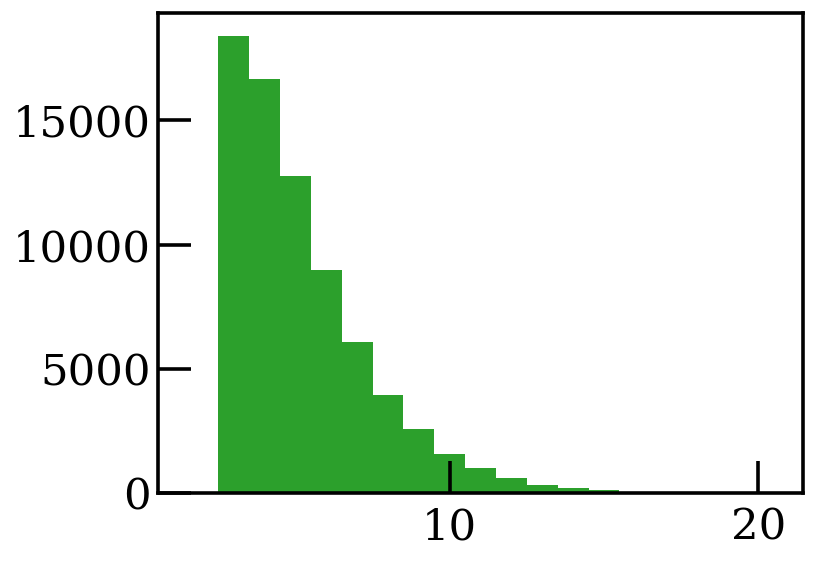

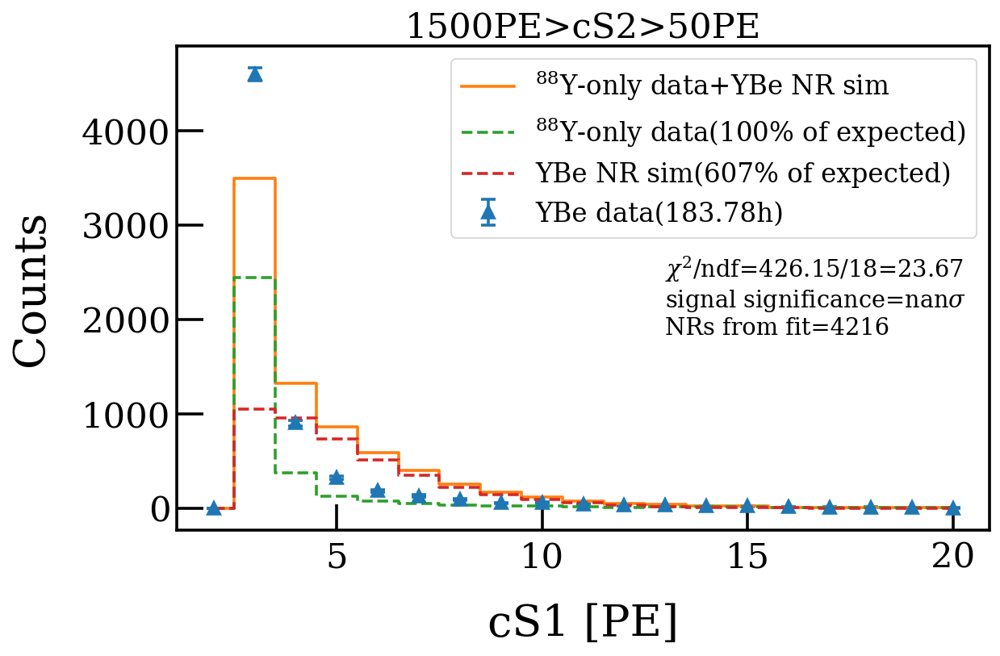

a,b [1.38428616 0.01619903]
chi2/ndf=46.67/17=2.7452863601355233
signal significance=nan sigma


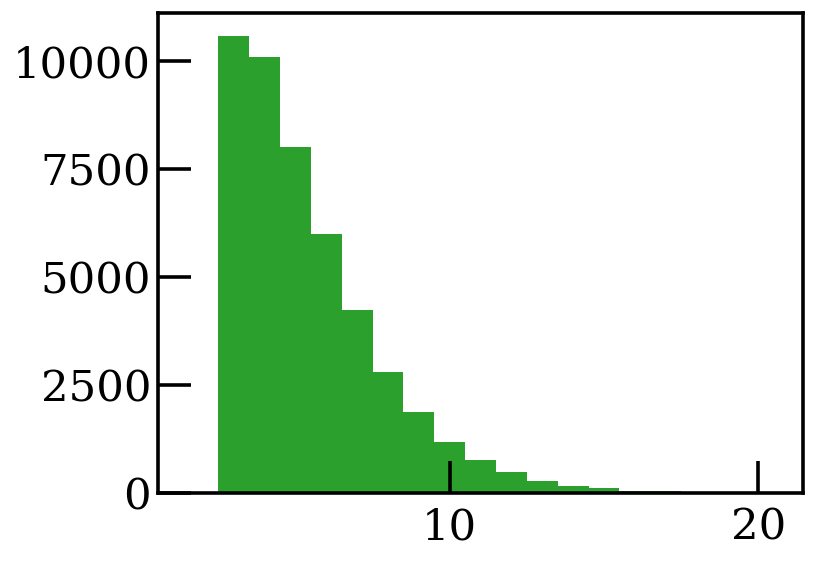

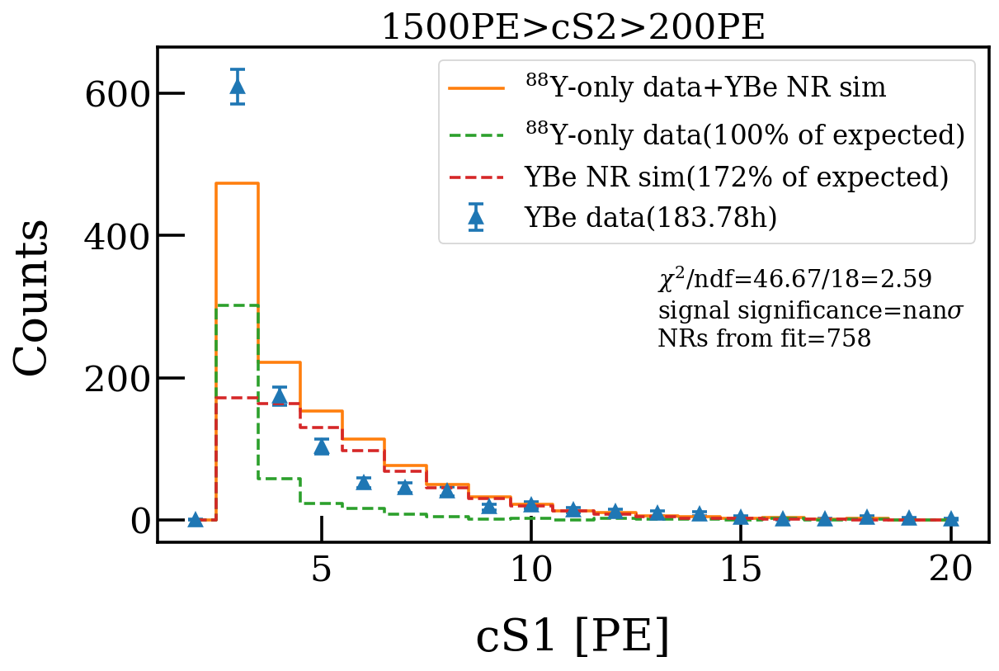

In [56]:
%matplotlib inline

bins=s1_bins
bin_center=(bins[1:]+bins[:-1])/2
for cut in [50,200]: #np.arange(50,350,50):
    upper=1500
    data_cut_s2=cut_cs1cs2(data_cuts,cs1=[2.5,20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(bkg_cuts,cs1=[2.5,20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(sim,cs1=[2.5,20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    # bnds = [(0,100),(0,100)]
    bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # plt.errorbar(bin_center,h_sum,yerr=err_sum,label='$^{88}$Y'+f'*{res.x[0]/bkg_s:.2g}+sim*{res.x[1]/sim_s:.2g}',fmt='.')
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    # plt.step(bins[:-1],h_bkg*res0.x[0],label='bkg-only',linestyle='--')
    # plt.step(bins[:-1],h_bkg*res0.x[0],linestyle='--')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-1)}={res.fun/(len(h_data)-1):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    
    # plt.yscale('log')
    plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.legend(loc='upper right',fontsize=18)
    plt.savefig(f"plots/fit_cs1_cs2>{cut}_fix_bkg.png")
    
#     plt.figure(figsize=(10,6))
#     plt.step(bin_center,h_data,label='YBe')
#     plt.step(bin_center,h_bkg*bkg_s+h_sim*sim_s,label='$^{88}$Y+sim')
#     plt.step(bin_center,h_bkg*bkg_s,label='$^{88}$Y')
#     plt.step(bin_center,h_sim*sim_s,label='sim')
#     plt.xlabel('cS1 [PE]')
#     plt.ylabel('Counts')
    
#     plt.yscale('log')
#     plt.title(f'1500PE>cS2>{cut}PE')
#     plt.legend(loc='lower left',fontsize=18)
#     plt.savefig(f"plots/fit_cs1_cs2>{cut}.png")

    plt.show()

array([ 2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14.,
       15., 16., 17., 18., 19., 20.])

/tmp/jobs/23632566/ipykernel_205/738049551.py:18: OptimizeWarning: Unknown solver options: xtol
  res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23632566/ipykernel_205/738049551.py:27: OptimizeWarning: Unknown solver options: xtol
  res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23632566/ipykernel_205/738049551.py:32: RuntimeWarning: invalid value encountered in sqrt
  print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')


a,b [1.38428616 0.05027897]
chi2/ndf=320.12/17=18.830462750530668
signal significance=nan sigma


/tmp/jobs/23632566/ipykernel_205/738049551.py:47: RuntimeWarning: invalid value encountered in sqrt
  plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-1)}={res.fun/(len(h_data)-1):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \


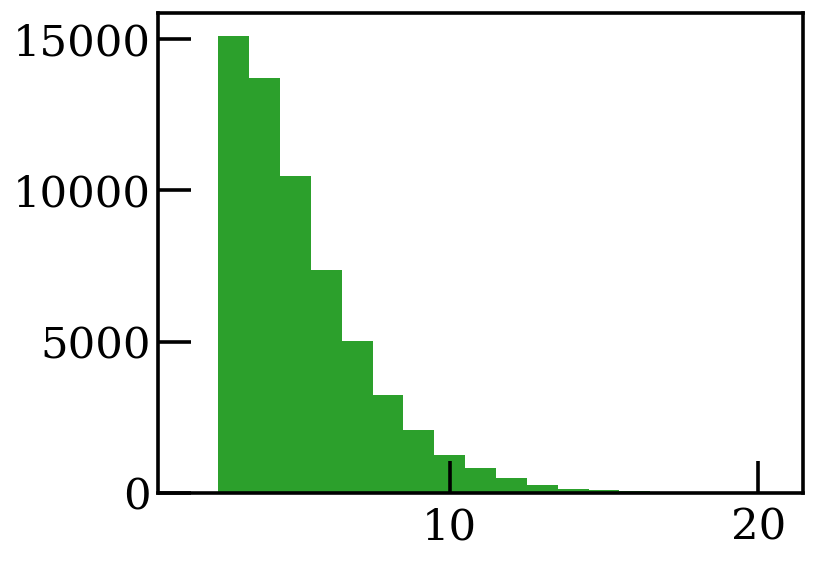

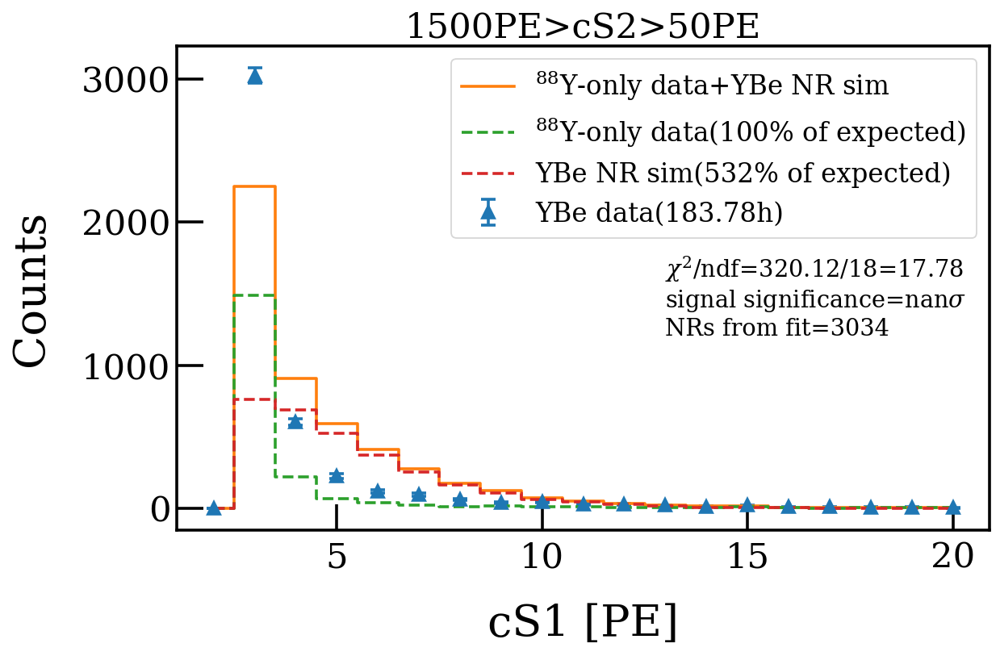

a,b [1.38428616 0.0133074 ]
chi2/ndf=28.95/17=1.703051465882687
signal significance=nan sigma


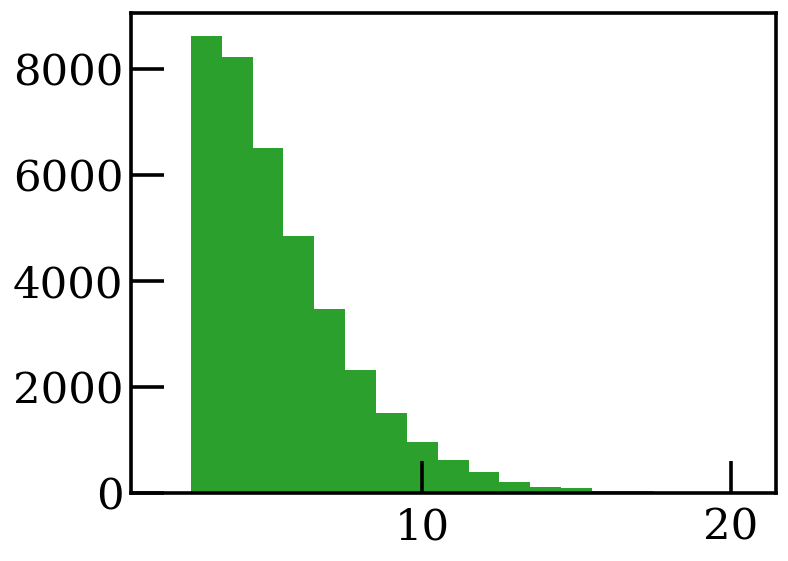

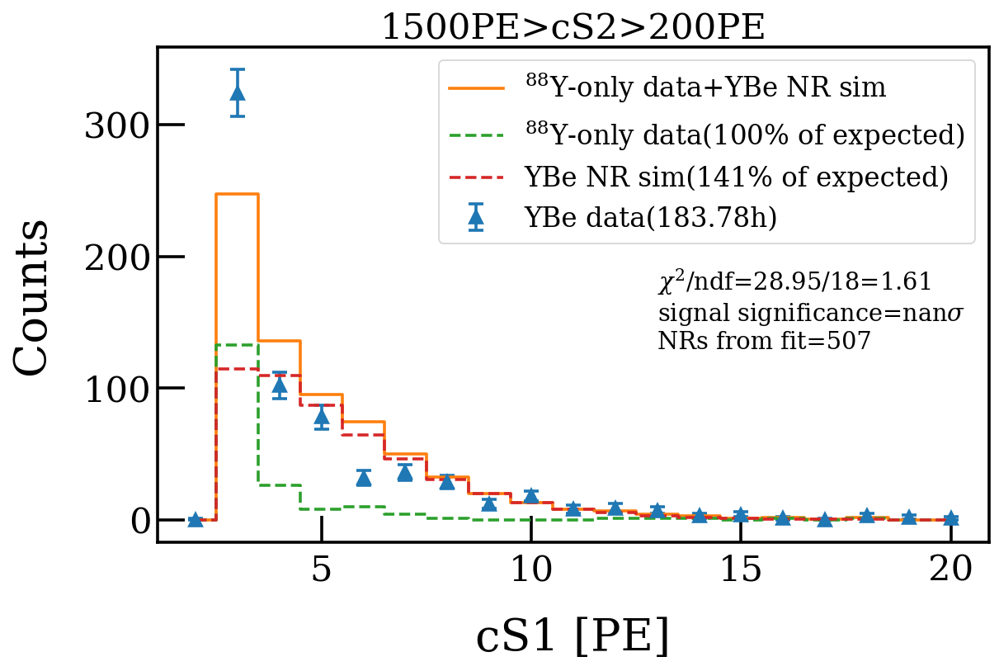

In [57]:
%matplotlib inline

bins=s1_bins
bin_center=(bins[1:]+bins[:-1])/2
for cut in [50,200]: #np.arange(50,350,50):
    upper=1500
    data_cut_s2=cut_cs1cs2(wire_cut(data_cuts),cs1=[2.5,20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(wire_cut(bkg_cuts),cs1=[2.5,20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(wire_cut(sim),cs1=[2.5,20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    # bnds = [(0,100),(0,100)]
    bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # plt.errorbar(bin_center,h_sum,yerr=err_sum,label='$^{88}$Y'+f'*{res.x[0]/bkg_s:.2g}+sim*{res.x[1]/sim_s:.2g}',fmt='.')
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    # plt.step(bins[:-1],h_bkg*res0.x[0],label='bkg-only',linestyle='--')
    # plt.step(bins[:-1],h_bkg*res0.x[0],linestyle='--')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-1)}={res.fun/(len(h_data)-1):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    
    # plt.yscale('log')
    plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.legend(loc='upper right',fontsize=18)
    plt.savefig(f"plots/fit_cs1_cs2>{cut}_fix_bkg_wire.png")
    
#     plt.figure(figsize=(10,6))
#     plt.step(bin_center,h_data,label='YBe')
#     plt.step(bin_center,h_bkg*bkg_s+h_sim*sim_s,label='$^{88}$Y+sim')
#     plt.step(bin_center,h_bkg*bkg_s,label='$^{88}$Y')
#     plt.step(bin_center,h_sim*sim_s,label='sim')
#     plt.xlabel('cS1 [PE]')
#     plt.ylabel('Counts')
    
#     plt.yscale('log')
#     plt.title(f'1500PE>cS2>{cut}PE')
#     plt.legend(loc='lower left',fontsize=18)
#     plt.savefig(f"plots/fit_cs1_cs2>{cut}.png")

    plt.show()

array([0.        , 0.00835695])

## Floating background

/tmp/jobs/23609521/ipykernel_123/2418986583.py:18: OptimizeWarning: Unknown solver options: xtol
  res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23609521/ipykernel_123/2418986583.py:27: OptimizeWarning: Unknown solver options: xtol
  res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),


a,b [1.79728176 0.0080824 ]
chi2/ndf=33.50/16=2.0940026394826114
signal significance=4.72 sigma


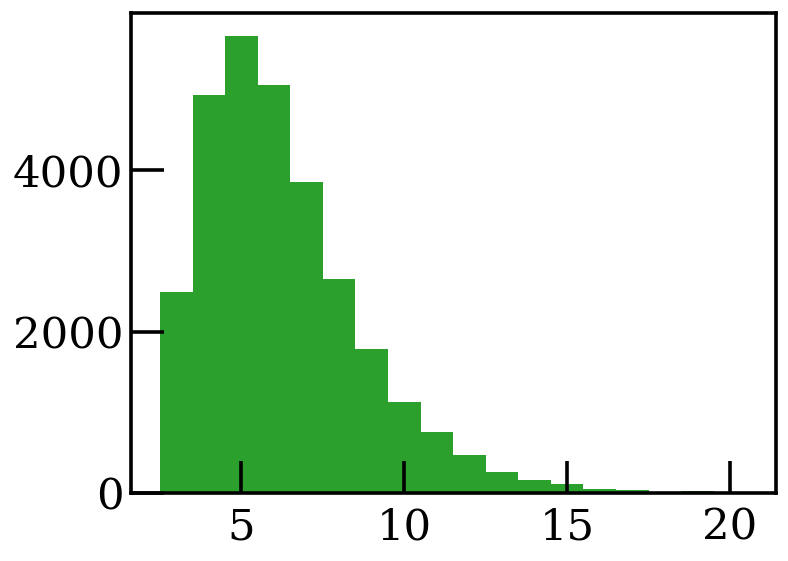

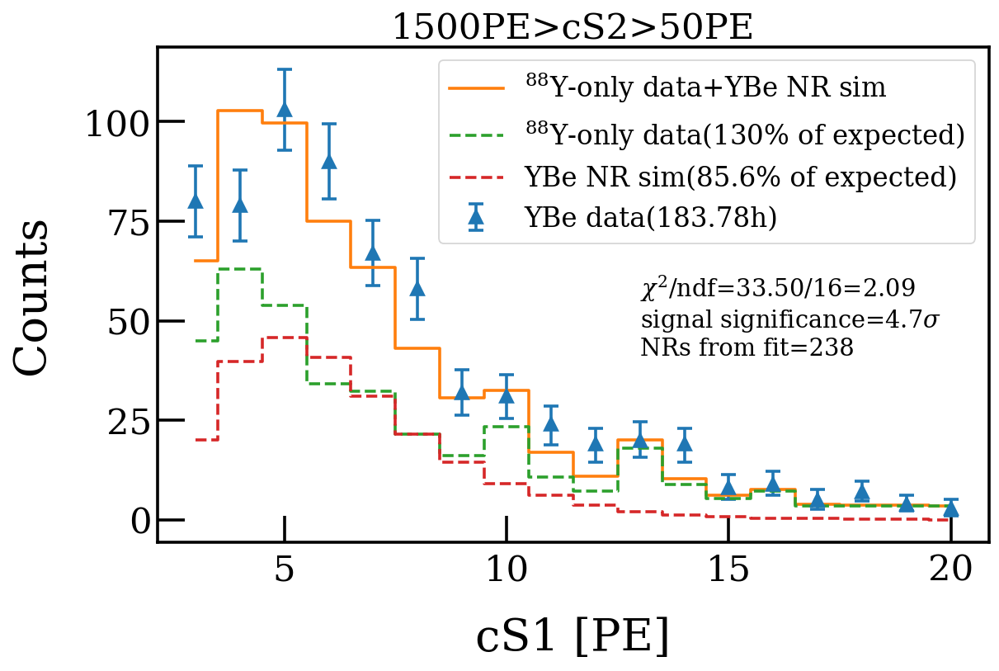

a,b [0.56745005 0.00929517]
chi2/ndf=28.30/16=1.7684601225958356
signal significance=8.58 sigma


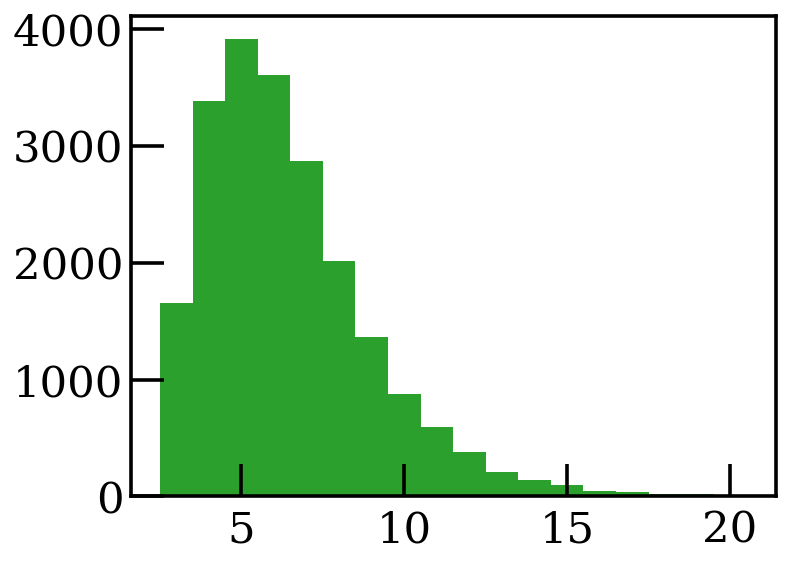

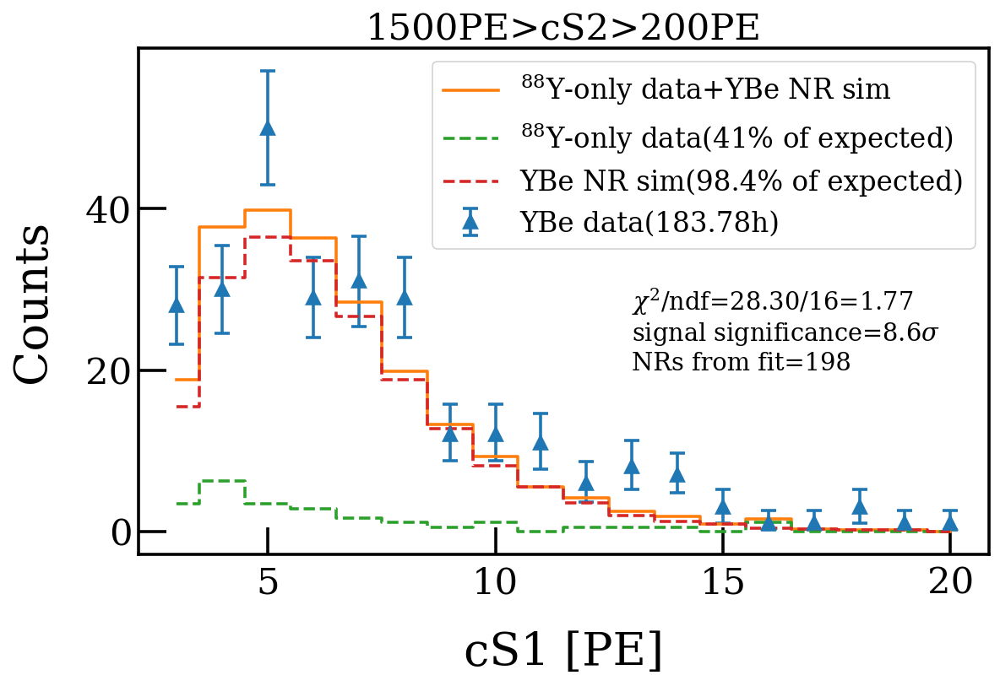

In [74]:
%matplotlib inline

bins=s1_bins
bin_center=(bins[1:]+bins[:-1])/2
for cut in [50,200]: #np.arange(50,350,50):
    upper=1500
    data_cut_s2=cut_cs1cs2(data_cuts,cs1=[2.5,20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(bkg_cuts,cs1=[2.5,20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(sim,cs1=[2.5,20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    bnds = [(0,100),(0,100)]
    # bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array([np.sqrt(h_bkg),np.sqrt(h_bkg)])*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # plt.errorbar(bin_center,h_sum,yerr=err_sum,label='$^{88}$Y'+f'*{res.x[0]/bkg_s:.2g}+sim*{res.x[1]/sim_s:.2g}',fmt='.')
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    # plt.step(bins[:-1],h_bkg*res0.x[0],label='bkg-only',linestyle='--')
    # plt.step(bins[:-1],h_bkg*res0.x[0],linestyle='--')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    
    # plt.yscale('log')
    plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.legend(loc='upper right',fontsize=18)
    plt.savefig(f"plots/fit_cs1_cs2>{cut}_float_bkg.png")
    
#     plt.figure(figsize=(10,6))
#     plt.step(bin_center,h_data,label='YBe')
#     plt.step(bin_center,h_bkg*bkg_s+h_sim*sim_s,label='$^{88}$Y+sim')
#     plt.step(bin_center,h_bkg*bkg_s,label='$^{88}$Y')
#     plt.step(bin_center,h_sim*sim_s,label='sim')
#     plt.xlabel('cS1 [PE]')
#     plt.ylabel('Counts')
    
#     plt.yscale('log')
#     plt.title(f'1500PE>cS2>{cut}PE')
#     plt.legend(loc='lower left',fontsize=18)
#     plt.savefig(f"plots/fit_cs1_cs2>{cut}.png")

    plt.show()

/tmp/jobs/23632566/ipykernel_205/1994149559.py:18: OptimizeWarning: Unknown solver options: xtol
  res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23632566/ipykernel_205/1994149559.py:27: OptimizeWarning: Unknown solver options: xtol
  res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),


a,b [2.70695196 0.0095086 ]
chi2/ndf=2.11/17=0.124311535201966
signal significance=3.26 sigma


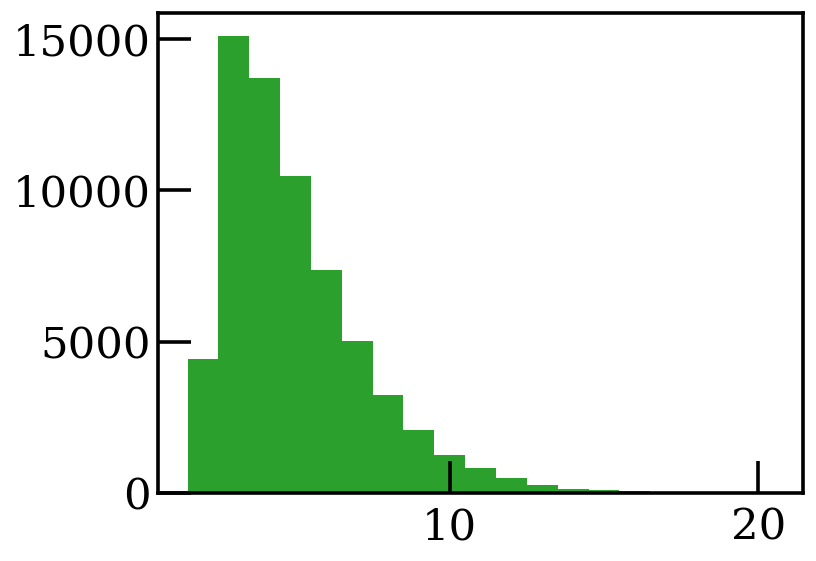

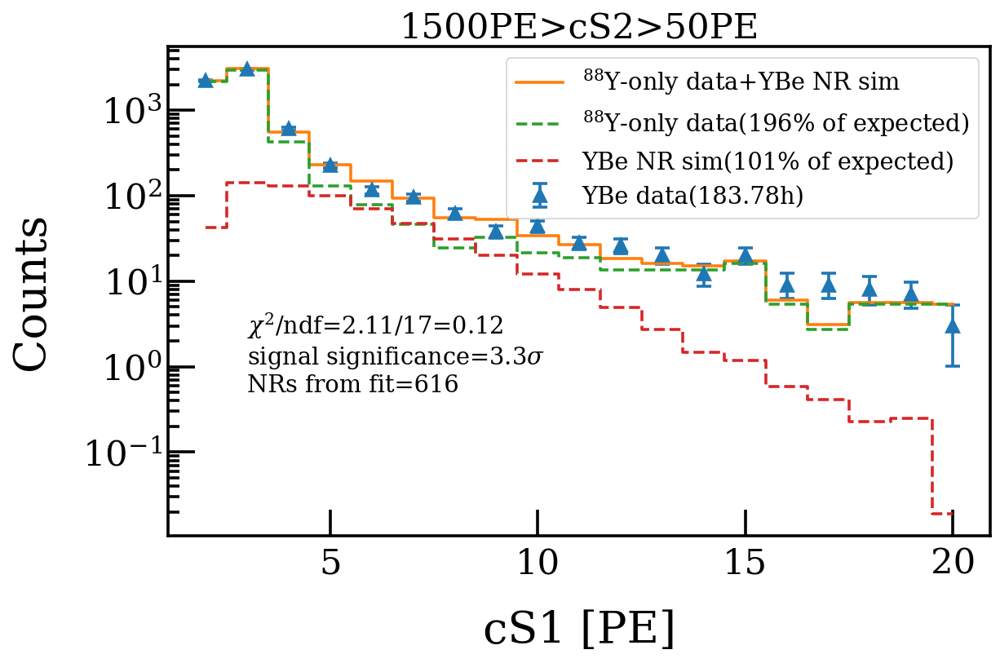

a,b [2.43309694 0.00825923]
chi2/ndf=5.14/17=0.3021758327326201
signal significance=5.58 sigma


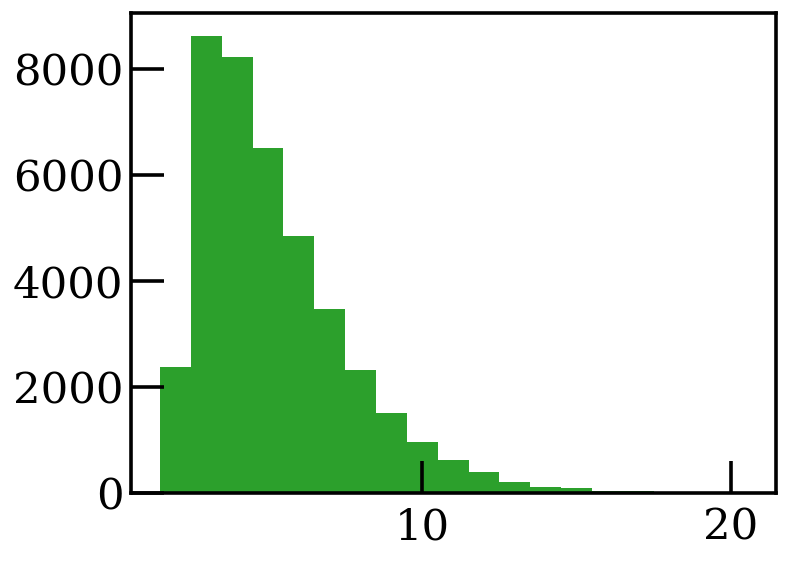

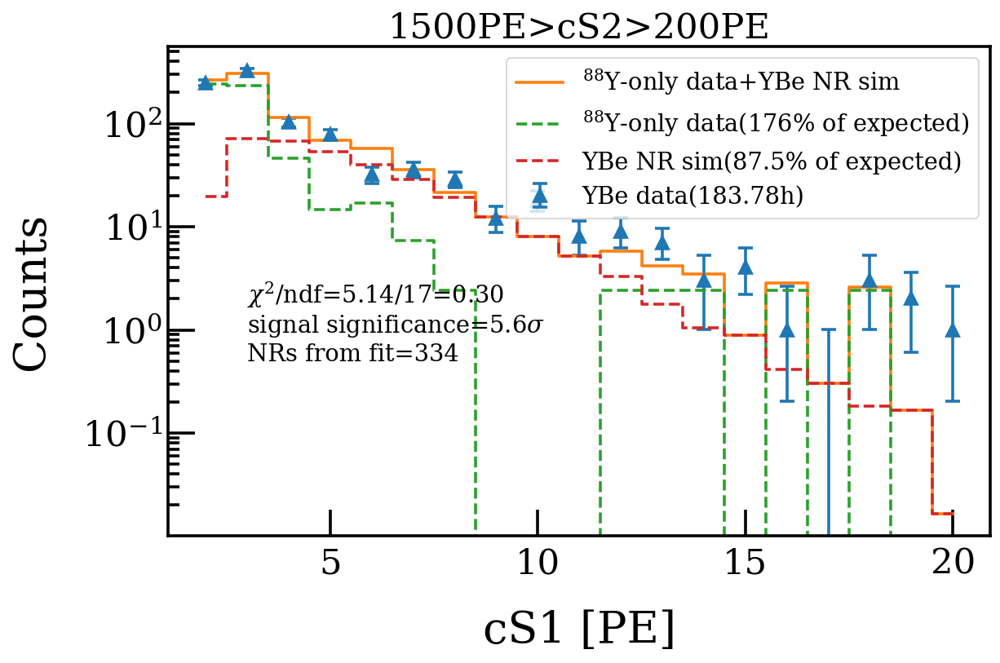

In [77]:
%matplotlib inline

bins=s1_bins
bin_center=(bins[1:]+bins[:-1])/2
for cut in [50,200]: #np.arange(50,350,50):
    upper=1500
    data_cut_s2=cut_cs1cs2(wire_cut(data_cuts),cs1=[min(s1_bins),20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(wire_cut(bkg_cuts),cs1=[min(s1_bins),20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(wire_cut(sim),cs1=[min(s1_bins),20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    bnds = [(0,100),(0,100)]
    # bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array([np.sqrt(h_bkg),np.sqrt(h_bkg)])*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # plt.errorbar(bin_center,h_sum,yerr=err_sum,label='$^{88}$Y'+f'*{res.x[0]/bkg_s:.2g}+sim*{res.x[1]/sim_s:.2g}',fmt='.')
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    # plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
    #          '$\sigma$\n' 
    #          #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
    #          +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    plt.text(3,.5, s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    
    
    plt.yscale('log')
    plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.legend(loc='upper right',fontsize=16)
    plt.savefig(f"plots/fit_cs1_cs2>{cut}_float_bkg_wire.png")


    plt.show()

a,b [2.47647265 0.01087303]
chi2/ndf=2.16/17=0.12682676835802265
signal significance=3.73 sigma


/tmp/jobs/23632566/ipykernel_205/1668534387.py:19: OptimizeWarning: Unknown solver options: xtol
  res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23632566/ipykernel_205/1668534387.py:28: OptimizeWarning: Unknown solver options: xtol
  res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),


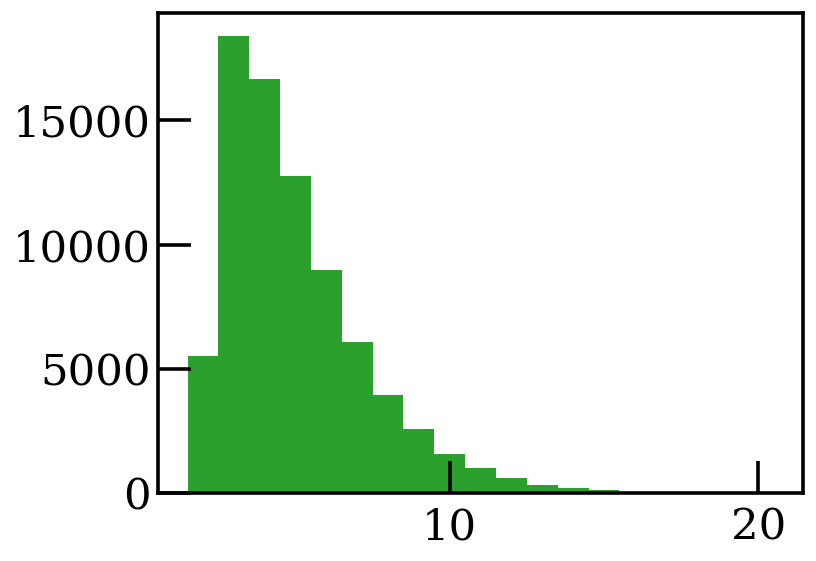

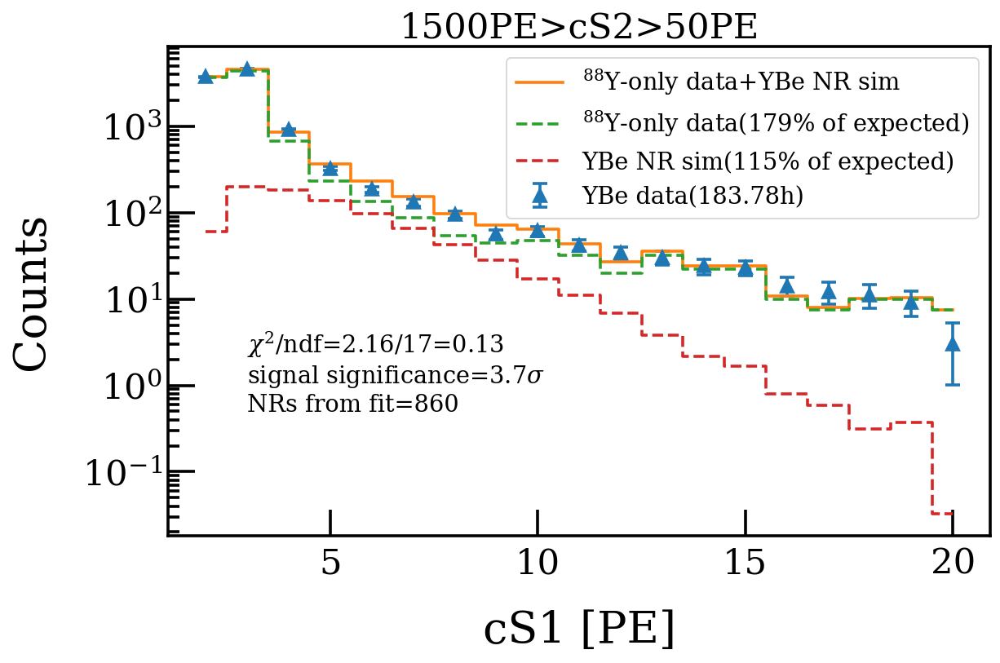

a,b [2.07139935 0.00997366]
chi2/ndf=9.02/17=0.5303723131040031
signal significance=6.36 sigma


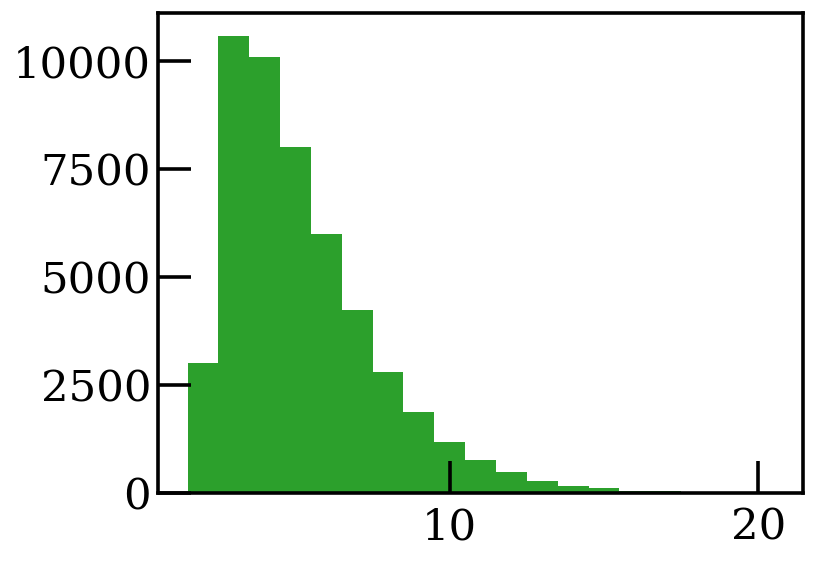

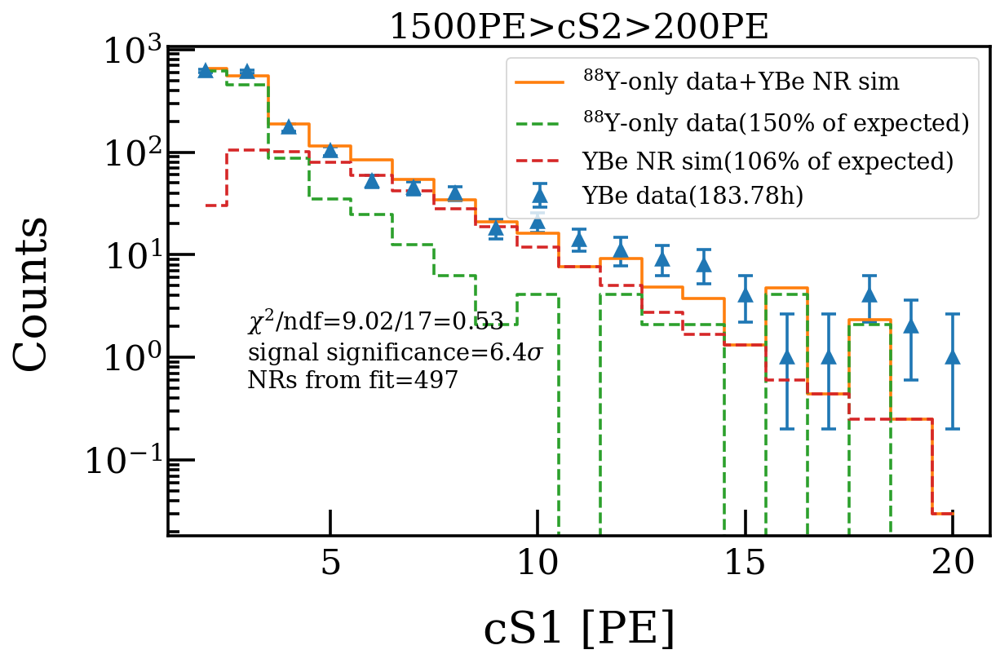

In [76]:
%matplotlib inline
# no wire cut
bins=s1_bins
bin_center=(bins[1:]+bins[:-1])/2
for cut in [50,200]: #np.arange(50,350,50):
    upper=1500
    data_cut_s2=cut_cs1cs2(data_cuts,cs1=[min(s1_bins),20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(bkg_cuts,cs1=[min(s1_bins),20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(sim,cs1=[min(s1_bins),20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    bnds = [(0,100),(0,100)]
    bnds = [(0,100),(0,100)]
    # bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array([np.sqrt(h_bkg),np.sqrt(h_bkg)])*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # plt.errorbar(bin_center,h_sum,yerr=err_sum,label='$^{88}$Y'+f'*{res.x[0]/bkg_s:.2g}+sim*{res.x[1]/sim_s:.2g}',fmt='.')
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    # plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
    #          '$\sigma$\n' 
    #          #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
    #          +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    plt.text(3,.5, s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    
    
    plt.yscale('log')
    plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.legend(loc='upper right',fontsize=16)
    # plt.savefig(f"plots/fit_cs1_cs2>{cut}_float_bkg_wire.png")


    plt.show()

833 351.66950615281894


/tmp/jobs/23632566/ipykernel_205/1752445411.py:22: UserWarning: Number of reference samples (37245) should be much larger than number of data samples (833) to ensure negligible statistical fluctuations for the equiprobable binning.
  gof_object = ge.BinnedPoissonChi2GOF.bin_equiprobable(data_sample=data_sample,
/home/scli/GOFevaluation/GOFevaluation/evaluator_base.py:189: UserWarning: p-value is 0.0. (Observed GoF: 1.64e+03, maximum of simulated GoFs: 7.44e+01). For a more precise result, increase n_mc!
  pvalue, _ = self._get_pvalue(n_mc=n_mc)


GOF = 1635.65
p-value = 0.00



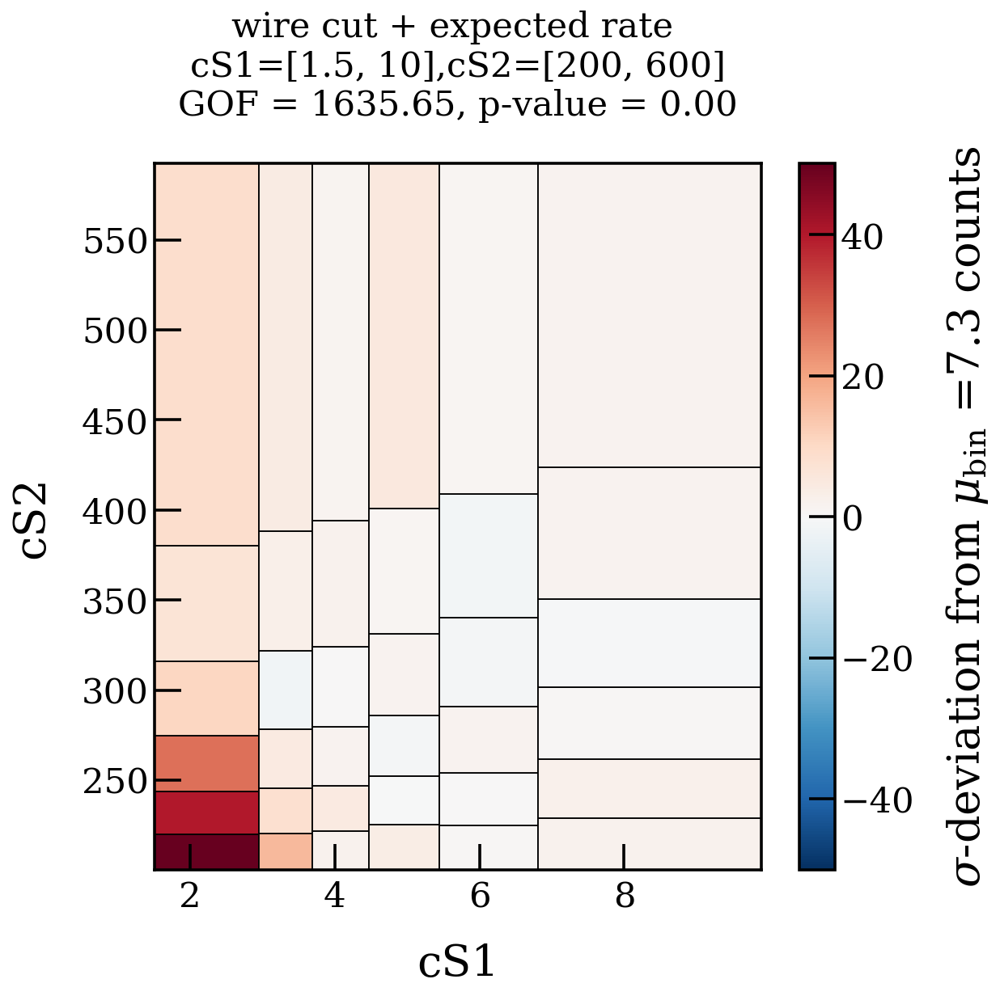

In [62]:
# cs1_range=[2.5,10]
cs1_range=[1.5,10]
cs2_range=[200,600]
d_in=cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range)
s_in=cut_cs1cs2(wire_cut(sim),cs1=cs1_range,cs2=cs2_range)
GOF_equal_prob(d_in,s_in,cs1_range,cs2_range,label='wire cut + expected rate \n',sim_scale=0.00708208)

## Fit cs2 and project on cs1

In [28]:
np.linspace(200,1000,17)

array([ 200.,  250.,  300.,  350.,  400.,  450.,  500.,  550.,  600.,
        650.,  700.,  750.,  800.,  850.,  900.,  950., 1000.])

/tmp/jobs/23609521/ipykernel_123/2333061828.py:23: OptimizeWarning: Unknown solver options: xtol
  res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23609521/ipykernel_123/2333061828.py:32: OptimizeWarning: Unknown solver options: xtol
  res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),


a,b [2.22737016 0.00511284]
chi2/ndf=17.34/15=1.1558139471982385
signal significance=3.91 sigma


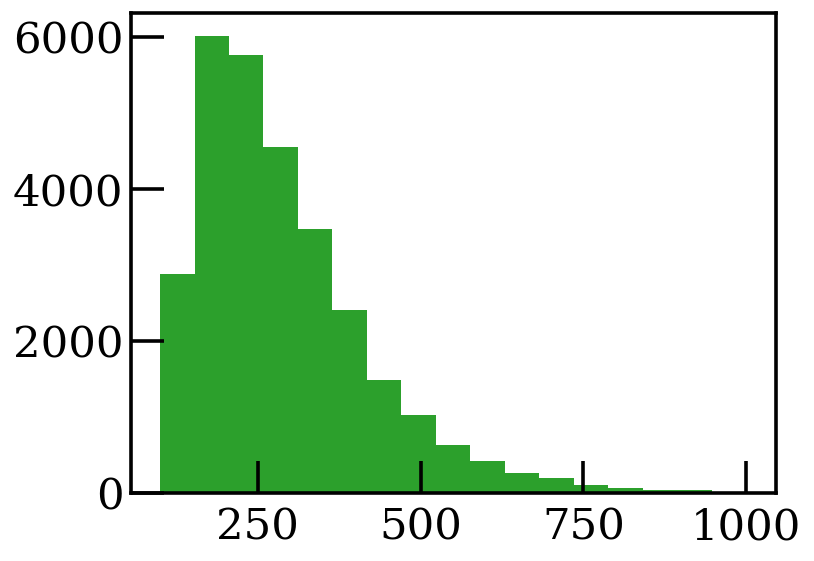

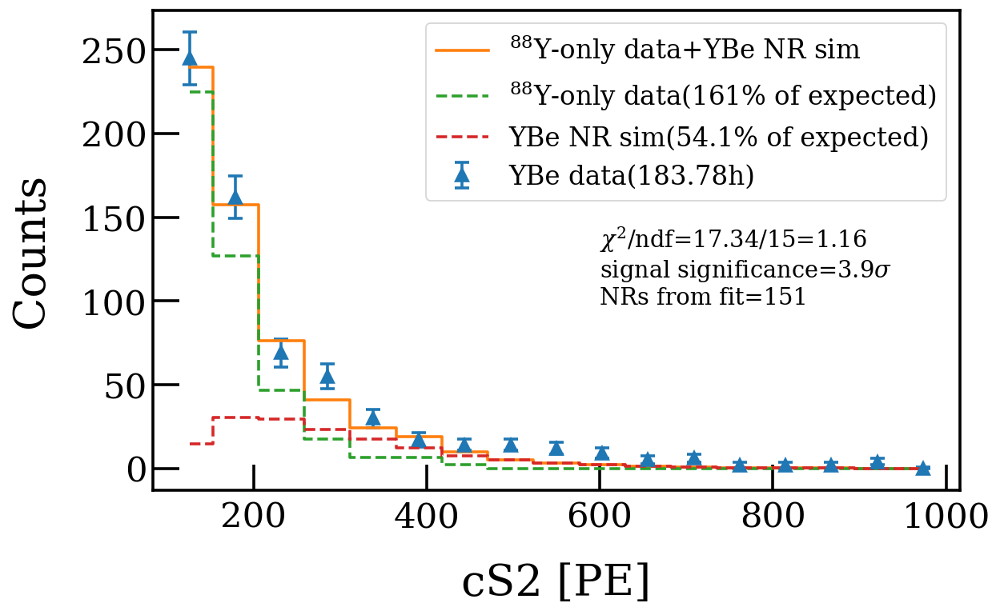

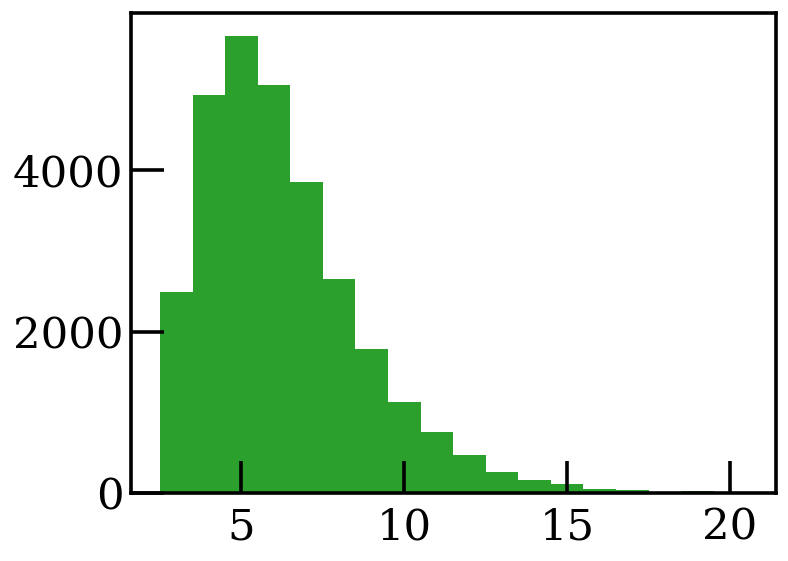

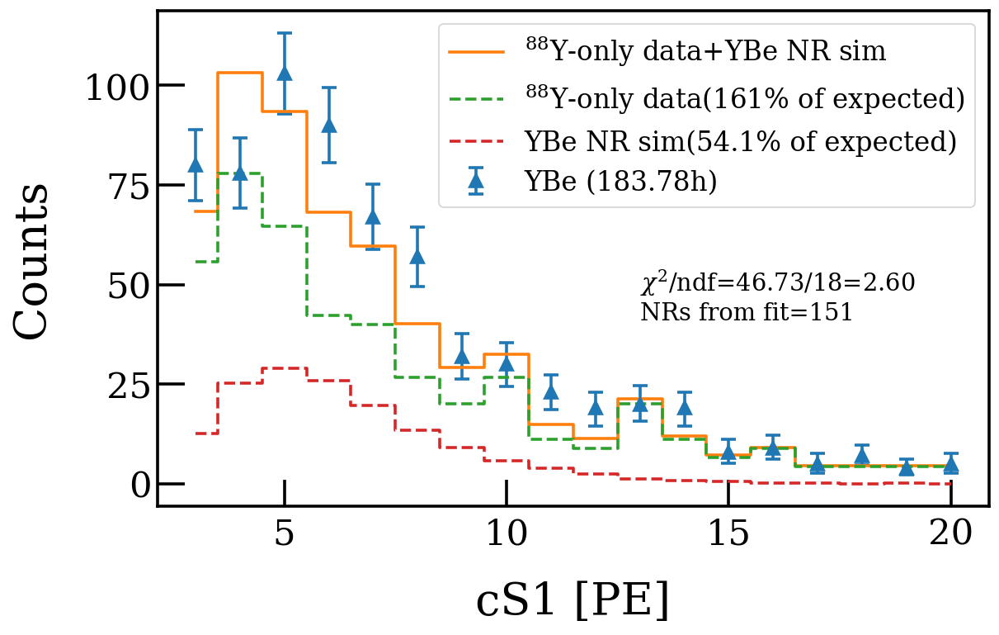

a,b [1.28047212 0.00788327]
chi2/ndf=15.92/15=1.0614272374333196
signal significance=5.94 sigma


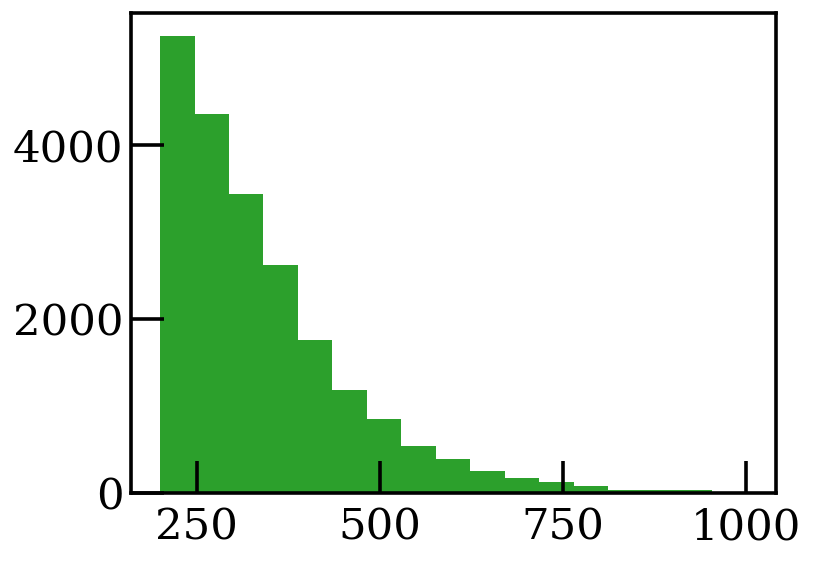

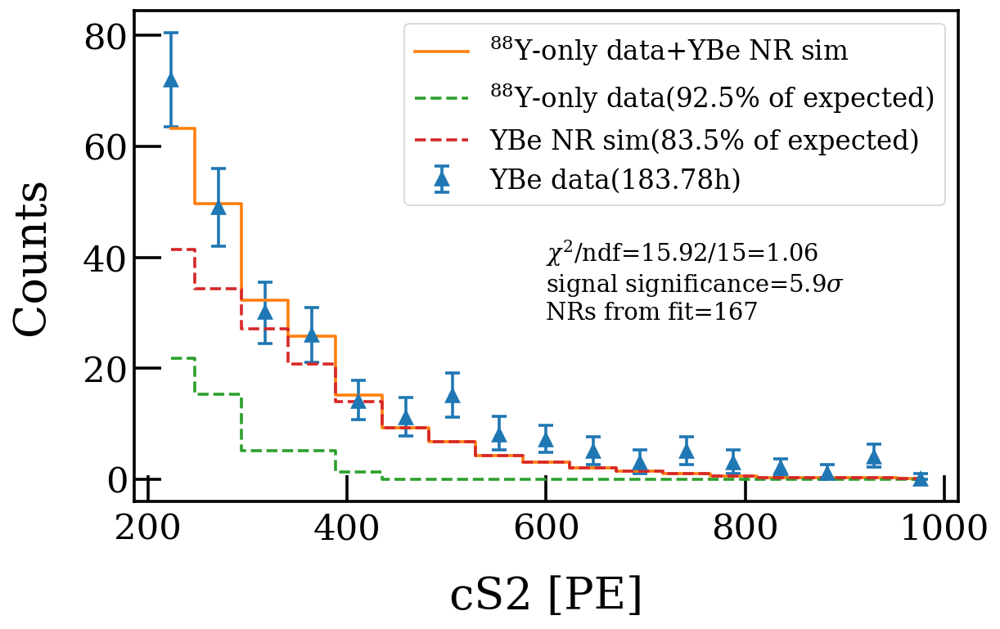

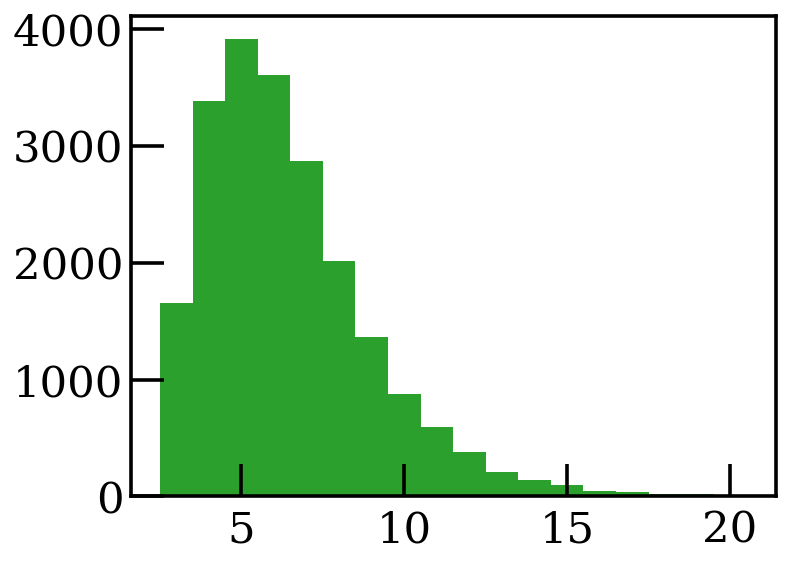

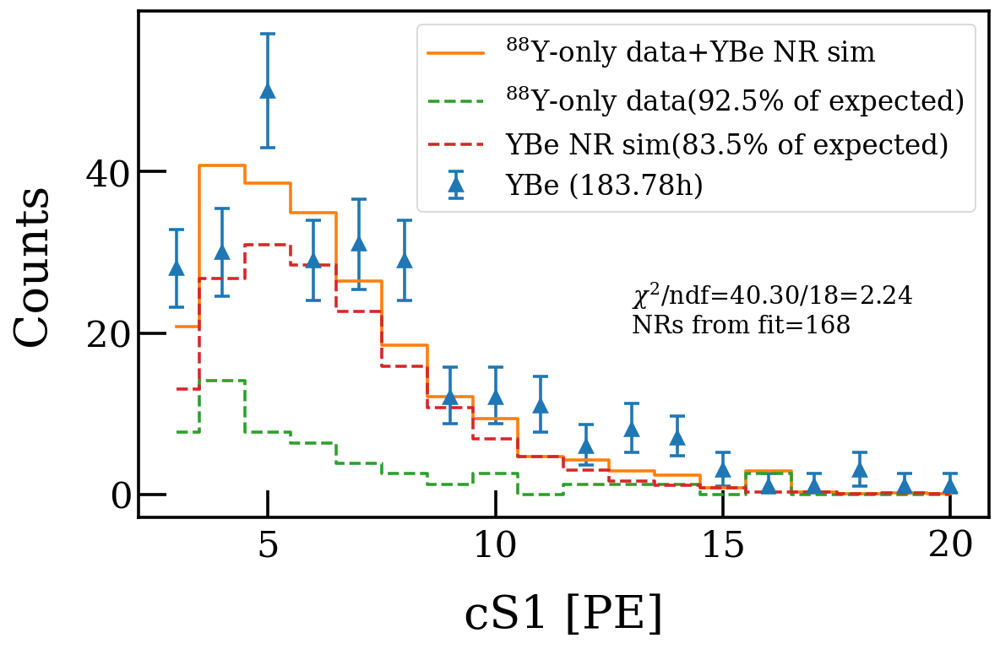

In [85]:
%matplotlib inline

#with wire

for cut in [100,200]: #np.arange(50,350,50):
    #fit and plot in cs2 space
    # bins=np.linspace(200,1000,17)
    bins=np.linspace(max(cut,100),1000,18)
    # bins=np.linspace(100,1000,9)
    bin_center=(bins[1:]+bins[:-1])/2
    upper=1500
    data_cut_s2=cut_cs1cs2(data_cuts,cs1=[min(s1_bins),max(s1_bins)],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(bkg_cuts,cs1=[min(s1_bins),max(s1_bins)],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(sim,cs1=[min(s1_bins),max(s1_bins)],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs2,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs2,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs2,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    bnds = [(0,10),(0,10)]
    # bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array(poi_err(h_bkg))*res.x[1]
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.xlabel('cS2 [PE]')
    plt.ylabel('Counts')
    plt.text(600,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    plt.legend(loc='upper right',fontsize=18)
    # plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.show()
    plt.savefig(f"plots/fit_cs2>{cut}.png")

    
    #plot in cs1 space
    
    bins=s1_bins
    bin_center=(bins[1:]+bins[:-1])/2
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    s1_chi2=chi2(res.x,h_data,h_bkg,h_sim, err)

    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe ({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{s1_chi2:.2f}/{(len(h_data))}={s1_chi2/(len(h_data)):.2f} \n' \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    plt.legend(loc='upper right',fontsize=18)
    # plt.title(f'{upper}PE>cS2>{cut}PE')
    
    
    
    
    
    
    
    
    
    
    
    plt.savefig(f"plots/fit_cs2>{cut}_in_cs1.png")
    


    plt.show()

/tmp/jobs/23609521/ipykernel_123/1587632775.py:23: OptimizeWarning: Unknown solver options: xtol
  res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
/tmp/jobs/23609521/ipykernel_123/1587632775.py:32: OptimizeWarning: Unknown solver options: xtol
  res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),


a,b [2.82779843 0.00812655]
chi2/ndf=34.14/15=2.2757932236090648
signal significance=7.54 sigma


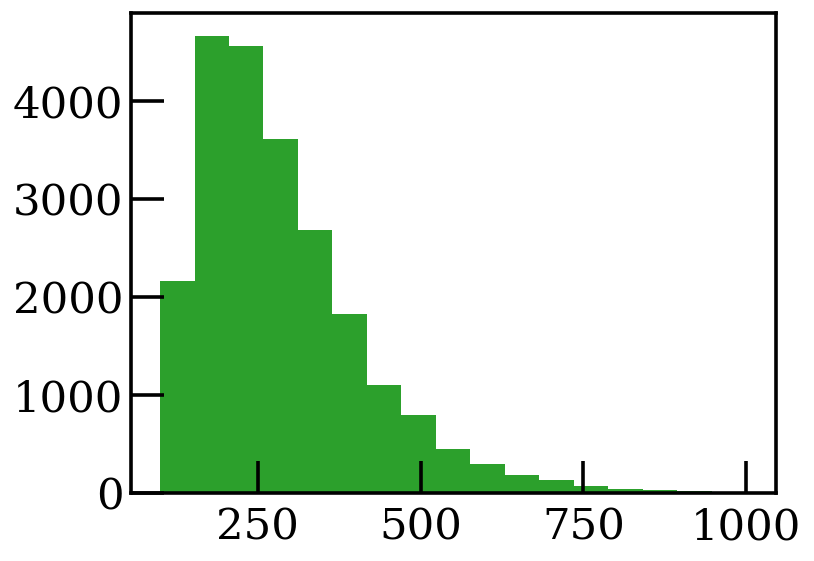

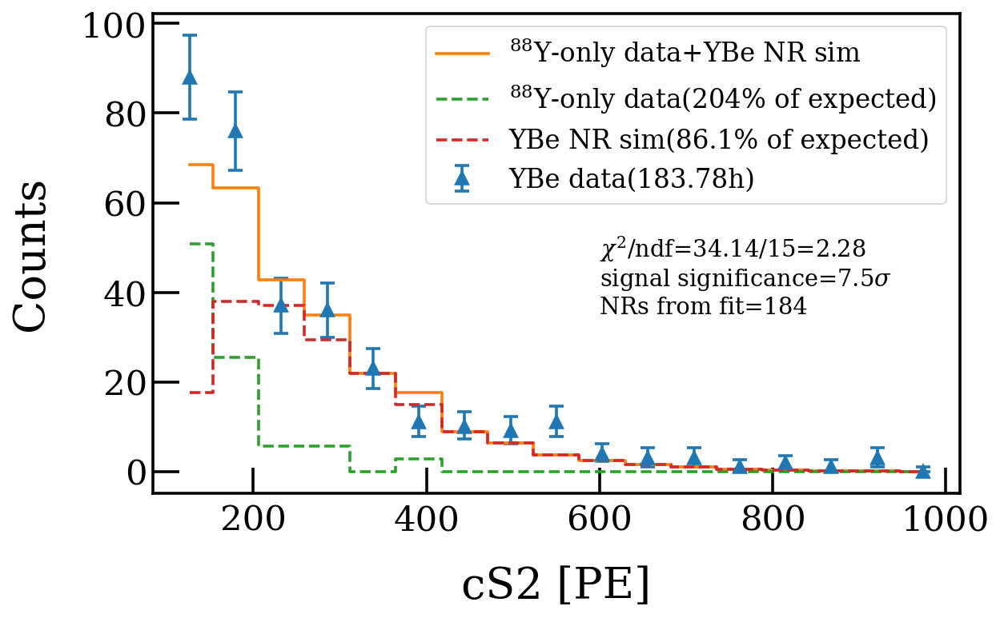

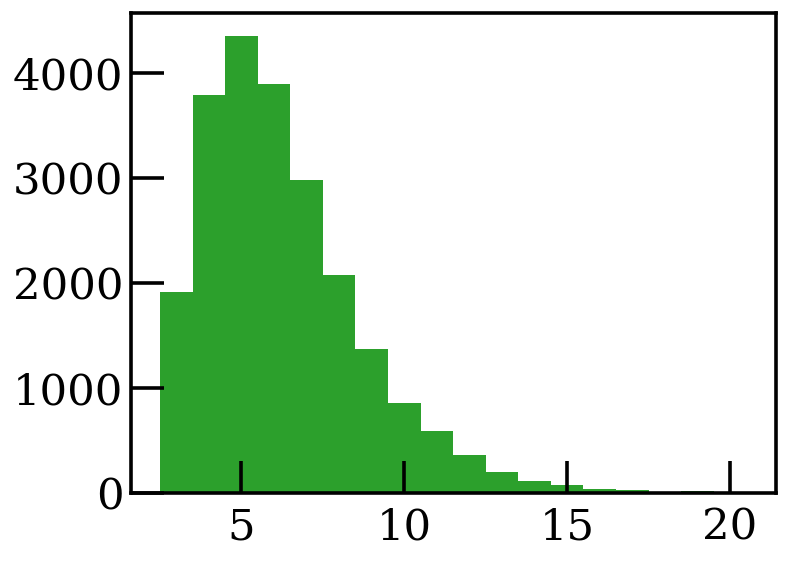

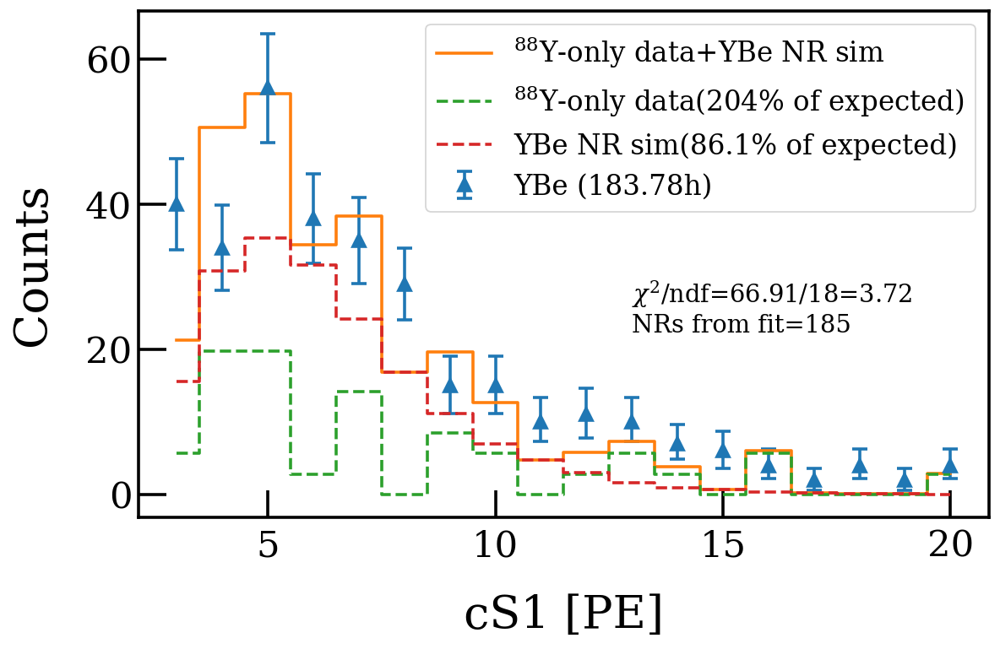

a,b [0.28441754 0.00796552]
chi2/ndf=11.67/15=0.7780767233204687
signal significance=9.17 sigma


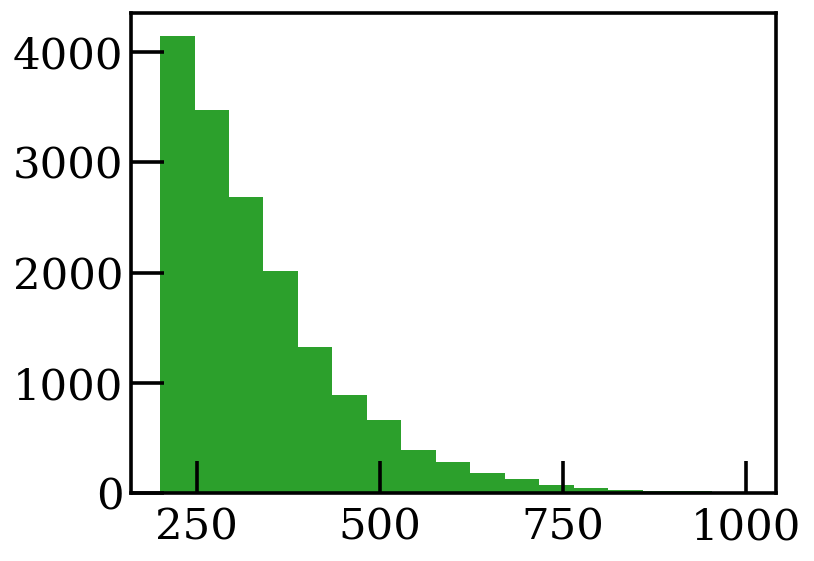

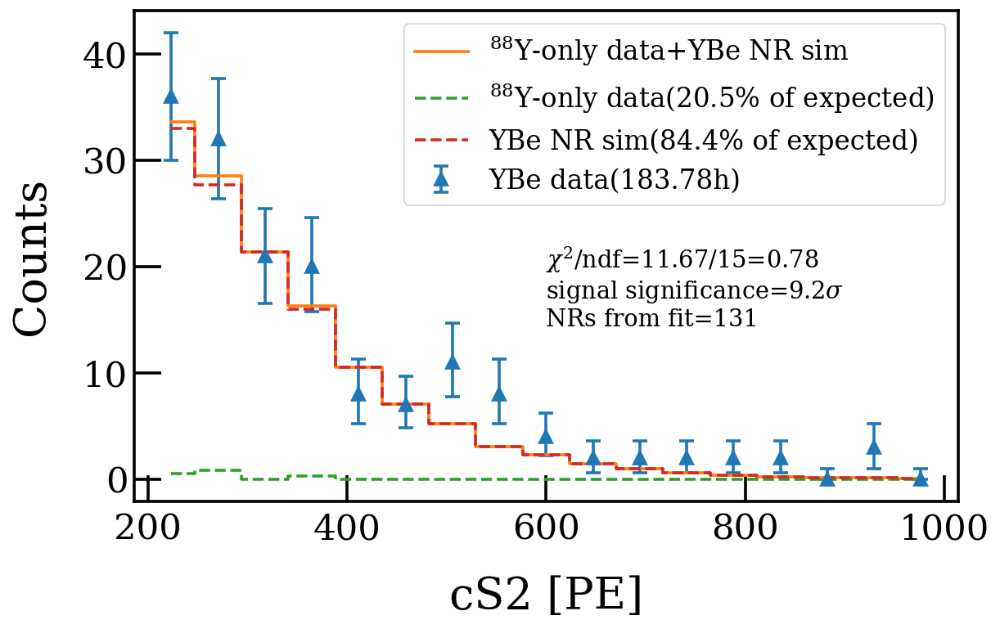

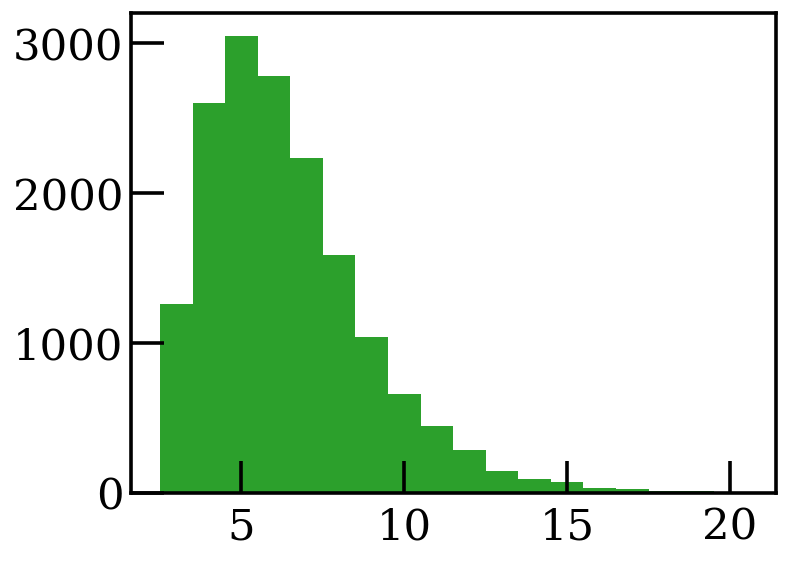

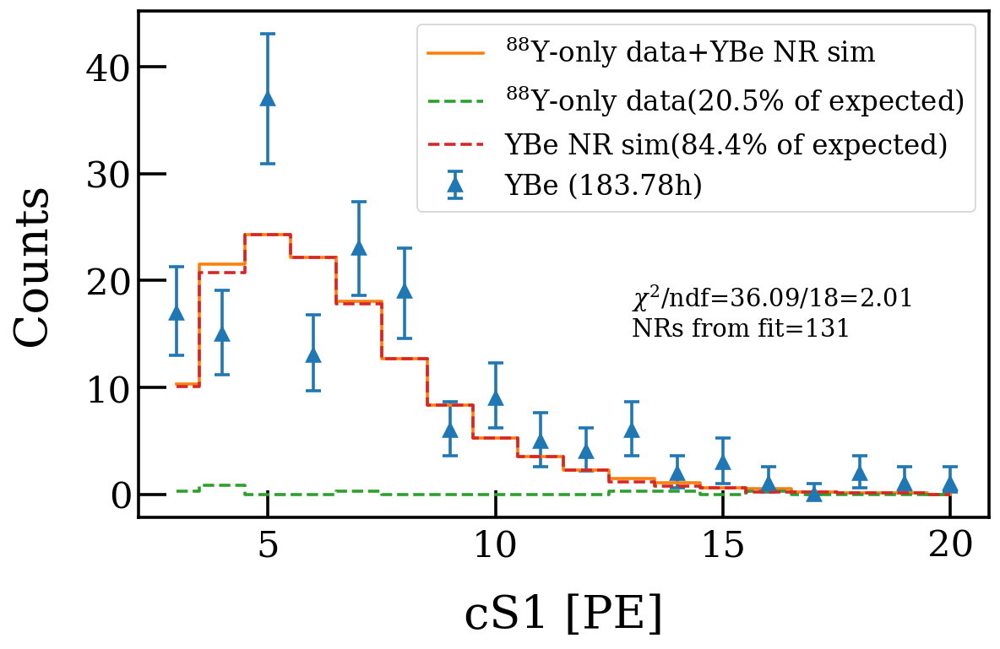

In [87]:
%matplotlib inline

#no wire

for cut in [100,200]: #np.arange(50,350,50):
    #fit and plot in cs2 space
    # bins=np.linspace(200,1000,17)
    bins=np.linspace(max(cut,100),1000,18)
    # bins=np.linspace(100,1000,9)
    bin_center=(bins[1:]+bins[:-1])/2
    upper=1500
    data_cut_s2=cut_cs1cs2(wire_cut(data_cuts),cs1=[min(s1_bins),max(s1_bins)],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(wire_cut(bkg_cuts),cs1=[min(s1_bins),max(s1_bins)],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(wire_cut(sim),cs1=[min(s1_bins),max(s1_bins)],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs2,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs2,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs2,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    bnds = [(0,10),(0,10)]
    # bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array(poi_err(h_bkg))*res.x[1]
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.xlabel('cS2 [PE]')
    plt.ylabel('Counts')
    plt.text(600,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    plt.legend(loc='upper right',fontsize=18)
    # plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.show()
    plt.savefig(f"plots/fit_cs2>{cut}_nowire.png")

    
    #plot in cs1 space
    
    bins=s1_bins
    bin_center=(bins[1:]+bins[:-1])/2
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    s1_chi2=chi2(res.x,h_data,h_bkg,h_sim, err)

    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe ({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{s1_chi2:.2f}/{(len(h_data))}={s1_chi2/(len(h_data)):.2f} \n' \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    plt.legend(loc='upper right',fontsize=18)
    # plt.title(f'{upper}PE>cS2>{cut}PE')
    
    
    
    
    
    
    
    
    
    
    
    plt.savefig(f"plots/fit_cs2>{cut}_in_cs1_nowire.png")
    


    plt.show()

# Fit AC template

In [ ]:
%matplotlib inline

bins=np.linspace(2.5,20,20)
bin_center=(bins[1:]+bins[:-1])/2
for cut in [50,200]: #np.arange(50,350,50):
    upper=1500
    data_cut_s2=cut_cs1cs2(wire_cut(data_cuts),cs1=[2.5,20],cs2=[cut,upper])
    bkg_cut_s2=cut_cs1cs2(wire_cut(bkg_cuts),cs1=[2.5,20],cs2=[cut,upper])
    sim_cut_s2=cut_cs1cs2(wire_cut(ac_sim_cuts),cs1=[2.5,20],cs2=[cut,upper])
    h_data=plt.hist(data_cut_s2.cs1,bins=bins)[0]
    h_bkg=plt.hist(bkg_cut_s2.cs1,bins=bins)[0]
    h_sim=plt.hist(sim_cut_s2.cs1,bins=bins)[0]
    err=np.array(poi_err(h_data))
    x0=[ bkg_s, sim_s]
    bnds = [(0,100),(0,100)]
    # bnds = [(bkg_s,bkg_s),(0,100)]
    # bnds = [(bkg_s,bkg_s),(sim_s,sim_s)]
    res= minimize(chi2,  x0, args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=bnds,
              options={'xtol': 1e-3, 'disp': 0}
             )

    print('a,b', res.x)
    print(f'chi2/ndf={res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2)}')
    
    res0= minimize(chi2, [bkg_s,0], args=(h_data,h_bkg,h_sim,err[1]),
              method='nelder-mead', 
              bounds=[(0,100),(0,0)],
              options={'xtol': 1e-3, 'disp': 0}
             )
    print(f'signal significance={np.sqrt(res0.fun-res.fun):.2f} sigma')
    
    
    plt.figure(figsize=(10,6))
    plt.errorbar(bin_center,h_data,yerr=err,label=f'YBe data({hour}h)',fmt='^')
    h_sum=h_bkg*res.x[0]+h_sim*res.x[1]
    err_sum=np.array([np.sqrt(h_bkg),np.sqrt(h_bkg)])*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # err_sum=np.array(poi_err(h_bkg))*res.x[0]+np.array([np.sqrt(h_sim),np.sqrt(h_sim)])*res.x[1]
    # plt.errorbar(bin_center,h_sum,yerr=err_sum,label='$^{88}$Y'+f'*{res.x[0]/bkg_s:.2g}+sim*{res.x[1]/sim_s:.2g}',fmt='.')
    plt.step(bin_center,h_sum,label='$^{88}$Y-only data+YBe NR sim',where='mid')
    plt.step(bin_center,h_bkg*res.x[0],label='$^{88}$Y-only data('+f'{res.x[0]/bkg_s*100:.3g}% of expected)',linestyle='--',where='mid')
    plt.step(bin_center,h_sim*res.x[1],label='YBe NR sim('+ f'{res.x[1]/sim_s*100:.3g}% of expected)',linestyle='--',where='mid')
    # plt.step(bins[:-1],h_bkg*res0.x[0],label='bkg-only',linestyle='--')
    # plt.step(bins[:-1],h_bkg*res0.x[0],linestyle='--')
    plt.xlabel('cS1 [PE]')
    plt.ylabel('Counts')
    plt.text(13,0.4*max(h_data), s='$\chi^2$/ndf='+f'{res.fun:.2f}/{(len(h_data)-2)}={res.fun/(len(h_data)-2):.2f} \nsignal significance={np.sqrt(res0.fun-res.fun):.1f}'+ \
             '$\sigma$\n' 
             #+ f'total-ER={np.sum(h_data)-np.sum(h_bkg)*res.x[0]:.0f} \n'+ \
             +f'NRs from fit={np.sum(h_sim)*res.x[1]:.0f}',fontsize=16)
    
    # plt.yscale('log')
    plt.title(f'{upper}PE>cS2>{cut}PE')
    plt.legend(loc='upper right',fontsize=18)
    plt.savefig(f"plots/fit_cs1_cs2>{cut}_float_bkg_wire.png")
    
#     plt.figure(figsize=(10,6))
#     plt.step(bin_center,h_data,label='YBe')
#     plt.step(bin_center,h_bkg*bkg_s+h_sim*sim_s,label='$^{88}$Y+sim')
#     plt.step(bin_center,h_bkg*bkg_s,label='$^{88}$Y')
#     plt.step(bin_center,h_sim*sim_s,label='sim')
#     plt.xlabel('cS1 [PE]')
#     plt.ylabel('Counts')
    
#     plt.yscale('log')
#     plt.title(f'1500PE>cS2>{cut}PE')
#     plt.legend(loc='lower left',fontsize=18)
#     plt.savefig(f"plots/fit_cs1_cs2>{cut}.png")

    plt.show()

In [46]:
err,h_data

(array([[3.71717172, 3.25252525, 4.80808081, 4.45454545, 3.71717172,
         4.41414141, 3.28282828, 2.74747475, 2.15151515, 1.77777778,
         1.39393939, 2.36363636, 1.39393939, 1.98989899, 0.7979798 ,
         0.        , 0.7979798 , 1.39393939, 0.7979798 ],
        [4.04040404, 3.81818182, 4.80808081, 4.45454545, 4.04040404,
         4.03030303, 3.80808081, 3.31313131, 2.6969697 , 2.26262626,
         1.63636364, 2.68686869, 1.63636364, 2.25252525, 1.62626263,
         1.01010101, 1.62626263, 1.63636364, 1.62626263]]),
 array([16., 14., 28., 21., 16., 19., 13.,  8.,  7.,  4.,  2.,  6.,  2.,
         3.,  1.,  0.,  1.,  2.,  1.]))

In [50]:
err[1]**2

array([16.32486481, 14.5785124 , 23.11764106, 19.84297521, 16.32486481,
       16.24334252, 14.50147944, 10.9768391 ,  7.27364555,  5.1194776 ,
        2.67768595,  7.21926334,  2.67768595,  5.07387001,  2.64473013,
        1.02030405,  2.64473013,  2.67768595,  2.64473013])

In [47]:
poi_err(h_data)

[[3.7171717171717162,
  3.2525252525252526,
  4.80808080808081,
  4.454545454545453,
  3.7171717171717162,
  4.414141414141415,
  3.282828282828282,
  2.7474747474747474,
  2.1515151515151514,
  1.7777777777777777,
  1.393939393939394,
  2.3636363636363638,
  1.393939393939394,
  1.9898989898989898,
  0.797979797979798,
  0.0,
  0.797979797979798,
  1.393939393939394,
  0.797979797979798],
 [4.0404040404040416,
  3.8181818181818166,
  4.80808080808081,
  4.454545454545457,
  4.0404040404040416,
  4.030303030303028,
  3.8080808080808097,
  3.313131313131313,
  2.6969696969696972,
  2.262626262626262,
  1.6363636363636362,
  2.686868686868687,
  1.6363636363636362,
  2.2525252525252526,
  1.6262626262626263,
  1.0101010101010102,
  1.6262626262626263,
  1.6363636363636362,
  1.6262626262626263]]

In [42]:
chi2(res.x,h_data,h_bkg,h_sim, err)

/tmp/jobs/23559085/ipykernel_178/172946426.py:5: RuntimeWarning: divide by zero encountered in true_divide
  chi2=np.sum((data-est)**2/err**2)


inf

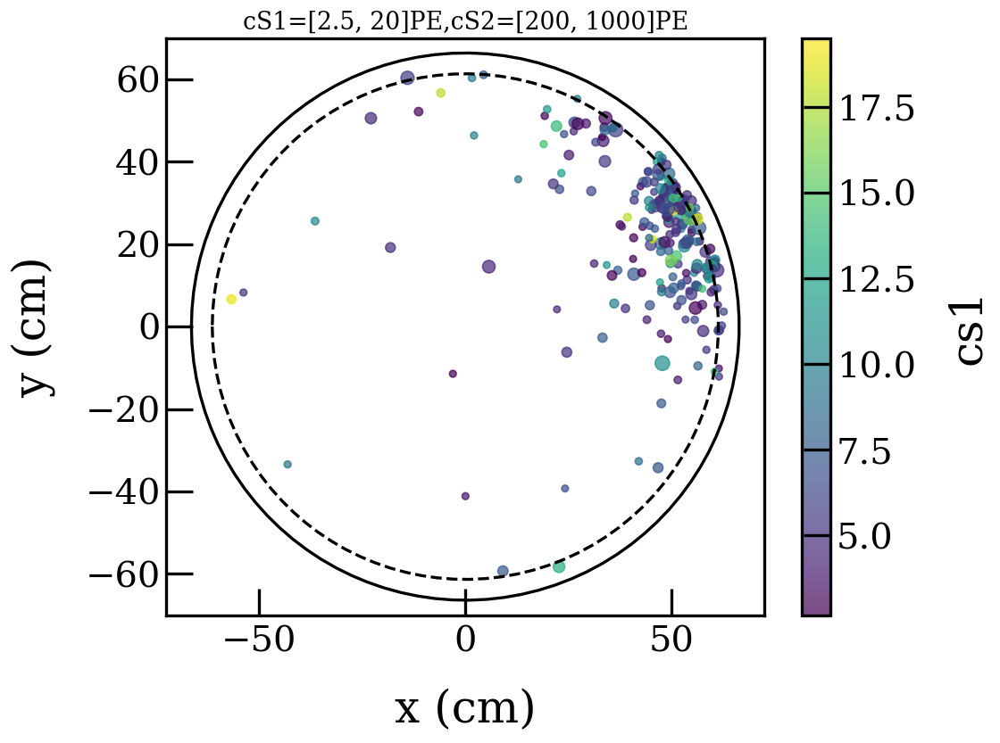

In [93]:
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_xy(cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

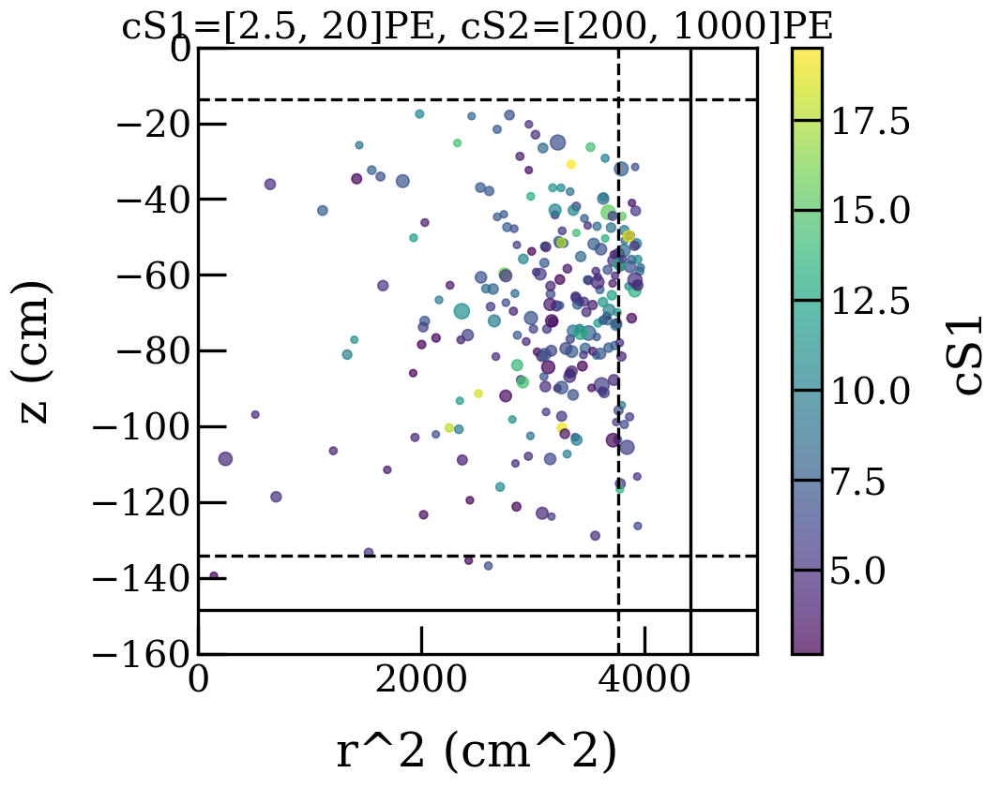

In [108]:
cs1_range=[2.5,20]
cs2_range=[200,1000]
plot_rz(cut_cs1cs2(wire_cut(data_cuts),cs1=cs1_range,cs2=cs2_range),cs1_range,cs2_range)

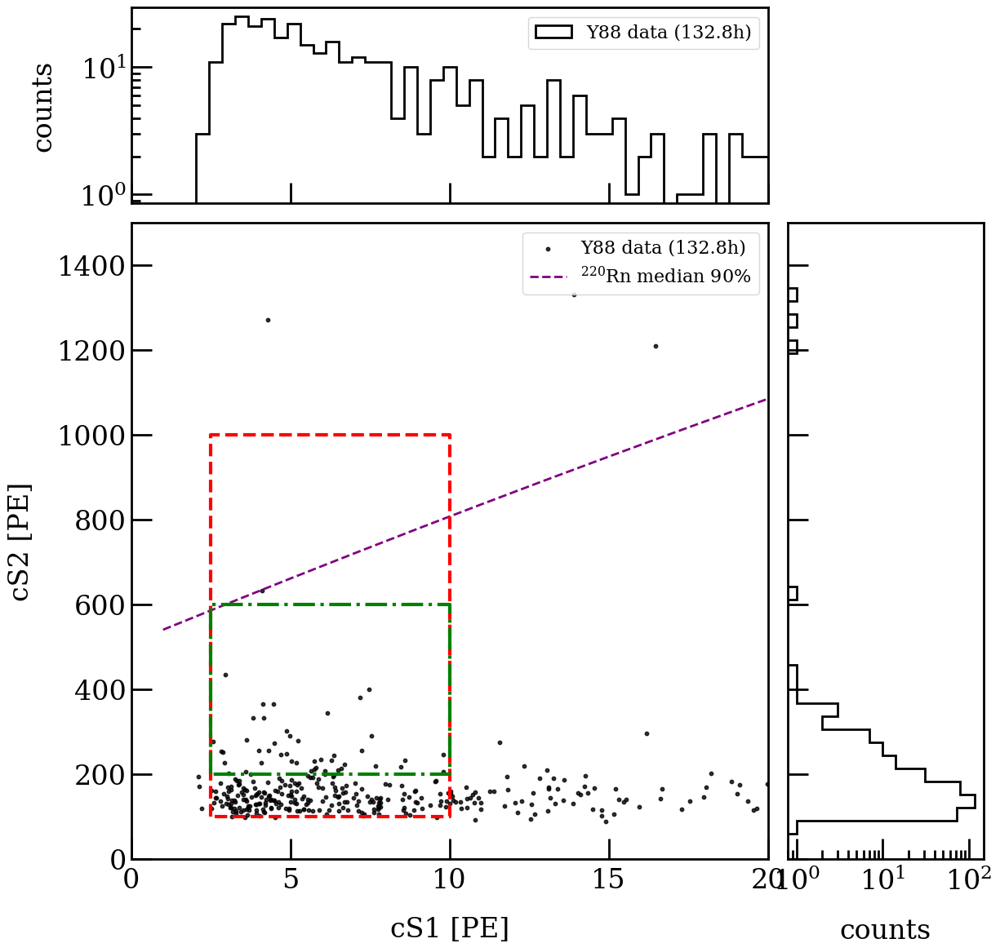

In [103]:
#bkg no wire
%matplotlib inline
plot_cs1cs2_simple(cut_cs1cs2(bkg_cuts,cs1=[0,20],cs2=[50,1500]),data_label=f'Y88 data ({b_hour:.1f}h)',sim_label=f'YBe sim ({s_hour}h)')#,plot_sim='contour')

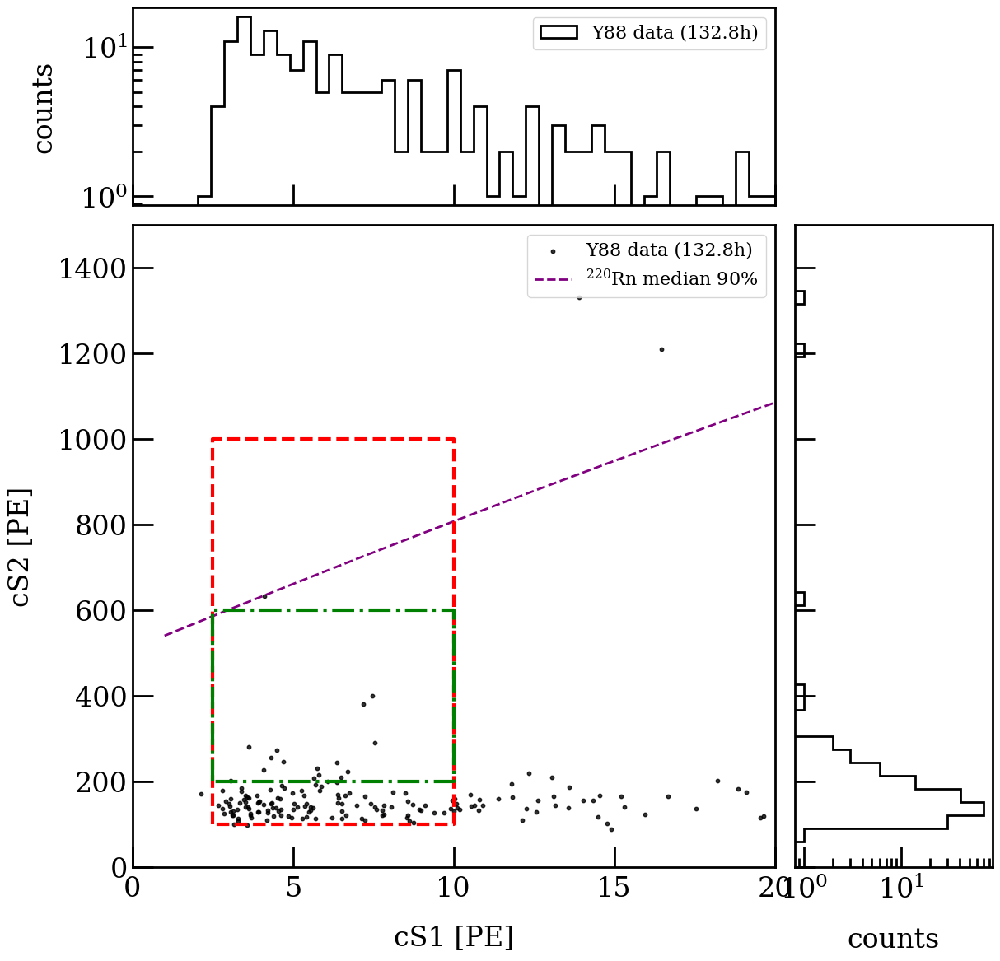

In [69]:
#bkg no wire
%matplotlib inline
plot_cs1cs2_simple(cut_cs1cs2(wire_cut(bkg_cuts),cs1=[0,20],cs2=[50,1500]),data_label=f'Y88 data ({b_hour:.1f}h)',sim_label=f'YBe sim ({s_hour}h)')#,plot_sim='contour')

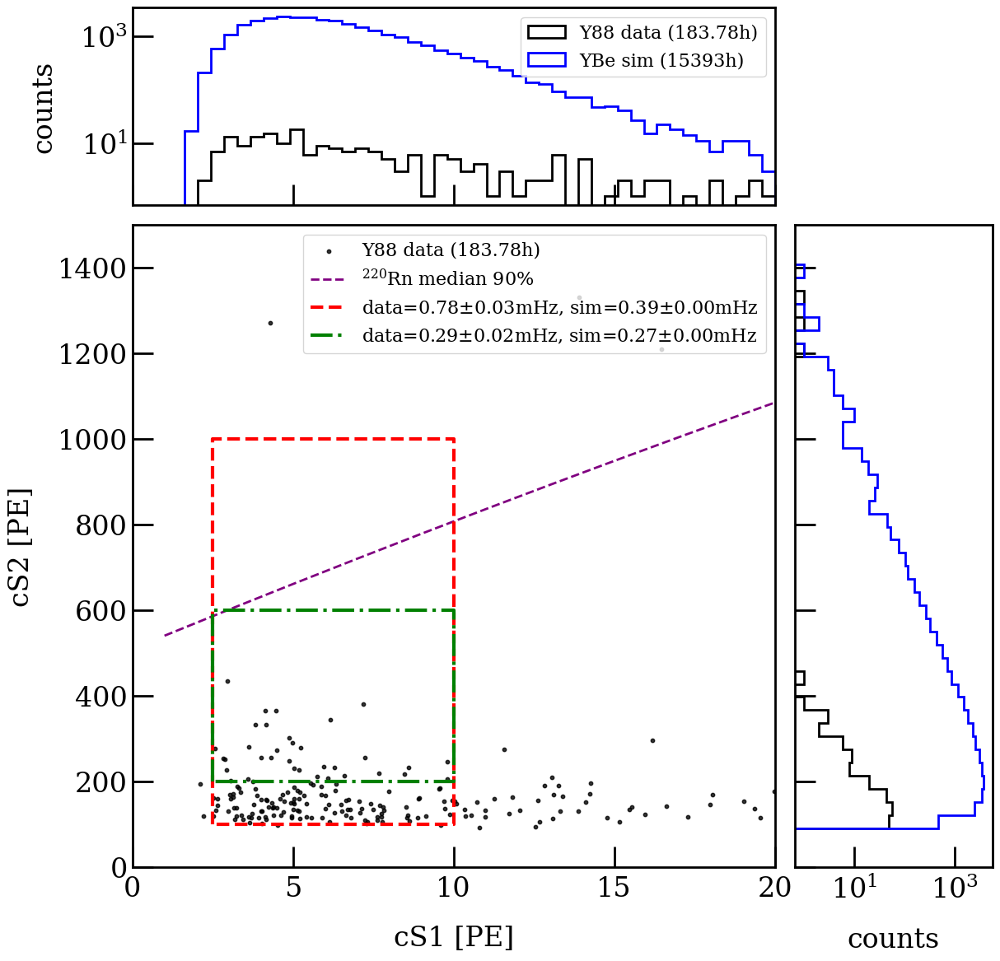

In [72]:
%matplotlib inline
plot_cs1cs2(cut_cs1cs2(bkg_cuts,cs1=[0,20],cs2=[50,1500]),df_sim=cut_cs1cs2(sim,cs1=[0,20],cs2=[50,1500]),data_label=f'Y88 data ({hour}h)',sim_label=f'YBe sim ({s_hour}h)')#,plot_sim='contour')

In [92]:
%matplotlib inline
plot_cs1cs2(cut_cs1cs2(data_cuts,cs1=[0,20],cs2=[50,1500]),df_sim=cut_cs1cs2(sim,cs1=[0,20],cs2=[50,1500]),data_label=f'YBe data ({hour}h)',sim_label=f'YBe sim ({s_hour}h)')#,plot_sim='contour')

(0.5235987755982988,
 13.06,
 <function straxen.common.rotate_perp_wires(x_obs: numpy.ndarray, y_obs: numpy.ndarray, angle_extra: Union[float, int] = 0)>)

In [125]:
ac_sim_cuts.cs1

814         8.313192
815        22.649387
843        22.146624
844         6.535807
862        18.050352
             ...    
3796257     4.189952
3796311     2.084682
3796351     9.605817
3796358     1.644939
3796394     2.241017
Name: cs1, Length: 650033, dtype: float32

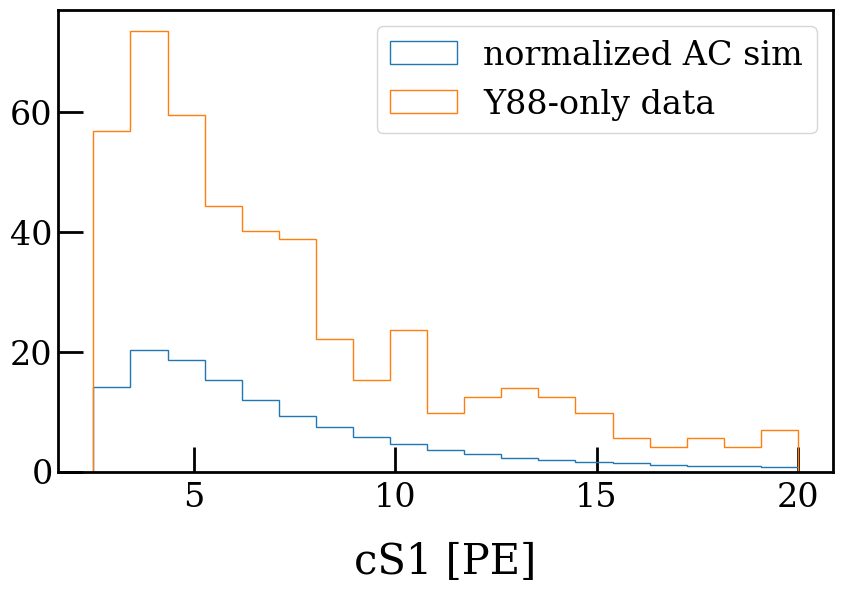

0.27128960545045017

In [158]:
plt.figure(figsize=(10,6))
d1=cut_cs1cs2(ac_sim_cuts,cs1=[0,20],cs2=[100,1500])
d2=cut_cs1cs2(bkg_cuts,cs1=[0,20],cs2=[100,1500])
bins=np.linspace(2.5,20,20)
h1=plt.hist(d1.cs1,bins=bins,histtype='step',weights=np.ones(len(d1))*bkg_sim_s*normalization,label='normalized AC sim')
h2=plt.hist(d2.cs1,bins=bins,histtype='step',weights=np.ones(len(d2))*bkg_s,label='Y88-only data')
plt.xlabel('cS1 [PE]')
# plt.ylabel('Counts')
plt.legend()
plt.show()
np.sum(h1[0])/np.sum(h2[0])

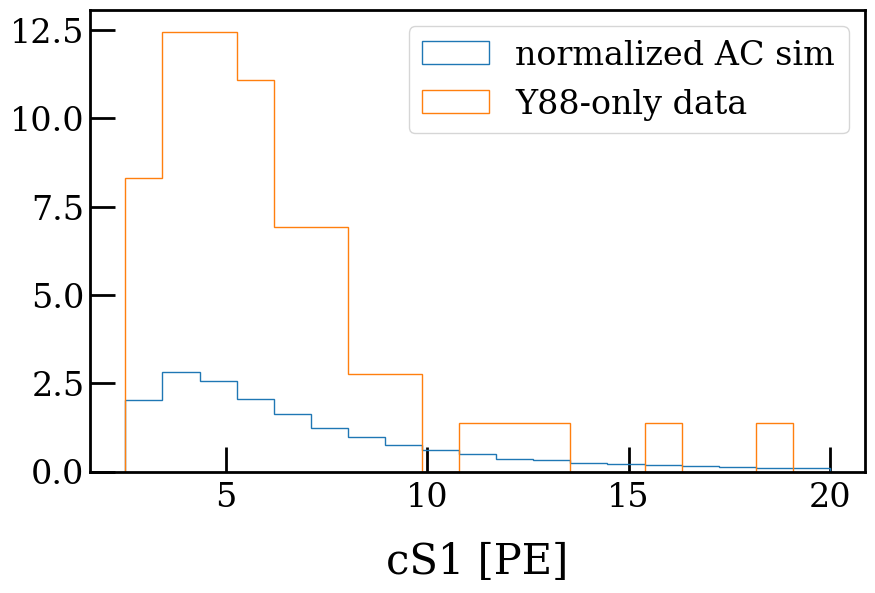

0.24028708701684007

In [176]:
plt.figure(figsize=(10,6))
d1=cut_cs1cs2(ac_sim_cuts,cs1=[2.5,20],cs2=[200,600])
d2=cut_cs1cs2(bkg_cuts,cs1=[2.5,20],cs2=[200,600])
bins=np.linspace(2.5,20,20)
h1=plt.hist(d1.cs1,bins=bins,histtype='step',weights=np.ones(len(d1))*bkg_sim_s*normalization,label='normalized AC sim')
h2=plt.hist(d2.cs1,bins=bins,histtype='step',weights=np.ones(len(d2))*bkg_s,label='Y88-only data')
plt.xlabel('cS1 [PE]')
# plt.ylabel('Counts')
plt.legend()
plt.show()
np.sum(h1[0])/np.sum(h2[0])